# Development: Drug2State - Drug clustering and prediction pluggin with molecular and functional casual semantics



- The rationale for developing the drug2state package stems from the need to harness the vast amount of information contained within drug-target interaction databases and multi-omic datasets, particularly those generated from single-cell RNA sequencing experiments. Traditional drug-target prediction approaches often yield large, unwieldy outputs with hundreds of potential gene targets for a single drug, making it challenging to extract meaningful insights or identify drugs with similar mechanistic actions.

- By integrating multiple kernels, including drug-gene prediction from cell scRNA expression (drug2cell output), drug-predicted gene overlap similarity, semantic descriptions embeddings from pre-trained language models (LLMs), and SMILES ChemBERTa embeddings, the drug2state package aims to provide a comprehensive landscape of drug similarity and mechanistic understanding.

- This integrated approach allows for the clustering of drugs based on their semantic, structural, and functional similarities, enabling the creation of a smooth manifold where drugs are grouped into clusters with semantic and causal meaning. Each cluster represents a distinct grouping of mechanistic action properties or biological programs, facilitating the identification of drugs with similar modes of action or therapeutic effects.

- The development of drug2state addresses the limitations of existing drug-target prediction methods by providing a systematic framework for analyzing drug-target interactions and identifying drugs with similar mechanistic actions. By leveraging transfer learning from pre-trained LLMs and advanced similarity analysis techniques, drug2state enables the extraction of actionable insights from complex multi-omic datasets, ultimately facilitating the discovery of novel drug candidates and the repurposing of existing drugs for specific perturbation cases.

In [1]:
import scanpy as sc
import drug2cell as d2c
import blitzgsea as blitz

import sys
import subprocess

#import pkg_resources
#required = {'harmonypy','sklearn','scanpy','pandas', 'numpy', 'bbknn', 'scipy', 'matplotlib', 'seaborn' ,'scipy'}
#installed = {pkg.key for pkg in pkg_resources.working_set}
#missing = required - installed
#if missing:
#    print("Installing missing packages:" )
#    print(missing)
#    python = sys.executable
#    subprocess.check_call([python, '-m', 'pip', 'install', *missing], stdout=subprocess.DEVNULL)

%matplotlib inline
from collections import Counter
from collections import defaultdict
import scanpy as sc
import pandas as pd
import pickle as pkl
import numpy as np
import scipy
import matplotlib.pyplot as plt
import re
import glob
import os
import sys
from numpy import cov
import scipy.cluster.hierarchy as spc
import seaborn as sns; sns.set(color_codes=True)
from sklearn.linear_model import LogisticRegression
import sklearn
from pathlib import Path
import seaborn as sns

# NLP
import scispacy
import spacy
#import en_core_sci_scibert

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, color_map='viridis')
sc.logging.print_versions()

-----
anndata     0.8.0
scanpy      1.9.8
-----
Cython              0.29.37
PIL                 10.2.0
asttokens           NA
blis                NA
blitzgsea           NA
catalogue           NA
certifi             2024.02.02
charset_normalizer  3.3.2
click               8.1.7
confection          NA
cycler              0.12.1
cymem               NA
cython              0.29.37
cython_runtime      NA
dateutil            2.9.0
debugpy             1.8.1
decorator           5.1.1
drug2cell           NA
exceptiongroup      1.2.0
executing           2.0.1
h5py                3.10.0
idna                3.6
igraph              0.11.4
ipykernel           6.14.0
jedi                0.19.1
jinja2              3.1.3
joblib              1.3.2
kiwisolver          1.4.5
langcodes           NA
leidenalg           0.10.2
llvmlite            0.42.0
markupsafe          2.1.5
matplotlib          3.8.3
matplotlib_inline   0.1.6
mpl_toolkits        NA
mpmath              1.3.0
murmurhash          NA
natsort 

In [2]:
import pandas as pd
import numpy as np
import scanpy as sc
from sklearn.metrics.pairwise import cosine_similarity
from sentence_transformers import SentenceTransformer
from transformers import AutoTokenizer, AutoModel
import torch
from scipy.special import softmax

class Drug2State:
    def __init__(self, adata, drug_gene_df, chembl_smiles_df, semantic_descriptors, chemberta_model='seyonec/ChemBERTa-zinc-base-v1'):
        """
        Initialize the Drug2State class with datasets and model parameters.

        :param adata: AnnData object containing single-cell expression data.
        :param drug_gene_df: DataFrame with drug-gene interactions.
        :param chembl_smiles_df: DataFrame with drugs and their corresponding SMILES strings.
        :param semantic_descriptors: List of columns in drug_gene_df for semantic analysis.
        :param chemberta_model: The ChemBERTa model for molecular structure analysis.
        """
        self.adata = adata
        self.drug_gene_df = drug_gene_df
        self.chembl_smiles_df = chembl_smiles_df
        self.semantic_descriptors = semantic_descriptors
        self.chemberta_model_name = chemberta_model
        self.semantic_model = SentenceTransformer('all-MiniLM-L6-v2')
        self.tokenizer, self.chemberta_model = self.load_chemberta_model_and_tokenizer(chemberta_model)
        
    def __init__(self, df, gene_column):
        """
        Initialize the Drug2State object with a DataFrame and the name of the column containing gene information.
        
        :param df: DataFrame containing drug-gene information.
        :param gene_column: The name of the column containing gene information.
        """
        self.df = df.copy()
        self.gene_column = gene_column
        self.mtx = {}  # Dictionary to store matrices of different weight types
        
        # Pre-process the gene data
        self._preprocess_genes()
        
    def _preprocess_genes(self):
        """
        Pre-process the gene data by converting the gene_column to lists of genes.
        """
        self.df['gene_list'] = self.df[self.gene_column].astype(str).str.split(',')
        self.df['gene_set'] = self.df['gene_list'].apply(set)
    
    def compute_gene_set_overlap(self):
        """
        Compute the overlap between gene sets of each pair of drugs and store the result as a "GSO" matrix.
        """
        # Compute overlaps
        overlap_df = self.df['gene_set'].apply(lambda x: self.df['gene_set'].apply(lambda y: self._compute_overlap(x, y)))
        
        # Normalize overlaps using softmax
        self.mtx['GSO'] = softmax(overlap_df.to_numpy(), axis=1)
        
        # Optionally, store the column names corresponding to the drugs
        self.mtx_name = overlap_df.columns.tolist()
    
    @staticmethod
    def _compute_overlap(set1, set2):
        """
        Compute the overlap between two sets of genes.
        
        :param set1: A set of genes.
        :param set2: Another set of genes.
        :return: The number of overlapping elements.
        """
        return len(set1.intersection(set2))
        
    def preprocess_data(self):
        """
        Preprocess the input dataframes for further analysis.
        """
        # Preprocess drug_gene_df as in your original code
        # Preprocess chembl_smiles_df as needed
        pass  # Placeholder for preprocessing code

    
    # load Chemberta
    def load_chemberta_model_and_tokenizer(self, model_name):
        """
        Load the ChemBERTa model and tokenizer.

        :param model_name: Name or path of the ChemBERTa model.
        :return: tokenizer, model
        """
        tokenizer = AutoTokenizer.from_pretrained(model_name)
        model = AutoModel.from_pretrained(model_name)
        return tokenizer, model
    
    # load BERT
    def generate_semantic_embeddings(self):
        """
        Generate semantic embeddings for the descriptors in drug_gene_df.
        """
        embeddings_dict = {}
        for column in self.semantic_descriptors:
            texts = self.drug_gene_df[column].dropna().unique().tolist()  # Ensure unique, non-NaN texts
            embeddings = self.semantic_model.encode(texts, show_progress_bar=True)
            for text, embedding in zip(texts, embeddings):
                embeddings_dict[text] = embedding
        return embeddings_dict

    def generate_smiles_embeddings(self):
        """
        Generate embeddings for SMILES strings using ChemBERTa.
        """
        smiles_list = self.chembl_smiles_df['db_x_smilescanonical_smiles'].dropna().unique().tolist()
        embeddings = []
        for smiles in smiles_list:
            inputs = self.tokenizer(smiles, return_tensors="pt", padding=True, truncation=True, max_length=512)
            with torch.no_grad():
                outputs = self.chemberta_model(**inputs)
            embeddings.append(torch.mean(outputs.last_hidden_state, dim=1).squeeze().numpy())
        return np.array(embeddings)
    
    
    def compute_similarity_matrices(self, semantic_embeddings, smiles_embeddings):
        """
        Compute similarity matrices based on semantic and SMILES embeddings.
        """
        # Compute similarity matrices here
        pass  # Placeholder for similarity computation code
    
    def integrate_similarity_matrices(self, similarity_matrices_dict):
        """
        Integrate different similarity matrices using a dot product approach.

        :param similarity_matrices_dict: Dictionary of similarity matrices.
        :return: Integrated similarity matrix.
        """
        # Dot product or other nuanced integration method
        pass  # Placeholder for integration code
    
    def run_analysis(self):
        """
        Main method to run the complete analysis workflow.
        """
        self.preprocess_data()
        semantic_embeddings = self.generate_semantic_embeddings()
        smiles_embeddings = self.generate_smiles_embeddings()
        # Further analysis steps here...

        

/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Run D2C with custom database

In [3]:
import pandas as pd
import drug2cell as d2c

In [ ]:
adata = sc.read('/nfs/team205/ig7/projects/SCC_nano_string/010523_project_restart/A1_series_khavari_nanostring_integration/khavari_data_HVG_raw.h5ad')
sc.pp.filter_cells(adata, min_genes=100)
adata.var_names_make_unique()

#original = pd.read_csv('/nfs/team205/ig7/projects/SCC_nano_string/drug2state/build_databases/A1_V3_IG_chembl_33_filtered_merged_genesymbols_humans.csv')

In [156]:
original = pd.read_csv('/nfs/team205/ig7/projects/SCC_nano_string/drug2state/build_databases/A1_V3_IG_chembl_33_filtered_merged_genesymbols_humans.csv')
#pChEMBL is -log10() as per https://chembl.gitbook.io/chembl-interface-documentation/frequently-asked-questions/chembl-data-questions#what-is-pchembl
thresholds_dict={
    'none':7.53, #30nM
    'NHR':7, #100nM
    'GPCR':7, #100nM
    'Ion Channel':5, #10uM
    'Kinase':6, #1uM
}

We'll add some more criteria to the filtering. For a comprehensive list of available options, consult the documentation.

In [157]:
filtered_df = d2c.chembl.filter_activities(
    dataframe=original,
    drug_max_phase=4,
    assay_type='F',
    add_drug_mechanism=True,
    remove_inactive=True,
    include_active=True,
    pchembl_target_column="target_class",
    pchembl_threshold=thresholds_dict
)
print(filtered_df.shape)

(41178, 63)


In [158]:
filtered_df.loc[filtered_df['molecule_dictionary|chembl_id'].isin(['CHEMBL1004'])]

,Unnamed: 0,activities|activity_id,activities|assay_id,activities|molregno,activities|pchembl_value,activities|type,activities|standard_relation,activities|standard_value,activities|standard_units,activities|standard_flag,...,target_components|component_id,db_x_smiles|molregno,db_x_smiles|canonical_smiles,db_x_ont|bao_id,db_x_ont|label,target_class,db_x_COMPONENT_GO|go_id,db_x_GO_CLASSIFICATION|path,keep,pchembl_active
28294,7036598,5789203.0,737344.0,111498.0,NaN,Potency,NaN,10000.0,nM,1.0,...,4553.0,111498.0,CN(C)CCOC(C)(c1ccccc1)c1ccccn1,BAO_0000019,assay format,none,GO:0008168; GO:0003682; GO:0046677; GO:0005575...,molecular_function catalytic activity transf...,True,False
28295,7036599,5789203.0,737344.0,111498.0,NaN,Potency,NaN,10000.0,nM,1.0,...,4553.0,111498.0,CN(C)CCOC(C)(c1ccccc1)c1ccccn1,BAO_0000019,assay format,none,GO:0008168; GO:0003682; GO:0046677; GO:0005575...,molecular_function catalytic activity transf...,True,False


In [159]:
#filtered_df.to_csv('/nfs/team205/ig7/projects/SCC_nano_string/drug2state/resources/A1_V2_IG_filtered_chembl_33_merged_genesymbols_humans.csv')

Now that we have our data frame subset to the drugs and targets of interest, we can convert them into a dictionary that can  be used by drug2cell. The exact form distributed with the package was created like so:

In [160]:
IG_custom_chembldict = d2c.chembl.create_drug_dictionary(
    filtered_df,
    drug_grouping='ATC_level'
)

In [ ]:
d2c.score(adata, targets= IG_custom_chembldict, nested=True, categories=None, method='mean', layer=None, use_raw=False, n_bins=25, ctrl_size=50)

In [ ]:
sc.tl.rank_genes_groups(adata.uns['drug2cell'], method="wilcoxon", groupby="level2_celltype")
sc.pl.rank_genes_groups_dotplot(adata.uns['drug2cell'], swap_axes=True, dendrogram=False, n_genes=5)

# Read D2C run from previous iteration
- This D2C run includes multiple perturbed states inc SCC, Eczema, PS, Healthy

In [4]:
adata = sc.read('//nfs/team205/ig7/projects/SCC_nano_string/drug2state/D2C_KH_SCC_PS_EZ_HL.h5ad')

In [9]:
adata.obs['Status'].unique()

['Eczema', 'Psoriasis', 'Healthy', 'SCC']
Categories (4, object): ['Eczema', 'Healthy', 'Psoriasis', 'SCC']

## Non-contrastive DE

In [11]:
plt.rcdefaults()

In [136]:
adata = adata_tt.T

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:04:38)


/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


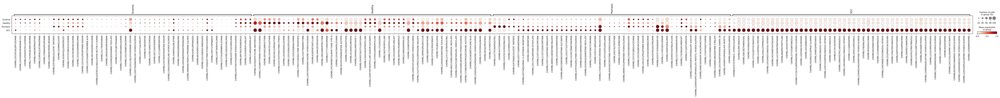

In [137]:
spot_var = 'Status'
keep_var = ['Eczema', 'Psoriasis', 'Healthy', 'SCC']


#adata_sl = adata[adata.obs[spot_var].isin(keep_var)]
sc.tl.rank_genes_groups(adata, method="wilcoxon", groupby=spot_var)
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
spot_var = 'Status'
DE = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals','logfoldchanges']}).head(500)
#DE_name ="./DEGS_gastrulation_211121.csv"
# DE.to_csv(DE_name)
degs = DE[:]
if 'concat' in locals() or 'concat' in globals():
    del(concat)
n = degs.loc[:, degs.columns.str.endswith("_n")]
n = pd.melt(n)
p = degs.loc[:, degs.columns.str.endswith("_p")]
p = pd.melt(p)
l = degs.loc[:, degs.columns.str.endswith("_l")]
l = pd.melt(l)
n = n.replace(regex=r'_n', value='')
n = n.rename(columns={"variable": "cluster", "value": "gene"})
p = (p.drop(["variable"],axis = 1)).rename(columns={ "value": "p_val"})
l = (l.drop(["variable"],axis = 1)).rename(columns={ "value": "logfc"})
concat = pd.concat([n,p,l],axis=1)
#remove mito genes from data
concat = concat[~concat["gene"].str.startswith("MT-")]
concat = concat[~concat["gene"].str.startswith("RP11-")]
concat["cluster"] = concat["cluster"].astype(str)
marker_df = concat.groupby('cluster').apply(lambda grp: grp.nsmallest(50, 'p_val')).reset_index(drop=True)
markers = marker_df.groupby('cluster')['gene'].apply(list).to_dict()
markers = dict(sorted(markers.items()))
markers = {str(k):v for k,v in markers.items()}
data_temp = adata
markers = markers
(sc.pl.dotplot(data_temp, var_names = markers, groupby=spot_var,dendrogram=False,standard_scale='var', color_map='Reds', show = True)) # title=i

## Contrastively run DE on just D2C to show random output issue for status
- run this on only healthy vs SCC total representation
- This might be run by cellstate in future

ranking genes


/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/contextlib.py:142: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:21)


/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


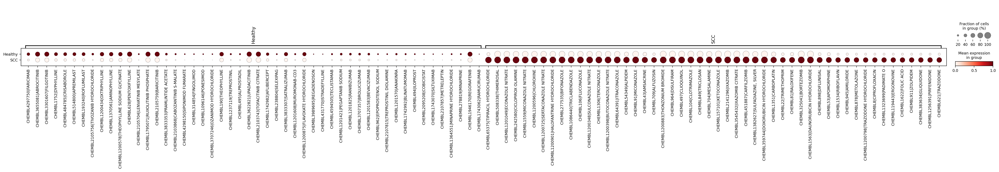

In [138]:
spot_var = 'Status'
keep_var = ['Healthy', 'SCC']
rm = list(adata_sl.obs.loc[(adata_sl.obs[spot_var].isin(['SCC'])) & ~(adata_sl.obs['batch_id'].str.contains('Tumor')) ].index)

# remove healthy from sl
adata_sl = adata[(adata.obs[spot_var].isin(keep_var)) & ~adata.obs.index.isin(rm)]

sc.tl.rank_genes_groups(adata_sl, method="wilcoxon", groupby=spot_var)
result = adata_sl.uns['rank_genes_groups']
groups = result['names'].dtype.names
spot_var = 'Status'
DE = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals','logfoldchanges']}).head(500)
#DE_name ="./DEGS_gastrulation_211121.csv"
# DE.to_csv(DE_name)
degs = DE[:]
if 'concat' in locals() or 'concat' in globals():
    del(concat)
n = degs.loc[:, degs.columns.str.endswith("_n")]
n = pd.melt(n)
p = degs.loc[:, degs.columns.str.endswith("_p")]
p = pd.melt(p)
l = degs.loc[:, degs.columns.str.endswith("_l")]
l = pd.melt(l)
n = n.replace(regex=r'_n', value='')
n = n.rename(columns={"variable": "cluster", "value": "gene"})
p = (p.drop(["variable"],axis = 1)).rename(columns={ "value": "p_val"})
l = (l.drop(["variable"],axis = 1)).rename(columns={ "value": "logfc"})
concat = pd.concat([n,p,l],axis=1)
#remove mito genes from data
concat = concat[~concat["gene"].str.startswith("MT-")]
concat = concat[~concat["gene"].str.startswith("RP11-")]
concat["cluster"] = concat["cluster"].astype(str)
marker_df = concat.groupby('cluster').apply(lambda grp: grp.nsmallest(50, 'p_val')).reset_index(drop=True)
markers = marker_df.groupby('cluster')['gene'].apply(list).to_dict()
markers = dict(sorted(markers.items()))
markers = {str(k):v for k,v in markers.items()}
markers = markers
(sc.pl.dotplot(adata_sl, var_names = markers, groupby=spot_var,dendrogram=False,standard_scale='var', color_map='Reds', show = True)) # title=i

# Contrastively predict drugs for malignant cellstates
- TSKs vs KCs
- CD8_EXH vs CD8
- CD4_EXH vs CD4sc.tl.rank_genes_groups(adata_sl, method="wilcoxon", groupby=spot_var,groups = pairs[key_p],key_added = key_p)

In [139]:
adata.obs['level4_celltype'] = adata.obs['tum.norm'].astype(str)+'_' + adata.obs['level3_celltype'].astype(str).str.replace('Tumor_','').str.replace('Normal_','')
spot_var = 'level4_celltype'
keep_var = ['SCC']
# cell_state_var = 'level4_celltype'
pairs = {
'TSK_basal':['Tumor_TSK','Normal_KC_Basal'],
'TSK_Diff':['Tumor_TSK','Normal_KC_Diff'],
'CD8_Exh_CD8_EMRA':['Tumor_CD8_Exh','Normal_CD8_EMRA'],
'CD8_Exh_CD8_EM':['Tumor_CD8_Exh','Normal_CD8_EM'],
'CD8_Exh_CD8_Naive':['Tumor_CD8_Exh','Normal_CD8_Naive'],
}

# remove healthy from sl
adata_sl = adata[(adata.obs['Status'].isin(keep_var))]

result_dic = {}
marker_dict = {}
for key_p in pairs.keys():
    print(key_p)
    sc.tl.rank_genes_groups(adata_sl, method="wilcoxon", groupby=spot_var,groups = pairs[key_p],key_added = key_p)
    result_dic[key_p] = adata_sl.uns[key_p]
    groups = result_dic[key_p]['names'].dtype.names
    DE = pd.DataFrame(
    {group + '_' + key[:1]: result_dic[key_p][key][group]
    for group in groups for key in ['names', 'pvals','logfoldchanges']}).head(500)
    degs = DE[:]
    if 'concat' in locals() or 'concat' in globals():
        del(concat)
    n = degs.loc[:, degs.columns.str.endswith("_n")]
    n = pd.melt(n)
    p = degs.loc[:, degs.columns.str.endswith("_p")]
    p = pd.melt(p)
    l = degs.loc[:, degs.columns.str.endswith("_l")]
    l = pd.melt(l)
    n = n.replace(regex=r'_n', value='')
    n = n.rename(columns={"variable": "cluster", "value": "gene"})
    p = (p.drop(["variable"],axis = 1)).rename(columns={ "value": "p_val"})
    l = (l.drop(["variable"],axis = 1)).rename(columns={ "value": "logfc"})
    concat = pd.concat([n,p,l],axis=1)
    #remove mito genes from data
    concat = concat[~concat["gene"].str.startswith("MT-")]
    concat = concat[~concat["gene"].str.startswith("RP11-")]
    concat["cluster"] = concat["cluster"].astype(str)
    marker_df = concat.groupby('cluster').apply(lambda grp: grp.nsmallest(50, 'p_val')).reset_index(drop=True)
    markers = marker_df.groupby('cluster')['gene'].apply(list).to_dict()
    markers = dict(sorted(markers.items()))
    markers = {str(k):v for k,v in markers.items()}
    markers = {key: value for key, value in markers.items() if 'Normal' not in key}
    markers[key_p] = markers.pop(list(markers.keys())[0])
    #markers.pop(list(markers.keys())[1])
    marker_dict.update(markers)
    

TSK_basal
ranking genes


/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/contextlib.py:142: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


    finished: added to `.uns['TSK_basal']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:14)
TSK_Diff
ranking genes
    finished: added to `.uns['TSK_Diff']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:11)
CD8_Exh_CD8_EMRA
ranking genes
    finished: added to `.uns['CD8_Exh_CD8_EMRA']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed

In [140]:
marker_dict

{'TSK_basal': ['CHEMBL1201607|NATALIZUMAB',
  'CHEMBL2095222|OCRIPLASMIN',
  'CHEMBL15023|TRIFLUPERIDOL',
  'CHEMBL267936|MECAMYLAMINE',
  'CHEMBL159226|MOXISYLYTE',
  'CHEMBL1094|FELBAMATE',
  'CHEMBL13828|OXATOMIDE',
  'CHEMBL276832|HYDRALAZINE',
  'CHEMBL1382627|SULFADIAZINE, SILVER',
  'CHEMBL1096|AMLEXANOX',
  'CHEMBL3039540|ADUCANUMAB',
  'CHEMBL1590|PSEUDOEPHEDRINE',
  'CHEMBL1401|NITAZOXANIDE',
  'CHEMBL1448|NICLOSAMIDE',
  'CHEMBL3989740|DOXYCYCLINE HYCLATE',
  'CHEMBL2364574|DOXYCYCLINE CALCIUM',
  'CHEMBL1200699|DOXYCYCLINE',
  'CHEMBL2108709|COLLAGENASE CLOSTRIDIUM HISTOLYTICUM',
  'CHEMBL1201037|EFLORNITHINE HYDROCHLORIDE',
  'CHEMBL325041|BORTEZOMIB',
  'CHEMBL451887|CARFILZOMIB',
  'CHEMBL3545432|IXAZOMIB CITRATE',
  'CHEMBL2141296|IXAZOMIB',
  'CHEMBL1514715|ETHAMSYLATE',
  'CHEMBL333826|DEQUALINIUM',
  'CHEMBL927|CEFDINIR',
  'CHEMBL771|CYCLOSERINE',
  'CHEMBL564|PROMAZINE',
  'CHEMBL998|LORATADINE',
  'CHEMBL1357648|AMODIAQUINE HYDROCHLORIDE',
  'CHEMBL1002|LEVOSALBUT

/tmp/ipykernel_206/669596462.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  plt_data.obs[spot_var] = plt_data.obs[spot_var].astype('category').cat.reorder_categories(['Tumor_TSK','Tumor_CD8_Exh'])
/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


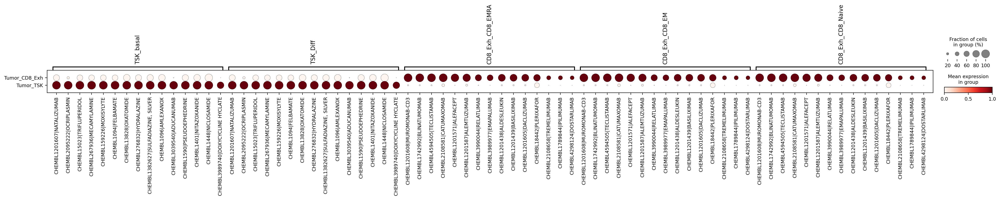

In [118]:
plt_data = adata_sl[adata_sl.obs[spot_var].isin(['Tumor_TSK','Tumor_CD8_Exh'])]
plt_data.obs[spot_var] = plt_data.obs[spot_var].astype('category').cat.reorder_categories(['Tumor_TSK','Tumor_CD8_Exh'])
(sc.pl.dotplot(adata_sl[adata_sl.obs[spot_var].isin(['Tumor_TSK','Tumor_CD8_Exh'])], var_names = marker_dict, groupby=spot_var,dendrogram=False,standard_scale='var', color_map='Reds', show = True)) # title=i

{'TSK_basal': ['CHEMBL1201607|NATALIZUMAB', 'CHEMBL2095222|OCRIPLASMIN', 'CHEMBL15023|TRIFLUPERIDOL', 'CHEMBL267936|MECAMYLAMINE', 'CHEMBL159226|MOXISYLYTE', 'CHEMBL1094|FELBAMATE', 'CHEMBL13828|OXATOMIDE', 'CHEMBL276832|HYDRALAZINE', 'CHEMBL1382627|SULFADIAZINE, SILVER', 'CHEMBL1096|AMLEXANOX', 'CHEMBL3039540|ADUCANUMAB', 'CHEMBL1590|PSEUDOEPHEDRINE', 'CHEMBL1401|NITAZOXANIDE', 'CHEMBL1448|NICLOSAMIDE', 'CHEMBL3989740|DOXYCYCLINE HYCLATE', 'CHEMBL2364574|DOXYCYCLINE CALCIUM', 'CHEMBL1200699|DOXYCYCLINE', 'CHEMBL2108709|COLLAGENASE CLOSTRIDIUM HISTOLYTICUM', 'CHEMBL1201037|EFLORNITHINE HYDROCHLORIDE', 'CHEMBL325041|BORTEZOMIB', 'CHEMBL451887|CARFILZOMIB', 'CHEMBL3545432|IXAZOMIB CITRATE', 'CHEMBL2141296|IXAZOMIB', 'CHEMBL1514715|ETHAMSYLATE', 'CHEMBL333826|DEQUALINIUM', 'CHEMBL927|CEFDINIR', 'CHEMBL771|CYCLOSERINE', 'CHEMBL564|PROMAZINE', 'CHEMBL998|LORATADINE', 'CHEMBL1357648|AMODIAQUINE HYDROCHLORIDE'], 'CD8_Exh_CD8_EMRA': ['CHEMBL1201608|MUROMONAB-CD3', 'CHEMBL1742992|BLINATUMOMAB',

/tmp/ipykernel_206/2632088512.py:14: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  plt_data.obs[spot_var] = plt_data.obs[spot_var].astype('category').cat.reorder_categories(['Tumor_TSK','Tumor_CD8_Exh'])
/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


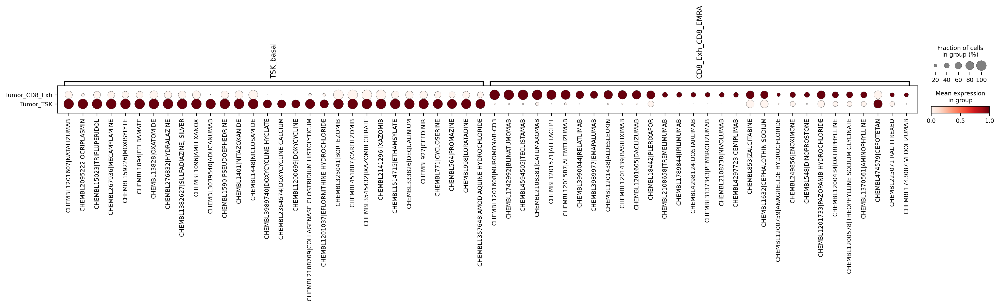

In [138]:
seen_items = set()
filtered_markers = {}

for key, items in marker_dict.items():
    filtered_markers[key] = []
    for item in items:
        if item not in seen_items:
            seen_items.add(item)
            filtered_markers[key].append(item)
filtered_markers = {k: v for k, v in filtered_markers.items() if v}

print(filtered_markers)
plt_data = adata_sl[adata_sl.obs[spot_var].isin(['Tumor_TSK','Tumor_CD8_Exh'])]
plt_data.obs[spot_var] = plt_data.obs[spot_var].astype('category').cat.reorder_categories(['Tumor_TSK','Tumor_CD8_Exh'])
(sc.pl.dotplot(adata_sl[adata_sl.obs[spot_var].isin(['Tumor_TSK','Tumor_CD8_Exh'])], var_names = filtered_markers, groupby=spot_var,dendrogram=False,standard_scale='var', color_map='Reds', show = True)) # title=i

In [202]:
filtered_df.loc[filtered_df['molecule_dictionary|chembl_id'].isin(['CEMIPLIMAB'])]

,Unnamed: 0,activities|activity_id,activities|assay_id,activities|molregno,activities|pchembl_value,activities|type,activities|standard_relation,activities|standard_value,activities|standard_units,activities|standard_flag,...,target_components|component_id,db_x_smiles|molregno,db_x_smiles|canonical_smiles,db_x_ont|bao_id,db_x_ont|label,target_class,db_x_COMPONENT_GO|go_id,db_x_GO_CLASSIFICATION|path,keep,pchembl_active


In [203]:
filtered_df.loc[filtered_df['molecule_dictionary|chembl_id'].isin(['PEMBROLIZUMAB'])]

,Unnamed: 0,activities|activity_id,activities|assay_id,activities|molregno,activities|pchembl_value,activities|type,activities|standard_relation,activities|standard_value,activities|standard_units,activities|standard_flag,...,target_components|component_id,db_x_smiles|molregno,db_x_smiles|canonical_smiles,db_x_ont|bao_id,db_x_ont|label,target_class,db_x_COMPONENT_GO|go_id,db_x_GO_CLASSIFICATION|path,keep,pchembl_active


In [139]:
filtered_markers

{'TSK_basal': ['CHEMBL1201607|NATALIZUMAB',
  'CHEMBL2095222|OCRIPLASMIN',
  'CHEMBL15023|TRIFLUPERIDOL',
  'CHEMBL267936|MECAMYLAMINE',
  'CHEMBL159226|MOXISYLYTE',
  'CHEMBL1094|FELBAMATE',
  'CHEMBL13828|OXATOMIDE',
  'CHEMBL276832|HYDRALAZINE',
  'CHEMBL1382627|SULFADIAZINE, SILVER',
  'CHEMBL1096|AMLEXANOX',
  'CHEMBL3039540|ADUCANUMAB',
  'CHEMBL1590|PSEUDOEPHEDRINE',
  'CHEMBL1401|NITAZOXANIDE',
  'CHEMBL1448|NICLOSAMIDE',
  'CHEMBL3989740|DOXYCYCLINE HYCLATE',
  'CHEMBL2364574|DOXYCYCLINE CALCIUM',
  'CHEMBL1200699|DOXYCYCLINE',
  'CHEMBL2108709|COLLAGENASE CLOSTRIDIUM HISTOLYTICUM',
  'CHEMBL1201037|EFLORNITHINE HYDROCHLORIDE',
  'CHEMBL325041|BORTEZOMIB',
  'CHEMBL451887|CARFILZOMIB',
  'CHEMBL3545432|IXAZOMIB CITRATE',
  'CHEMBL2141296|IXAZOMIB',
  'CHEMBL1514715|ETHAMSYLATE',
  'CHEMBL333826|DEQUALINIUM',
  'CHEMBL927|CEFDINIR',
  'CHEMBL771|CYCLOSERINE',
  'CHEMBL564|PROMAZINE',
  'CHEMBL998|LORATADINE',
  'CHEMBL1357648|AMODIAQUINE HYDROCHLORIDE'],
 'CD8_Exh_CD8_EMRA': ['

# Cont.

In [140]:
adata.uns['drug2cell'] = adata

# D2C modules

In [141]:
# Embeddings are stored as a nested dictionary
embeddings_dic = {}
# Weights are stored as a nested dictionary
weights_dic = {}

## Module 1: Geneset overlap between drugs
- We first compute a set of embeddings across geneset overlaps
- We then process this with linear decomposition into eigen vectors
- Compute neighborhoods based on these eigenvectors
- Representaitons are softmax transformed & activation function is applied

In [142]:
df = adata.uns['drug2cell'].var
drug2state = Drug2State(df, 'all_genes')
drug2state.compute_gene_set_overlap()
# Access the normalized weight matrix for gene set overlaps
gso_weights = pd.DataFrame(drug2state.mtx['GSO'],index=drug2state.df.index,columns = drug2state.df.index)
gso_weights.head(5)

,CHEMBL1200797|TECHNETIUM TC 99M SUCCIMER,CHEMBL1615779|IOBENGUANE I 131,CHEMBL3989924|LUTETIUM DOTATATE LU-177,CHEMBL2108709|COLLAGENASE CLOSTRIDIUM HISTOLYTICUM,CHEMBL256997|ATALUREN,CHEMBL4297240|ONASEMNOGENE ABEPARVOVEC,CHEMBL1201556|BECAPLERMIN,CHEMBL867|IOPANOIC ACID,CHEMBL1200689|NITRIC OXIDE,CHEMBL2010601|IVACAFTOR,...,CHEMBL2068724|ACAMPROSATE CALCIUM,CHEMBL306823|SODIUM DICHLOROACETATE,CHEMBL2218917|CEVIMELINE HYDROCHLORIDE,CHEMBL3989519|DOXAPRAM HYDROCHLORIDE,CHEMBL2104793|PYROVALERONE HYDROCHLORIDE,CHEMBL4297064|MILNACIPRAN HYDROCHLORIDE,CHEMBL2062257|BRIMONIDINE TARTRATE,CHEMBL1200479|DICYCLOMINE HYDROCHLORIDE,CHEMBL2110368|BETHANIDINE SULFATE,CHEMBL1590946|CEFSULODIN SODIUM
CHEMBL1200797|TECHNETIUM TC 99M SUCCIMER,1.101090e-03,4.050685e-04,4.050685e-04,4.050685e-04,4.050685e-04,4.050685e-04,4.050685e-04,4.050685e-04,4.050685e-04,4.050685e-04,...,4.050685e-04,4.050685e-04,4.050685e-04,4.050685e-04,4.050685e-04,4.050685e-04,4.050685e-04,4.050685e-04,4.050685e-04,4.050685e-04
CHEMBL1615779|IOBENGUANE I 131,3.880526e-04,1.054836e-03,3.880526e-04,3.880526e-04,3.880526e-04,3.880526e-04,3.880526e-04,3.880526e-04,3.880526e-04,3.880526e-04,...,3.880526e-04,3.880526e-04,3.880526e-04,3.880526e-04,1.054836e-03,1.054836e-03,3.880526e-04,3.880526e-04,1.054836e-03,3.880526e-04
CHEMBL3989924|LUTETIUM DOTATATE LU-177,3.454831e-04,3.454831e-04,5.127424e-02,3.454831e-04,3.454831e-04,3.454831e-04,3.454831e-04,3.454831e-04,3.454831e-04,3.454831e-04,...,3.454831e-04,3.454831e-04,3.454831e-04,3.454831e-04,3.454831e-04,3.454831e-04,3.454831e-04,3.454831e-04,3.454831e-04,3.454831e-04
CHEMBL2108709|COLLAGENASE CLOSTRIDIUM HISTOLYTICUM,6.943972e-12,6.943972e-12,6.943972e-12,5.000000e-01,6.943972e-12,6.943972e-12,6.943972e-12,6.943972e-12,6.943972e-12,6.943972e-12,...,6.943972e-12,6.943972e-12,6.943972e-12,6.943972e-12,6.943972e-12,6.943972e-12,6.943972e-12,6.943972e-12,6.943972e-12,6.943972e-12
CHEMBL256997|ATALUREN,6.639677e-36,6.639677e-36,6.639677e-36,6.639677e-36,1.000000e+00,6.639677e-36,6.639677e-36,6.639677e-36,6.639677e-36,6.639677e-36,...,6.639677e-36,6.639677e-36,6.639677e-36,6.639677e-36,6.639677e-36,6.639677e-36,6.639677e-36,6.639677e-36,6.639677e-36,6.639677e-36


In [143]:
# Assign weights & embeddings
embeddings_dic['GSO'] = gso_weights
weights_dic['GSO'] = drug2state.mtx['GSO']

# Module 2: Drug_state_usage_profiles
- Learn some representation of drug-gene prediction profiles acrtoss cells. 

In [144]:
adata_tt = adata.uns['drug2cell'].T #flip the data to access pca by drugs instead of by cell
sc.pp.pca(adata_tt)
sc.pp.neighbors(adata_tt, n_neighbors=15, method='umap', metric='euclidean', key_added=None, copy=False)
# Assign weights & embeddings
embeddings_dic['DSU'] = adata_tt.obsm['X_pca']
weights_dic['DSU'] = adata_tt.obsp['connectivities']

computing PCA
    with n_comps=50
    finished (0:03:45)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:14)


# Module 3: LLM - Drug mechanism semantincs

# Generating Embeddings with a Pre-trained Language Model
- For this module, we'll use the sentence-transformers library, which provides a convenient way to generate sentence embeddings using pre-trained models. The library offers a variety of models specifically fine-tuned for generating semantically meaningful sentence embeddings.

## Implementation Notes:
- Ensure you have the sentence-transformers library installed in your 
environment. If not, you can install it using pip (pip install sentence-transformers).
- We'll select a suitable pre-trained model from the sentence-transformers library. A good default choice is 'all-MiniLM-L6-v2', which is a lightweight model that offers a good balance between performance and computational efficiency.
- The embeddings for each drug description will be generated and stored in a list or array. These embeddings can then be used to calculate pairwise cosine similarities, forming the basis of the similarity matrix.


## Methodology Overview:
In this approach, a pre-trained Language Model (LLM), specifically sourced from the Hugging Face's sentence-transformers library, is employed to generate semantically meaningful representations of textual data related to drugs. The underlying rationale is to leverage the advanced natural language processing capabilities of models like 'all-MiniLM-L6-v2', which have been fine-tuned for understanding and encapsulating the semantic essence of text in high-dimensional vector spaces.

- Data Preprocessing: Initial stages involve rigorous preprocessing of textual data, encompassing lowercase conversion, punctuation removal, and optional stop word elimination. This step ensures the textual input to the model is standardized and free from common linguistic redundancies.
- Aggregation of Drug Descriptions: Given the presence of multiple entries per drug, the data is aggregated to compile a unified, comma-separated representation of textual descriptors for each unique drug identifier. This aggregation not only consolidates the data but also ensures the uniqueness of textual information, enhancing the quality of semantic embeddings.
- Semantic Embedding Generation: The pre-trained LLM from the sentence-transformers library is then applied to these aggregated textual descriptors. The model generates dense vector embeddings that capture the nuanced semantic relationships and contextual meanings embedded within the drug descriptions.
- Rationale for Using Pre-trained LLMs: The choice of a pre-trained LLM is driven by the need for a sophisticated understanding of complex biomedical text, which often encompasses domain-specific terminology and intricate descriptions of mechanisms of action. Pre-trained models offer a substantial foundation of general language understanding, which, when applied to specialized domains, can significantly enhance the extraction of meaningful semantic patterns.
- Significance and Application:
Semantic Similarity Assessment: The high-dimensional embeddings serve as a basis for computing semantic similarities between drugs, facilitating the construction of a similarity matrix. This matrix is instrumental in identifying drugs with similar mechanisms or descriptors, thereby enabling nuanced clustering and classification tasks.
- Downstream Analysis: The embeddings and resultant similarity assessments provide a foundational layer for more advanced analyses, such as drug repositioning, understanding drug-target interactions, and exploring novel therapeutic pathways.
In summary, this approach harnesses the power of pre-trained LLMs to transform complex drug-related textual data into semantically rich vector embeddings. This transformation is pivotal for subsequent analytical tasks, offering a deepened understanding of drug similarities and differences based on their descriptive profiles.

# V1

In [145]:
import pandas as pd
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Ensure NLTK stop words are downloaded
import nltk
nltk.download('punkt')
nltk.download('stopwords')

import pandas as pd
import re
from nltk.corpus import stopwords

# Ensure NLTK stop words are downloaded
import nltk
nltk.download('punkt')
nltk.download('stopwords')

def preprocess_text_vectorized(series, remove_stopwords=True):
    """
    Vectorized preprocessing of a Pandas Series by converting to lowercase, removing punctuation,
    and optionally removing stop words.

    Parameters:
    - series: Pandas Series, the series containing text to preprocess.
    - remove_stopwords: bool, whether to remove stop words from the text.

    Returns:
    - series: Pandas Series, the preprocessed text series.
    """
    # Ensure the series is in string format
    series = series.astype(str)
    
    # Convert text to lowercase
    series = series.str.lower()
    
    # Remove punctuation
    series = series.str.replace(r'[^\w\s]', '', regex=True)
    
    if remove_stopwords:
        # Load stop words
        stop_words = set(stopwords.words('english'))
        
        # Tokenize and remove stop words
        series = series.apply(lambda x: ' '.join([word for word in x.split() if word not in stop_words]))

    return series

def preprocess_columns_vectorized(df, columns, drug_name_column, remove_stopwords=True):
    """
    Apply vectorized text preprocessing to specified columns of a DataFrame, aggregate
    multiple rows per drug into a single row with comma-separated unique values, and
    remove NaN values during aggregation.

    Parameters:
    - df: Pandas DataFrame, the DataFrame containing the text to preprocess.
    - columns: list, a list of column names to preprocess.
    - drug_name_column: str, the column name that contains the unique drug identifier.
    - remove_stopwords: bool, whether to remove stop words from the text.

    Returns:
    - df_aggregated: Pandas DataFrame, the DataFrame with preprocessed, aggregated,
      and NaN-filtered text columns.
    """
    # Preprocess each column
    for column in columns:
        df[column] = preprocess_text_vectorized(df[column], remove_stopwords)

    # Define aggregation function to join unique, non-NaN values
    def unique_non_nan_join(series):
        # Filter out NaN values, convert to set for uniqueness, then join with comma
        unique_values = set(series.dropna())
        if len(unique_values) == 0:
            return pd.NA  # Return a single NaN value if no information remains
        return ', '.join(unique_values)

    # Apply aggregation function to each column
    aggregation_functions = {column: unique_non_nan_join for column in columns}
    df_aggregated = df.groupby(drug_name_column, as_index=False).agg(aggregation_functions)

    return df_aggregated

from sentence_transformers import SentenceTransformer
import numpy as np

def generate_embeddings(df, columns,combine=False, model_name='all-MiniLM-L6-v2'):
    """
    Generate embeddings for text data in specified columns of a DataFrame using a pre-trained model.

    Parameters:
    - df: Pandas DataFrame, the DataFrame containing preprocessed text data.
    - columns: list, a list of column names for which to generate embeddings.
    - model_name: str, the name of the pre-trained model to use for generating embeddings.

    Returns:
    - embeddings_dict: dict, a dictionary where keys are column names and values are lists of embeddings.
    """
    model = SentenceTransformer(model_name)
    embeddings_dict = {}
    
    if combine == True:
            print(f"Generating combined embeddings...")
            embeddings = model.encode(df[columns].apply(lambda row: '.'.join([str(val) for val in row if pd.notna(val) and str(val).lower() != 'nan']), axis=1), show_progress_bar=True)
            embeddings_dict["combined_embeddings"] = embeddings
    else:
        for column in columns:
            print(f"Generating embeddings for {column}...")
            embeddings = model.encode(df[column].tolist(), show_progress_bar=True)
            embeddings_dict[column] = embeddings
        
    
    
    return embeddings_dict

from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd

def calculate_similarity_matrix(embeddings_dict):
    """
    Calculate the pairwise cosine similarity matrix for drug embeddings.

    Parameters:
    - embeddings_dict: dict, a dictionary where keys are column names and values are lists of embeddings.

    Returns:
    - similarity_matrix: Pandas DataFrame, a DataFrame where each element [i, j] represents the
      average cosine similarity between drugs i and j across all considered descriptions.
    """
    # Initialize a list to store the similarity matrices for each column
    similarity_matrices = []

    for column, embeddings in embeddings_dict.items():
        # Calculate pairwise cosine similarity for this column's embeddings
        similarity_matrix = cosine_similarity(embeddings)
        similarity_matrices.append(similarity_matrix)
    
    # Calculate the average similarity matrix across all columns
    average_similarity_matrix = np.mean(similarity_matrices, axis=0)
    
    
    # Convert the average similarity matrix to a DataFrame for easier handling
    similarity_matrix_df = pd.DataFrame(average_similarity_matrix)

    return similarity_matrix_df



# V3

from sentence_transformers import SentenceTransformer
import numpy as np

def generate_concatenated_embeddings(df, columns, model_name='all-MiniLM-L6-v2'):
    """
    Generate concatenated embeddings for text data in specified columns of a DataFrame using a pre-trained model.

    Parameters:
    - df: Pandas DataFrame, the DataFrame containing preprocessed text data.
    - columns: list, a list of column names for which to generate embeddings.
    - model_name: str, the name of the pre-trained model to use for generating embeddings.

    Returns:
    - concatenated_embeddings: numpy array, an array where each row is the concatenated embedding for a drug.
    """
    
    
    models_dict = {
    'all-MiniLM-L6-v2': {
        'library': 'sentence_transformers',
        'description': 'A general-purpose compact model suitable for a wide range of tasks.'
    },
    'BioBERT': {
        'library': 'transformers',
        'description': 'A domain-specific model pre-trained on large-scale biomedical corpora.',
        'installation': 'pip install transformers'
    },
    'BlueBERT': {
        'library': 'transformers',
        'description': 'Pre-trained on PubMed abstracts and MIMIC-III clinical notes, suitable for biomedical text mining.',
        'installation': 'pip install transformers'
    },
    'PubMedBERT': {
        'library': 'transformers',
        'description': 'BERT model pre-trained on PubMed articles, optimized for biomedical NLP tasks.',
        'installation': 'pip install transformers'
    }
}
    
    model = SentenceTransformer(model_name)
    concatenated_embeddings = []

    # Generate embeddings and concatenate them for each row
    for index, row in df.iterrows():
        row_embeddings = []
        for column in columns:
            text = str(row[column]) if pd.notna(row[column]) and str(row[column]).lower() != 'nan' else ''
            embedding = model.encode(text, show_progress_bar=False)
            row_embeddings.append(embedding)
        concatenated_embeddings.append(np.concatenate(row_embeddings))

    return np.array(concatenated_embeddings)


[nltk_data] Downloading package punkt to /home/jovyan/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /home/jovyan/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /home/jovyan/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /home/jovyan/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


# V2 Generating Embeddings via feature extraction with Language Models and Advanced Preprocessing Techniques

In this revised methodology, we extend our approach to leverage not only pre-trained language models from the `sentence-transformers` and `transformers` libraries for generating semantically meaningful embeddings but also employ advanced preprocessing techniques, including SciSpaCy for domain-specific text normalization. This combination enhances the embeddings' ability to capture the semantic nuances of biomedical texts.

## Implementation Notes:
- **Prerequisites**: Ensure the `sentence-transformers`, `transformers`, and `scispacy` libraries, along with a SciSpaCy model such as `en_core_sci_sm`, are installed in your environment.
- **Model Selection**: We utilize models like 'all-MiniLM-L6-v2' from the `sentence-transformers` library for their balance between performance and computational efficiency. Additionally, we consider domain-specific models from the `transformers` library, such as 'dmis-lab/biobert-v1.1', to cater to the specialized nature of biomedical texts.
- **Advanced Text Preprocessing**: Employ SciSpaCy for lemmatization and domain-specific text normalization. This step is crucial for handling biomedical terminology and ensuring the input text is in a standardized form suitable for semantic analysis.
- **Embedding Generation**: The embeddings are generated by processing the preprocessed text through the selected models, resulting in dense vector representations that encapsulate the semantic content of the text.

## Methodology Overview:
This refined approach integrates advanced NLP models and preprocessing techniques to generate high-quality semantic embeddings of biomedical text, capturing the intricate semantic relationships inherent in domain-specific descriptions.

1. **Advanced Preprocessing**: Utilizing SciSpaCy, we perform lemmatization and domain-specific normalization on the textual data. This preprocessing step ensures that the text is optimally prepared for semantic analysis, enhancing the model's ability to understand complex biomedical terms and concepts.

2. **Combining Textual Data**: To enrich the context provided to the embedding models, we combine text from multiple relevant columns for each data entry. This aggregation captures a broader semantic landscape, providing the models with comprehensive information to generate more accurate and representative embeddings.

3. **Semantic Embedding Generation with Domain-Specific Models**: We leverage both general-purpose models like 'all-MiniLM-L6-v2' and domain-specific models such as 'dmis-lab/biobert-v1.1'. The choice of model depends on the task at hand, with domain-specific models offering enhanced performance on biomedical texts due to their training on relevant corpora.

4. **Rationale for Method Choices**:
    - **SciSpaCy Preprocessing**: Essential for dealing with the specialized vocabulary and complex syntactic structures common in biomedical texts, ensuring that the input to the embedding models is clean and standardized.
    - **Model Diversity**: The selection of both general-purpose and domain-specific models allows for flexibility in handling a wide range of texts, from general descriptions to highly specialized biomedical literature.

5. **Applications and Implications**:
    - **Semantic Similarity and Clustering**: The generated embeddings enable the computation of semantic similarities between text entries, facilitating tasks such as clustering and the identification of related entities.
    - **Enhanced Drug Discovery and Research**: The rich semantic embeddings can be instrumental in drug discovery processes, offering insights into drug mechanisms, potential repurposing opportunities, and novel therapeutic targets.

In conclusion, this comprehensive approach, combining advanced preprocessing with the strategic use of both general and domain-specific language models, provides a robust framework for generating semantically rich embeddings of biomedical text. These embeddings are foundational for a myriad of analytical and discovery tasks within the biomedical domain, offering nuanced insights and enhancing the understanding of complex relationships in biomedical data.


## Lemmatization
Process: Lemmatization is performed using SciSpaCy, specifically with the en_core_sci_md model. This process involves reducing words to their base or dictionary form (lemma). For instance, "running" becomes "run", and "mice" become "mouse".
Purpose: The aim is to normalize the text, reducing the variability of word forms and focusing on the essential meaning of the words. In the biomedical domain, where terminology is crucial, this helps in standardizing different forms of medical terms to their root form, ensuring consistency in processing and analysis.
Component Choice: SciSpaCy is chosen for its optimization in the biomedical domain, providing models trained on medical corpora that are more adept at understanding biomedical terminology than general-purpose NLP tools.
## Tokenization
Process: Following lemmatization, the processed text is passed to a pre-trained transformer model, which begins with tokenization. This step is performed by the transformer's associated tokenizer (e.g., AutoTokenizer for Hugging Face models). Tokenization involves breaking down text into smaller units (tokens) that the model can understand, often words or subwords.
Purpose: Tokenization is essential for transforming natural language text into a format that can be processed by neural networks. It also allows the model to handle a wide range of vocabulary, including out-of-vocabulary words, by breaking them down into subword tokens.
Component Choice: Each transformer model comes with its tokenizer, trained to optimally tokenize text in a manner consistent with the model's training. Using the model-specific tokenizer ensures compatibility and maximizes the model's performance.
## Embedding Generation
Process: Once the text is tokenized, it's input into a pre-trained transformer model (e.g., BioBERT, BlueBERT, MiniLM). The model processes the tokenized text through multiple layers of self-attention and feedforward networks, ultimately producing contextual embeddings for each token.
Purpose: The generated embeddings are high-dimensional vector representations of tokens that capture semantic meanings and contextual relationships. Unlike static word embeddings, these contextual embeddings reflect the usage of words within the specific context they appear, allowing for a nuanced understanding of text.
Component Choice: Pre-trained transformer models are selected based on their training corpus and intended application. For biomedical text processing, models like BioBERT or BlueBERT are preferred as they are trained on biomedical literature, making them more adept at capturing the nuances of medical terminology and concepts.
Final Embedding Aggregation: For each piece of text, embeddings of individual tokens are aggregated (e.g., by taking the mean) to produce a single embedding vector that represents the entire text. This vector can then be used for downstream tasks like similarity comparison, clustering, or classification.
## Summary of Workflow and Rationale
- Lemmatization with SciSpaCy: Standardizes word forms to their base form, particularly useful in the biomedical domain for consistency in terminology.
- Tokenization with Transformer's Tokenizer: Breaks down the lemmatized text into tokens that the transformer model can process, using subword tokenization to handle a broad vocabulary.
- Contextual Embedding Generation with Transformer Models: Produces rich, contextualized representations of text, leveraging the advanced capabilities of models like BioBERT and BlueBERT, which are specifically tuned for biomedical contexts.
This workflow leverages the strengths of specialized tools at each stage, from lemmatization with SciSpaCy to contextualized embeddings with transformers, to process and analyze biomedical text effectively. Each component is chosen for its suitability to the task and the domain, ensuring that the final embeddings capture the rich semantic and contextual information necessary for downstream biomedical NLP tasks.

In [146]:
import scispacy
import en_core_sci_md  # Updated to medium model

import numpy as np
import pandas as pd
import torch
from sklearn.neighbors import NearestNeighbors
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from transformers import AutoTokenizer, AutoModel
from sentence_transformers import SentenceTransformer
from tqdm.auto import tqdm
#from tqdm.notebook import tqdm



def biomedical_preprocess(text):
    doc = nlp(text)
    lemmatized = [token.lemma_ for token in doc]
    return ' '.join(lemmatized)

# def biomedical_preprocess(text):
#     doc = nlp(text)
#     processed_tokens = []
#     for token in doc:
#         # Extract morphological features such as prefix, suffix, and POS tag
# #         morph_features = 
# #             "text": token.text,
# #             "lemma": token.lemma_,
# #             "prefix": token.prefix_,
# #             "suffix": token.suffix_,
# #             "POS": token.pos_
# #         }
#         processed_tokens.append(token.lemma_)
#     return processed_tokens

# Define available models with details for dynamic access
models_dict = {
    'all-MiniLM-L6-v2': {
        'library': 'sentence_transformers',
        'description': 'A general-purpose compact model suitable for a wide range of tasks.'
    },
    'dmis-lab/biobert-v1.1': {
        'library': 'transformers',
        'description': 'A domain-specific model pre-trained on biomedical literature (BioBERT).',
    },
    'bionlp/bluebert_pubmed_mimic_uncased_L-12_H-768_A-12': {
        'library': 'transformers',
        'description': 'Pre-trained on PubMed abstracts and MIMIC-III clinical notes (BlueBERT).',
    },
    'microsoft/BiomedNLP-PubMedBERT-base-uncased-abstract-fulltext': {
        'library': 'transformers',
        'description': 'BERT model pre-trained on PubMed articles, optimized for biomedical NLP tasks (PubMedBERT).',
    }
}

# Function to load a model dynamically
def load_model(model_name):
    if models_dict[model_name]['library'] == 'transformers':
        tokenizer = AutoTokenizer.from_pretrained(model_name)
        model = AutoModel.from_pretrained(model_name)
    elif models_dict[model_name]['library'] == 'sentence_transformers':
        model = SentenceTransformer(model_name)
        tokenizer = None  # Sentence Transformers handle tokenization internally
    return tokenizer, model

def preprocess_text_with_go_terms(text):
    # Split the text into parts (assuming GO terms are separated by semicolons)
    parts = text.split(';')

    # Process natural language parts with SpaCy
    processed_parts = []
    for part in parts:
        if part.startswith('GO:'):  # Skip GO terms or handle them differently
            processed_parts.append(part)  # You might want to map GO terms to descriptive names here
        else:
            doc = nlp(part)
            processed_parts.append(' '.join([token.lemma_ for token in doc]))

    # Rejoin the processed parts
    return '; '.join(processed_parts)

def print_NLP_models():
    print(models_dict)

# Function to generate embeddings using the selected model
def generate_embeddings(df, columns, **kwargs):
    """
    Generate embeddings for given text columns in a DataFrame using a specified pre-trained model.

    Parameters:
    - df (pandas.DataFrame): DataFrame containing the text data.
    - columns (list): List of column names in df that contain text to be processed.
    - **kwargs: Keyword arguments for model configuration and processing options.
        - model_name (str): Name of the pre-trained model to use. Default is 'all-MiniLM-L6-v2'.
        - batch_size (int): Size of batches for processing texts. Default is 128.
        - combine (bool): Whether to combine all columns into a single text for embedding. Default is False.
        - max_length (int): Maximum sequence length for the model tokenizer. Default is 128.
        - pooling_strategy (str): Strategy for pooling token embeddings to get sentence embedding. Options are 'mean', 'max', and 'attention_weighted'. Default is 'mean'.
        - layer_index (int): Index of the transformer layer from which to extract token embeddings. -1 refers to the last layer. Default is -1.
        - layer_range (tuple): A tuple specifying the start and end layer indices for pooling. For example, (2, 5) would pool over layers 2 to 5. Default is None, which means using the layer_index parameter.
        - all_layers (bool): If True, pools over all layers. This overrides layer_index and layer_range. Default is False.

    Returns:
    - embeddings_dict (dict): Dictionary with column names as keys and their corresponding embeddings as values.

    Description of Pooling Strategies:
    - 'mean' pooling computes the mean of all token embeddings in a sequence, providing an average representation.
    - 'max' pooling takes the maximum value over the token embeddings for each dimension, capturing the most salient features.
    - 'attention_weighted' uses the model's attention scores to perform weighted pooling, giving more weight to tokens deemed more important by the model.
    
    Layer Selection:
    - The layer_index parameter allows selection of specific layers from the transformer model. Different layers capture different types of information, with earlier layers generally capturing more about the syntax and later layers more about the semantics.
    """
    # Extract parameters from kwargs or set defaults
    layer_range = kwargs.get('layer_range', None)
    all_layers = kwargs.get('all_layers', False)
    model_name = kwargs.get('model_name', 'all-MiniLM-L6-v2')
    batch_size = kwargs.get('batch_size', 128)
    combine = kwargs.get('combine', False)
    max_length = kwargs.get('max_length', 128)
    pooling_strategy = kwargs.get('pooling_strategy', 'mean')
    layer_index = kwargs.get('layer_index', -1)  # -1 refers to the last layer

    print(f"Using model {model_name}")
    tokenizer, model = load_model(model_name)
    embeddings_dict = {}

    if combine:
        combined_text = df[columns].apply(lambda x: '. '.join(x.dropna().astype(str)), axis=1)
        columns = ['combined']

    for column in columns:
        print(f"Generating embeddings for {column}...")
        column_embeddings = []
        texts = combined_text if combine else df[column]
        print("Processing text with sciSpacy -- lemmatisation")

        # Wrap the batch processing loop with tqdm for a progress bar
        for i in tqdm(range(0, len(texts), batch_size), desc=f"Processing {column}"):
            batch_embeddings = None
            batch_texts = texts[i:i+batch_size].apply(biomedical_preprocess).tolist()
            if tokenizer:
                encoded_input = tokenizer(batch_texts, padding=True, truncation=True, max_length=max_length, return_tensors='pt')
                with torch.no_grad():
                    model_output = model(**encoded_input, output_attentions=True, output_hidden_states=True)
                
                
                # Handle pooling across all layers or specific layer ranges
                if all_layers:
                    embeddings = torch.stack(model_output.hidden_states).mean(dim=0)  # Averaging across all layers
                elif layer_range:
                    embeddings = torch.stack(model_output.hidden_states[layer_range[0]:layer_range[1]+1]).mean(dim=0)
                else:
                    embeddings = model_output.hidden_states[layer_index]
            
                # Implement attention-weighted pooling if selected
                if pooling_strategy == 'attention_weighted':
                    # Aggregate attention across all heads
                    attention_weights = torch.stack(model_output.attentions).mean(dim=1)  # Averaging across all heads
                    avg_attention_weights = attention_weights[-1].mean(dim=0).unsqueeze(0).repeat(embeddings.size(0), 1, 1)
#                     print(avg_attention_weights[-1].shape)
#                     print(embeddings.shape)
                    # Compute weighted sum of embeddings using attention weights
                    weighted_embeddings = torch.einsum('bnm,bmd->bnd', avg_attention_weights, embeddings)  # Use last layer's attention
                    batch_embeddings = weighted_embeddings.mean(dim=1).numpy()
                elif pooling_strategy == 'mean':
                    batch_embeddings = embeddings.mean(dim=1).numpy()
                elif pooling_strategy == 'max':
                    batch_embeddings = embeddings.max(dim=1).values.numpy()
            else:
                batch_embeddings = model.encode(batch_texts)
            column_embeddings.extend(batch_embeddings)

        embeddings_dict[column] = np.array(column_embeddings)

    return embeddings_dict

def generate_embeddings_opt(df, columns, **kwargs):
    """
    Generate embeddings for given text columns in a DataFrame using a specified pre-trained model.

    Parameters:
    - df (pandas.DataFrame): DataFrame containing the text data.
    - columns (list): List of column names in df that contain text to be processed.
    - **kwargs: Keyword arguments for model configuration and processing options.
        - model_name (str): Name of the pre-trained model to use. Default is 'all-MiniLM-L6-v2'.
        - batch_size (int): Size of batches for processing texts. Default is 128.
        - combine (bool): Whether to combine all columns into a single text for embedding. Default is False.
        - max_length (int): Maximum sequence length for the model tokenizer. Default is 128.
        - pooling_strategy (str): Strategy for pooling token embeddings to get sentence embedding. Options are 'mean', 'max', and 'attention_weighted'. Default is 'mean'.
        - layer_index (int): Index of the transformer layer from which to extract token embeddings. -1 refers to the last layer. Default is -1.
        - layer_range (tuple): A tuple specifying the start and end layer indices for pooling. For example, (2, 5) would pool over layers 2 to 5. Default is None, which means using the layer_index parameter.
        - all_layers (bool): If True, pools over all layers. This overrides layer_index and layer_range. Default is False.

    Returns:
    - embeddings_dict (dict): Dictionary with column names as keys and their corresponding embeddings as values.

    Description of Pooling Strategies:
    - 'mean' pooling computes the mean of all token embeddings in a sequence, providing an average representation.
    - 'max' pooling takes the maximum value over the token embeddings for each dimension, capturing the most salient features.
    - 'attention_weighted' uses the model's attention scores to perform weighted pooling, giving more weight to tokens deemed more important by the model.
    
    Layer Selection:
    - The layer_index parameter allows selection of specific layers from the transformer model. Different layers capture different types of information, with earlier layers generally capturing more about the syntax and later layers more about the semantics.
    """
    # Extract parameters from kwargs or set defaults
    layer_range = kwargs.get('layer_range', None)
    all_layers = kwargs.get('all_layers', False)
    model_name = kwargs.get('model_name', 'all-MiniLM-L6-v2')
    batch_size = kwargs.get('batch_size', 128)
    combine = kwargs.get('combine', False)
    max_length = kwargs.get('max_length', 128)
    pooling_strategy = kwargs.get('pooling_strategy', 'mean')

    print(f"Using model {model_name}")
    tokenizer, model = load_model(model_name)
    embeddings_dict = {}
    attention_dict = {}

    if combine:
        combined_text = df[columns].apply(lambda x: '. '.join(x.dropna().astype(str)), axis=1)
        columns = ['combined']

    for column in columns:
        print(f"Generating embeddings for {column}...")
        column_embeddings = []
        column_attention = []
        texts = combined_text if combine else df[column]

        for i in tqdm(range(0, len(texts), batch_size), desc=f"Processing {column}"):
            batch_texts = texts[i:i + batch_size].apply(biomedical_preprocess).tolist()
            if tokenizer:
                encoded_input = tokenizer(batch_texts, padding=True, truncation=True, max_length=max_length, return_tensors='pt')
                with torch.no_grad():
                    model_output = model(**encoded_input, output_attentions=True, output_hidden_states=True)
                                # Handle pooling across all layers or specific layer ranges
                if all_layers:
                    embeddings = torch.stack(model_output.hidden_states).mean(dim=0)  # Averaging across all layers
                elif layer_range:
                    embeddings = torch.stack(model_output.hidden_states[layer_range[0]:layer_range[1]+1]).mean(dim=0)
                else:
                    embeddings = model_output.hidden_states[layer_index]
                attention = torch.stack(model_output.attentions).mean(dim=1).mean(dim=0)  # Averaging over heads and layers

                batch_embeddings = embeddings.mean(dim=1).numpy()  # Mean pooling over token embeddings
                batch_attention = attention.numpy()
            else:
                raise NotImplementedError("Sentence Transformers not supported in this context.")

            column_embeddings.extend(batch_embeddings)
            column_attention.extend(batch_attention)

        embeddings_dict[column] = np.array(column_embeddings)
        attention_dict[column] = np.array(column_attention)

    return embeddings_dict, attention_dict



#import hdbscan
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import umap  # Make sure umap-learn is installed
from sklearn.manifold import TSNE
from sklearn.neighbors import NearestNeighbors, kneighbors_graph
import networkx as nx
from pydiffmap import diffusion_map as dm  # Diffusion Maps
from pydiffmap import kernel as pdk
import igraph as ig
import leidenalg as la

def plot_embeddings_neighborhood(embeddings_input, method='TSNE', n_neighbors=15, min_dist=0.1, n_components=2, clustering_method='leiden'):
    if not isinstance(embeddings_input, dict):  # If input is not a dictionary, treat it as a single set of embeddings
        embeddings_input = {'Single Embedding Set': embeddings_input}

    results = {}
    for column, embeddings in embeddings_input.items():
        print('Generating KNN')
        knn_graph = kneighbors_graph(embeddings, n_neighbors=n_neighbors, mode='connectivity', include_self=True)
        sources, targets = knn_graph.nonzero()
        
        if clustering_method == 'leiden':
            # Create an igraph Graph from the nearest neighbors graph
            g = ig.Graph(n=embeddings.shape[0], edges=list(zip(sources, targets)))

            # Apply the Leiden algorithm for community detection
            partition = la.find_partition(g, la.ModularityVertexPartition)

            # Extract cluster labels
            cluster_labels = np.array(partition.membership)
        elif clustering_method == 'hdbscan':
            # Apply HDBSCAN for clustering
            clusterer = hdbscan.HDBSCAN(min_samples=n_neighbors, min_cluster_size=15)
            clusterer.fit(embeddings)

            # Extract cluster labels
            cluster_labels = clusterer.labels_

        # Dimensionality reduction
        if method == 'TSNE':
            tsne = TSNE(n_components=n_components, learning_rate=200, perplexity=30)
            reduced_embeddings = tsne.fit_transform(embeddings)
        elif method == 'UMAP':
            reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=n_components)
            reduced_embeddings = reducer.fit_transform(embeddings)
        elif method == 'FDG':
            reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=2)
            umap_embeddings = reducer.fit_transform(embeddings)
            G = nx.from_numpy_matrix(umap_embeddings)
            reduced_embeddings = nx.spring_layout(G)
        elif method == 'DiffusionMaps':
            kernel_obj = pdk.Kernel(data=embeddings, k=n_neighbors, epsilon='bgh', metric='euclidean')
            mydmap = dm.DiffusionMap(kernel_object=kernel_obj, n_evecs=n_components, alpha=1.0)
            reduced_embeddings = mydmap.fit_transform(embeddings)

        # Plotting
        plt.figure(figsize=(10, 8))
        if method == 'FDG':
            nx.draw_networkx_nodes(G, reduced_embeddings, node_size=50, node_color=cluster_labels, alpha=0.6)
            nx.draw_networkx_edges(G, reduced_embeddings, alpha=0.2)
        else:
            plt.scatter(reduced_embeddings[:, 0], reduced_embeddings[:, 1], c=cluster_labels, s=10, cmap='Spectral')

        plt.title(f'Embeddings Plot (using {method}) - {column}')
        plt.show()

        results[column] = reduced_embeddings

    return results, knn_graph, cluster_labels



def generate_knn_graph(embeddings, n_neighbors=5):
    knn = NearestNeighbors(n_neighbors=n_neighbors)
    knn.fit(embeddings)
    connectivity_matrix = knn.kneighbors_graph(embeddings, mode='connectivity').toarray()
    return connectivity_matrix



# optimiser
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
import umap
from scipy.stats import entropy
from sklearn.neighbors import NearestNeighbors, kneighbors_graph
import igraph as ig
import leidenalg as la
from scipy.stats import entropy
from collections import Counter

# Assuming 'generate_embeddings' and 'biomedical_preprocess' functions are defined as in your provided code

def sample_data(df, sample_size=0.05):
    """Randomly sample data from the DataFrame."""
    return df.sample(frac=sample_size)

def calculate_cluster_entropy(labels):
    """Calculate the entropy of cluster labels to measure semantic diversity."""
    label_counts = Counter(labels)
    total_count = sum(label_counts.values())
    probabilities = [count / total_count for count in label_counts.values()]
    return entropy(probabilities)

def leiden_clustering(embeddings, n_neighbors=15):
    """Apply the Leiden algorithm to cluster embeddings."""
    knn_graph = kneighbors_graph(embeddings, n_neighbors=n_neighbors, mode='connectivity', include_self=True)
    sources, targets = knn_graph.nonzero()
    g = ig.Graph(n=embeddings.shape[0], edges=list(zip(sources, targets)))
    partition = la.find_partition(g, la.ModularityVertexPartition)
    cluster_labels = np.array(partition.membership)
    return cluster_labels, knn_graph


def plot_embeddings_with_summary(df, embeddings_dict, cluster_labels, method='TSNE', title='Embeddings Plot', tokenizer=None):
    """Plot embeddings and display a table with a semantic summary of each cluster."""
    embeddings = embeddings_dict['embeddings']  # Access the actual embeddings
    attention_weights = embeddings_dict['attention_weights']  # Access the attention weights

    if method == 'TSNE':
        reducer = TSNE(n_components=2, learning_rate=200, perplexity=30)
    elif method == 'UMAP':
        reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2)

    reduced_embeddings = reducer.fit_transform(embeddings)
    plt.figure(figsize=(12, 8))

    # Unique cluster labels
    unique_labels = np.unique(cluster_labels)

    # Generate a color map based on the number of unique labels
    colors = plt.cm.Spectral(np.linspace(0, 1, len(unique_labels)))

    for label, color in zip(unique_labels, colors):
        indices = [i for i, l in enumerate(cluster_labels) if l == label]
        plt.scatter(reduced_embeddings[indices, 0], reduced_embeddings[indices, 1], c=[color], s=10, label=f'Cluster {label}')

    plt.title(title)
    plt.legend(markerscale=2, title='Clusters')
    plt.axis('off')
    plt.show()

#     # Assuming generate_cluster_summary_with_attention is properly defined
#     if tokenizer:
#         cluster_summary = generate_cluster_summary_with_attention(df, cluster_labels, attention_weights, tokenizer, n_words=10)
#         # Plot the cluster summary table
#         table = plt.table(cellText=cluster_summary.values, colLabels=cluster_summary.columns, cellLoc='center', loc='bottom')
#         plt.axis('off')
#         plt.show()

        
def experiment_layer_combinations(df, columns, layer_combinations, tokenizer, **kwargs):
    results = {}
    for layers in layer_combinations:
        print(f"Testing layers: {layers}")
        kwargs['layer_range'] = layers
        embeddings_dict, attention_dict = generate_embeddings_opt(df, columns, **kwargs)
        
        for column in embeddings_dict.keys():
            embeddings = embeddings_dict[column]  # Now embeddings_dict[column] directly refers to the embeddings
            attention_weights = attention_dict[column]  # Using the separate attention_dict for attention weights
            cluster_labels, _ = leiden_clustering(embeddings)
            cluster_entropy = calculate_cluster_entropy(cluster_labels)
            
            # Combining embeddings and attention weights into a single dict for the plotting function
            combined_dict = {'embeddings': embeddings, 'attention_weights': attention_weights}
            
            # Pass the combined_dict along with other necessary parameters to the plotting function
            plot_embeddings_with_summary(df, combined_dict, cluster_labels, method='TSNE', title=f"TSNE - Layers {layers} - {column}", tokenizer=tokenizer)
            
            results[(layers, column)] = {'entropy': cluster_entropy, 'embeddings': embeddings,'attention_weights':attention_weights, 'cluster_labels': cluster_labels}
    
    return results


from collections import defaultdict
from sklearn.feature_extraction.text import TfidfVectorizer
import numpy as np
def generate_cluster_summary_with_attention(df, cluster_labels, attention_weights, tokenizer, n_words=10):
    cluster_summary = defaultdict(list)
    
    # Convert attention_weights to a tensor if it's not already one
    if not isinstance(attention_weights, torch.Tensor):
        attention_weights = torch.tensor(attention_weights)
    
    # Aggregate attention weights for each token across all sequences
    # We assume attention_weights is a 2D array: [num_sequences, seq_length]
    aggregated_attention = attention_weights.mean(dim=0)
    
    # Get the indices of the top n tokens based on attention weights
    top_n_indices = torch.topk(aggregated_attention, n_words).indices

    # Convert top token indices to words
    top_tokens = tokenizer.convert_ids_to_tokens(top_n_indices.tolist())

    for label in np.unique(cluster_labels):
        cluster_summary[label] = ' '.join(top_tokens[:n_words])

    summary_df = pd.DataFrame(list(cluster_summary.items()), columns=['Cluster ID', 'Representative Tokens'])
    return summary_df

# V3

In [204]:
import scispacy
import en_core_sci_md  # Updated to medium model

import numpy as np
import pandas as pd
import torch
from sklearn.neighbors import NearestNeighbors
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from transformers import AutoTokenizer, AutoModel
from sentence_transformers import SentenceTransformer
from tqdm.auto import tqdm
#from tqdm.notebook import tqdm



def biomedical_preprocess(text):
    doc = nlp(text)
    lemmatized = [token.lemma_ for token in doc]
    return ' '.join(lemmatized)

# def biomedical_preprocess(text):
#     doc = nlp(text)
#     processed_tokens = []
#     for token in doc:
#         # Extract morphological features such as prefix, suffix, and POS tag
# #         morph_features = 
# #             "text": token.text,
# #             "lemma": token.lemma_,
# #             "prefix": token.prefix_,
# #             "suffix": token.suffix_,
# #             "POS": token.pos_
# #         }
#         processed_tokens.append(token.lemma_)
#     return processed_tokens

# Define available models with details for dynamic access
models_dict = {
    'all-MiniLM-L6-v2': {
        'library': 'sentence_transformers',
        'description': 'A general-purpose compact model suitable for a wide range of tasks.'
    },
    'dmis-lab/biobert-v1.1': {
        'library': 'transformers',
        'description': 'A domain-specific model pre-trained on biomedical literature (BioBERT).',
    },
    'bionlp/bluebert_pubmed_mimic_uncased_L-12_H-768_A-12': {
        'library': 'transformers',
        'description': 'Pre-trained on PubMed abstracts and MIMIC-III clinical notes (BlueBERT).',
    },
    'microsoft/BiomedNLP-PubMedBERT-base-uncased-abstract-fulltext': {
        'library': 'transformers',
        'description': 'BERT model pre-trained on PubMed articles, optimized for biomedical NLP tasks (PubMedBERT).',
    }
}

# Function to load a model dynamically
def load_model(model_name):
    if models_dict[model_name]['library'] == 'transformers':
        tokenizer = AutoTokenizer.from_pretrained(model_name)
        model = AutoModel.from_pretrained(model_name)
    elif models_dict[model_name]['library'] == 'sentence_transformers':
        model = SentenceTransformer(model_name)
        tokenizer = None  # Sentence Transformers handle tokenization internally
    return tokenizer, model

def preprocess_text_with_go_terms(text):
    # Split the text into parts (assuming GO terms are separated by semicolons)
    parts = text.split(';')

    # Process natural language parts with SpaCy
    processed_parts = []
    for part in parts:
        if part.startswith('GO:'):  # Skip GO terms or handle them differently
            processed_parts.append(part)  # You might want to map GO terms to descriptive names here
        else:
            doc = nlp(part)
            processed_parts.append(' '.join([token.lemma_ for token in doc]))

    # Rejoin the processed parts
    return '; '.join(processed_parts)

def print_NLP_models():
    print(models_dict)
def generate_knn_graph(embeddings, n_neighbors=5):
    knn = NearestNeighbors(n_neighbors=n_neighbors)
    knn.fit(embeddings)
    connectivity_matrix = knn.kneighbors_graph(embeddings, mode='connectivity').toarray()
    return connectivity_matrix



# optimiser
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
import umap
from scipy.stats import entropy
from sklearn.neighbors import NearestNeighbors, kneighbors_graph
import igraph as ig
import leidenalg as la
from scipy.stats import entropy
from collections import Counter

def sample_data(df, sample_size=0.05):
    """Randomly sample data from the DataFrame."""
    return df.sample(frac=sample_size)

def calculate_cluster_entropy(labels):
    """Calculate the entropy of cluster labels to measure semantic diversity."""
    label_counts = Counter(labels)
    total_count = sum(label_counts.values())
    probabilities = [count / total_count for count in label_counts.values()]
    return entropy(probabilities)

def leiden_clustering(embeddings, n_neighbors=15):
    """Apply the Leiden algorithm to cluster embeddings."""
    knn_graph = kneighbors_graph(embeddings, n_neighbors=n_neighbors, mode='connectivity', include_self=True)
    sources, targets = knn_graph.nonzero()
    g = ig.Graph(n=embeddings.shape[0], edges=list(zip(sources, targets)))
    partition = la.find_partition(g, la.ModularityVertexPartition)
    cluster_labels = np.array(partition.membership)
    return cluster_labels, knn_graph

def generate_embeddings_and_attention(df, columns, **kwargs):
    # Extract parameters from kwargs or set defaults
    layer_range = kwargs.get('layer_range', None)
    all_layers = kwargs.get('all_layers', False)
    model_name = kwargs.get('model_name', 'all-MiniLM-L6-v2')
    batch_size = kwargs.get('batch_size', 128)
    combine = kwargs.get('combine', False)
    max_length = kwargs.get('max_length', 128)
    pooling_strategy = kwargs.get('pooling_strategy', 'mean')
    top_n = kwargs.get('top_n', 15)  # Number of top tokens to extract
    layer_index = kwargs.get('layer_index', -1)  # Default is the last layer

    print(f"Using model {model_name}")
    tokenizer, model = load_model(model_name)
    embeddings_dict = {}
    attention_dict = {}
    top_tokens_dict = {}

    if combine:
        combined_text = df[columns].apply(lambda x: '. '.join(x.dropna().astype(str)), axis=1)
        combined_text = combined_text.str.replace(';','. ')
        combined_text = combined_text.str.replace('nan','') 
        columns = ['combined']

    for column in columns:
        print(f"Generating embeddings and attention for {column}...")
        column_embeddings = []
        column_attention = []
        column_top_tokens = []

        texts = combined_text if combine else df[column]
        print("Processing text with sciSpacy -- lemmatisation")

        for i in tqdm(range(0, len(texts), batch_size), desc=f"Processing {column}"):
            batch_texts = texts[i:i + batch_size].apply(biomedical_preprocess).tolist()
            if tokenizer:
                encoded_input = tokenizer(batch_texts, padding=True, truncation=True, max_length=max_length, return_tensors='pt')
                with torch.no_grad():
                    model_output = model(**encoded_input, output_attentions=True, output_hidden_states=True)
                
                # Handle pooling across all layers or specific layer ranges
                if all_layers:
                    embeddings = torch.stack(model_output.hidden_states).mean(dim=0)  # Averaging across all layers
                elif layer_range:
                    embeddings = torch.stack(model_output.hidden_states[layer_range[0]:layer_range[1]+1]).mean(dim=0)
                else:
                    embeddings = model_output.hidden_states[layer_index]
                
                # Extract attention scores and pool them
                attention = model_output.attentions[layer_index] if not all_layers and not layer_range else torch.stack(model_output.attentions).mean(dim=0)
                pooled_attention = attention.mean(dim=1)  # Pooling across heads

                # Extract top tokens based on attention scores
                token_ids = encoded_input['input_ids']
                tokens = [tokenizer.convert_ids_to_tokens(ids) for ids in token_ids]
                # Extract top tokens based on attention scores, filtering out special tokens and punctuation
                top_tokens = []
                for seq_attention, seq_tokens in zip(pooled_attention, tokens):
                    seq_attention = seq_attention.mean(dim=0)  # Pooling across sequence length
                    filtered_tokens = [(token, attn) for token, attn in zip(seq_tokens, seq_attention) if token not in ['[CLS]', '[SEP]','[PAD]'] and token.isalpha()]
                    filtered_tokens.sort(key=lambda x: x[1], reverse=True)  # Sort by attention, descending
                    top_tokens.append([token for token, _ in filtered_tokens[:top_n]])

                # Pool embeddings based on the selected strategy
                if pooling_strategy == 'mean':
                    batch_embeddings = embeddings.mean(dim=1).numpy()
                elif pooling_strategy == 'max':
                    batch_embeddings = embeddings.max(dim=1).values.numpy()

            else:
                # For Sentence Transformers or models without a tokenizer, embeddings are generated directly
                batch_embeddings = model.encode(batch_texts)
                # Attention and top tokens are not applicable in this case
                top_tokens = [[] for _ in range(len(batch_texts))]

            column_embeddings.extend(batch_embeddings)
            column_top_tokens.extend(top_tokens)

        embeddings_dict[column] = np.array(column_embeddings)
        top_tokens_dict[column] = column_top_tokens

    return {'embeddings': embeddings_dict, 'top_tokens': top_tokens_dict}

def create_semantic_summaries(top_tokens_dict):
    """
    Create semantic summaries for each cluster based on the top tokens.

    Parameters:
    - top_tokens_dict (dict): Dictionary with lists of top tokens for each text.

    Returns:
    - semantic_summaries (dict): Dictionary with semantic summaries for each cluster.
    """
    semantic_summaries = {}
    for column, top_tokens_list in top_tokens_dict.items():
        # Aggregate top tokens across all texts to form a cluster summary
        cluster_summary = list(set([token for sublist in top_tokens_list for token in sublist]))
        semantic_summaries[column] = cluster_summary

    return semantic_summaries

def extract_top_tokens(attention, tokens, top_n=15, pooling_strategy='mean'):
    """
    Extract the top N tokens based on attention scores.

    Parameters:
    - attention (torch.Tensor): Attention tensor of shape [num_layers, num_heads, seq_len, seq_len]
    - tokens (List[str]): List of tokens corresponding to the attention scores
    - top_n (int): Number of top tokens to extract
    - pooling_strategy (str): Strategy for pooling attention scores across layers and heads ('mean' or 'max')

    Returns:
    - top_tokens (List[str]): List of top N tokens based on attention
    """
    if pooling_strategy == 'mean':
        pooled_attention = attention.mean(dim=0).mean(dim=0)  # Pooling across layers and heads
    elif pooling_strategy == 'max':
        pooled_attention = attention.max(dim=0)[0].max(dim=0)[0]  # Pooling across layers and heads

    # Sum attention across the sequence length to get a score per token
    token_attention_scores = pooled_attention.sum(dim=-1)
    
    # Get indices of top N attention scores
    top_indices = token_attention_scores.topk(top_n).indices.tolist()
    
    # Map indices to tokens
    top_tokens = [tokens[i] for i in top_indices if i < len(tokens)]  # Ensure index is within token list bounds

    return top_tokens

def build_sentence_descriptions(top_tokens, original_sentences):
    """
    Build sentence descriptions using top tokens. This function attempts to find sentences from the original text
    that contain the top tokens and uses them to build a description.

    Parameters:
    - top_tokens (List[str]): List of top tokens for a cluster or an item.
    - original_sentences (List[str]): List of original sentences from the text.

    Returns:
    - sentence_descriptions (List[str]): List of sentences that include the top tokens.
    """
    sentence_descriptions = []
    for token in top_tokens:
        for sentence in original_sentences:
            if token in sentence and sentence not in sentence_descriptions:
                sentence_descriptions.append(sentence)
                break  # Move to the next token after finding a sentence

    return sentence_descriptions


#import hdbscan
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import umap  # Make sure umap-learn is installed
from sklearn.manifold import TSNE
from sklearn.neighbors import NearestNeighbors, kneighbors_graph
import networkx as nx
from pydiffmap import diffusion_map as dm  # Diffusion Maps
from pydiffmap import kernel as pdk
import igraph as ig
import leidenalg as la

def plot_embeddings_neighborhood(embeddings_input, method='TSNE', n_neighbors=15, min_dist=0.1, n_components=2, clustering_method='leiden'):
    if not isinstance(embeddings_input, dict):  # If input is not a dictionary, treat it as a single set of embeddings
        embeddings_input = {'Single Embedding Set': embeddings_input}

    results = {}
    for column, embeddings in embeddings_input.items():
        print('Generating KNN')
        knn_graph = kneighbors_graph(embeddings, n_neighbors=n_neighbors, mode='connectivity', include_self=True)
        sources, targets = knn_graph.nonzero()
        
        if clustering_method == 'leiden':
            # Create an igraph Graph from the nearest neighbors graph
            g = ig.Graph(n=embeddings.shape[0], edges=list(zip(sources, targets)))
            # Define a resolution parameter
            resolution_param = 3.0  # Adjust this value as needed

            # Apply the Leiden algorithm for community detection
            #partition = la.find_partition(g, la.ModularityVertexPartition)
            partition = la.find_partition(g, la.RBConfigurationVertexPartition, resolution_parameter=resolution_param)


            # Extract cluster labels
            cluster_labels = np.array(partition.membership)
        elif clustering_method == 'hdbscan':
            # Apply HDBSCAN for clustering
            clusterer = hdbscan.HDBSCAN(min_samples=n_neighbors, min_cluster_size=15)
            clusterer.fit(embeddings)

            # Extract cluster labels
            cluster_labels = clusterer.labels_

        # Dimensionality reduction
        if method == 'TSNE':
            tsne = TSNE(n_components=n_components, learning_rate=200, perplexity=30)
            reduced_embeddings = tsne.fit_transform(embeddings)
        elif method == 'UMAP':
            reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=n_components)
            reduced_embeddings = reducer.fit_transform(embeddings)
        elif method == 'FDG':
            reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=2)
            umap_embeddings = reducer.fit_transform(embeddings)
            G = nx.from_numpy_matrix(umap_embeddings)
            reduced_embeddings = nx.spring_layout(G)
        elif method == 'DiffusionMaps':
            kernel_obj = pdk.Kernel(data=embeddings, k=n_neighbors, epsilon='bgh', metric='euclidean')
            mydmap = dm.DiffusionMap(kernel_object=kernel_obj, n_evecs=n_components, alpha=1.0)
            reduced_embeddings = mydmap.fit_transform(embeddings)

        import matplotlib.pyplot as plt
        import matplotlib.colors as mcolors

        # Plotting
        plt.figure(figsize=(12, 8))  # Adjusted for additional space for the legend

        # Define a colormap
        cmap = plt.cm.Spectral

        # Find the range of cluster_labels and normalize
        norm = mcolors.Normalize(vmin=cluster_labels.min(), vmax=cluster_labels.max())

        # Apply the colormap and normalization to cluster_labels for coloring
        colors = cmap(norm(cluster_labels))

        if method == 'FDG':
            nx.draw_networkx_nodes(G, reduced_embeddings, node_size=50, node_color=colors, alpha=0.6)
            nx.draw_networkx_edges(G, reduced_embeddings, alpha=0.2)
        else:
            scatter = plt.scatter(reduced_embeddings[:, 0], reduced_embeddings[:, 1], color=colors, s=10)

        plt.title(f'Embeddings Plot (using {method}) - {column}')

        # Create custom legend
        unique_labels = np.unique(cluster_labels)
        legend_colors = [cmap(norm(label)) for label in unique_labels]
        legend_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=6, linestyle='None') for color in legend_colors]

        # Convert unique_labels to a list to avoid ValueError
        unique_labels_list = unique_labels.tolist()

        # Create legend with custom handles, placing it outside the plot
        plt.legend(handles=legend_handles, labels=unique_labels_list, title="Clusters", markerscale=2, loc='center left', bbox_to_anchor=(1, 0.5))

        plt.tight_layout()  # Adjust layout to not cut off elements
        plt.show()

        results[column] = reduced_embeddings

    return results, knn_graph, cluster_labels

def aggregate_top_tokens_by_cluster(top_tokens, cluster_labels):
    cluster_top_tokens = {}
    
    # Iterate over each drug's top tokens and its cluster label
    for tokens_list, label in zip(top_tokens, cluster_labels):
        # Initialize the cluster key in the dictionary if not already present
        if label not in cluster_top_tokens:
            cluster_top_tokens[label] = []
        
        # Extend the list of tokens for this cluster with the current drug's top tokens
        cluster_top_tokens[label].extend(tokens_list)
    
    # Deduplicate tokens in each cluster
    for label, tokens in cluster_top_tokens.items():
        cluster_top_tokens[label] = list(set(tokens))
    
    return cluster_top_tokens


def generate_text(input_text, max_length=50):
    input_text = "summarize: " + input_text
    inputs = t5_tokenizer.encode(input_text, return_tensors="pt", max_length=512, truncation=True)
    summary_ids = t5_model.generate(inputs, max_length=max_length, num_return_sequences=1, early_stopping=True)
    summary = t5_tokenizer.decode(summary_ids[0], skip_special_tokens=True)
    return summary

def prepare_input_text_for_cluster(cluster_top_tokens, original_texts, cluster_labels):
    input_texts = {}
    for cluster, tokens in cluster_top_tokens.items():
        texts_in_cluster = [text for text, label in zip(original_texts, cluster_labels) if label == cluster]
        # Concatenate all relevant texts and top tokens
        input_text = " ".join(tokens) + " " + " ".join(texts_in_cluster)
        input_texts[cluster] = input_text
    return input_texts

def run_experiment_with_summarization(df, descriptors, layer_combinations, sem_model_params, sample_size=0.05):
    # Sample the DataFrame for the experiment
    sampled_df = sample_data(df, sample_size=sample_size)
    
    # Load the model and tokenizer
    model_name = sem_model_params['model_name']
    tokenizer, _ = load_model(model_name)

    # Initialize the T5 model for summarization
    t5_model_name = "t5-base"
    t5_tokenizer = T5Tokenizer.from_pretrained(t5_model_name)
    t5_model = T5ForConditionalGeneration.from_pretrained(t5_model_name)

    experiment_results = []
    
    for layers in layer_combinations:
        print(f"Testing layers: {layers}")
        sem_model_params['layer_range'] = layers
        
        # Generate embeddings and attention
        emb_results = generate_embeddings_and_attention(sampled_df, descriptors, **sem_model_params)
        embeddings_dict = emb_results['embeddings']
        top_tokens_dict = emb_results['top_tokens']
        column_name = 'combined'  # Assuming combined text

        results, knn_graph, cluster_labels = plot_embeddings_neighborhood(embeddings_dict, method='TSNE', n_neighbors=15, min_dist=0.1, n_components=2, clustering_method='leiden')
        
        top_tokens = top_tokens_dict[column_name] 
        sampled_df[column_name] = (sampled_df[descriptors].apply(lambda x: '. '.join(x.dropna().astype(str)), axis=1)).astype(str)
        original_texts = sampled_df[column_name]
        
        # Apply clustering and obtain cluster labels
        for column, embeddings in embeddings_dict.items():
#            cluster_labels, _ = leiden_clustering(embeddings)
#            cluster_entropy = calculate_cluster_entropy(cluster_labels)
            
            # Aggregate top tokens by cluster using the cluster labels
            cluster_top_tokens = aggregate_top_tokens_by_cluster(top_tokens, cluster_labels)

            # Prepare input text for each cluster
            input_texts_for_clusters = prepare_input_text_for_cluster(cluster_top_tokens, original_texts.tolist(), cluster_labels)

            # Generate summaries for each cluster
            cluster_summaries = {}
            for cluster, input_text in input_texts_for_clusters.items():
                summary = generate_text(input_text, max_length=20)  # You can adjust max_length as needed
                cluster_summaries[cluster] = summary

            # Construct DataFrame
            labels_df_T5 = pd.DataFrame(list(cluster_summaries.items()), columns=['Cluster', 'Summary'])
            experiment_results.append({
                'layers': layers,
                'column': column,
                #'entropy': cluster_entropy,
                'summaries': cluster_summaries
            })

    return pd.DataFrame(experiment_results)

import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
from collections import defaultdict

from itertools import combinations
from sklearn.metrics.pairwise import cosine_distances

def calculate_inter_drug_cosine_distances(cluster_top_tokens, embeddings_dict, cluster_labels, column_name):
    cluster_cosine_distances = {}

    # Iterate over each cluster
    for cluster, tokens in cluster_top_tokens.items():
        # Get indices of drugs in the current cluster
        drug_indices = [i for i, label in enumerate(cluster_labels) if label == cluster]

        # Calculate pairwise cosine distances between drugs in the cluster
        distances = []
        for idx1, idx2 in combinations(drug_indices, 2):  # Pairwise combinations of drug indices
            embeddings1 = embeddings_dict[column_name][idx1]
            embeddings2 = embeddings_dict[column_name][idx2]
            
            # Compute cosine distance between the two sets of embeddings
            dist = cosine_distances([embeddings1], [embeddings2])[0][0]
            distances.append(dist)

        # Calculate the average cosine distance for the cluster
        if distances:
            avg_distance = sum(distances) / len(distances)
        else:
            avg_distance = None  # No distances to average

        cluster_cosine_distances[cluster] = avg_distance

    return cluster_cosine_distances


def run_experiment_with_summarization(df, descriptors, layer_combinations, sem_model_params, sample_size=0.05):
    sampled_df = sample_data(df, sample_size=sample_size)
    model_name = sem_model_params['model_name']
    tokenizer, _ = load_model(model_name)
    
    t5_model_name = "t5-base"
    t5_tokenizer = T5Tokenizer.from_pretrained(t5_model_name)
    t5_model = T5ForConditionalGeneration.from_pretrained(t5_model_name)
    
    experiment_results = []
    cosine_distances = defaultdict(list)  # To track cosine distance changes across layer combinations
    
    for layers in layer_combinations:
        print(f"Testing layers: {layers}")
        sem_model_params['layer_range'] = layers
        emb_results = generate_embeddings_and_attention(sampled_df, descriptors, **sem_model_params)
        embeddings_dict = emb_results['embeddings']
        top_tokens_dict = emb_results['top_tokens']
        column_name = 'combined'
        
        results, knn_graph, cluster_labels = plot_embeddings_neighborhood(embeddings_dict, method='TSNE', n_neighbors=15, min_dist=0.1, n_components=2, clustering_method='leiden')
        
        top_tokens = top_tokens_dict[column_name]
        sampled_df[column_name] = (sampled_df[descriptors].apply(lambda x: '. '.join(x.dropna().astype(str)), axis=1)).astype(str)
        original_texts = sampled_df[column_name]
        
        # Aggregate top tokens by cluster using the cluster labels
        cluster_top_tokens = aggregate_top_tokens_by_cluster(top_tokens, cluster_labels)

        # Prepare input text for each cluster
        input_texts_for_clusters = prepare_input_text_for_cluster(cluster_top_tokens, original_texts.tolist(), cluster_labels)

        # Generate summaries for each cluster
        cluster_summaries = {}
        for cluster, input_text in input_texts_for_clusters.items():
            summary = generate_text(input_text, max_length=50)  # You can adjust max_length as needed
            cluster_summaries[cluster] = summary
            #print(summary)
        
#         # Prepare input text for each cluster and generate summaries
#         cluster_summaries = {}
#         for cluster, tokens in cluster_top_tokens.items():
#             input_text = " ".join(tokens)
#             summary = generate_text(input_text)
#             cluster_summaries[cluster] = summary
#             print(summary)
            
            # Calculate cosine distance for the tokens within the cluster
            token_embeddings = [embeddings_dict[column_name][i] for i, label in enumerate(cluster_labels) if label == cluster]
            if token_embeddings:
                cosine_dist = calculate_inter_drug_cosine_distances(cluster_top_tokens, embeddings_dict, cluster_labels, column_name)
                #print(cosine_dist)
                #                 cosine_dist = cosine_similarity(token_embeddings)
                avg_cosine_dist = np.mean(list(cosine_dist.values()))
                cosine_distances[cluster].append(avg_cosine_dist)
        
        # Construct DataFrame for this layer combination
        labels_df_T5 = pd.DataFrame(list(cluster_summaries.items()), columns=['Cluster', 'Summary'])
        experiment_results.append({'layers': layers, 'summaries': labels_df_T5, 'cosine_dist':cosine_dist,'avg_cosine':cosine_distances})
        # After plt.show() for the t-SNE plot
#         fig, ax = plt.subplots(figsize=(5, len(labels_df_T5) * 0.3))  # Adjust size as needed
#         ax.axis('tight')
#         ax.axis('off')
#         ax.table(cellText=labels_df_T5.values, colLabels=labels_df_T5.columns, cellLoc='center', loc='center')
#         plt.show()
        pd.set_option('display.max_colwidth', 50)
        print(labels_df_T5)

    plt.figure(figsize=(10, 6))
    layer_comb_str = [str(layers) for layers in layer_combinations]  # Convert layer combinations to strings for plotting

    for cluster, distances in cosine_distances.items():
        if len(distances) == len(layer_combinations):  # Ensure we have matching x and y dimensions
            plt.plot(layer_comb_str, distances, label=f'Cluster {cluster}')
        else:
            print(f"Skipping cluster {cluster} due to dimension mismatch")

    plt.xlabel('Layer Combinations')
    plt.ylabel('Average Cosine Distance')
    plt.title('Change in Cosine Distance Within Clusters Across Layer Combinations')
    plt.legend()
    plt.show()

    return experiment_results

## Filter the database for drugs that are relevant

In [164]:
adata.uns['drug2cell'] = adata

In [165]:
df = filtered_df.copy()
filtered_df.columns
# filter DF for relevant drugs
adata.uns['drug2cell'].var['chembl'] = adata.uns['drug2cell'].var.index.str.split('|').str[0]
df['molecule_dictionary|chembl_id'] = df['molecule_dictionary|chembl_id'].astype(str)
df = df[df['molecule_dictionary|chembl_id'].isin(adata.uns['drug2cell'].var['chembl'])]

## Pre-process the semantic information

In [166]:
descriptors = ['assays|description',
               'atc_classification|level1_description',
               'atc_classification|level2_description',
               'atc_classification|level3_description',
               'atc_classification|level4_description',
               'drug_mechanism|mechanism_of_action', 
               'drug_mechanism|action_type', 
               'db_x_GO_CLASSIFICATION|path']
#df_procc = preprocess_columns_vectorized(df,descriptors,drug_name_column='molecule_dictionary|chembl_id' )

In [167]:
# Load the SciSpaCy model
nlp = en_core_sci_md.load(disable=[ "parser", "ner"])
# nlp.add_pipe("morphologizer")
nlp.max_length = 2000000

/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/spacy/language.py:2195: FutureWarning: Possible set union at position 6328
  deserializers["tokenizer"] = lambda p: self.tokenizer.from_disk(  # type: ignore[union-attr]


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


Testing layers: (0, 4)
Using model dmis-lab/biobert-v1.1
Generating embeddings and attention for combined...
Processing text with sciSpacy -- lemmatisation


Processing combined: 100%|██████████| 4/4 [03:24<00:00, 51.07s/it]


Generating KNN


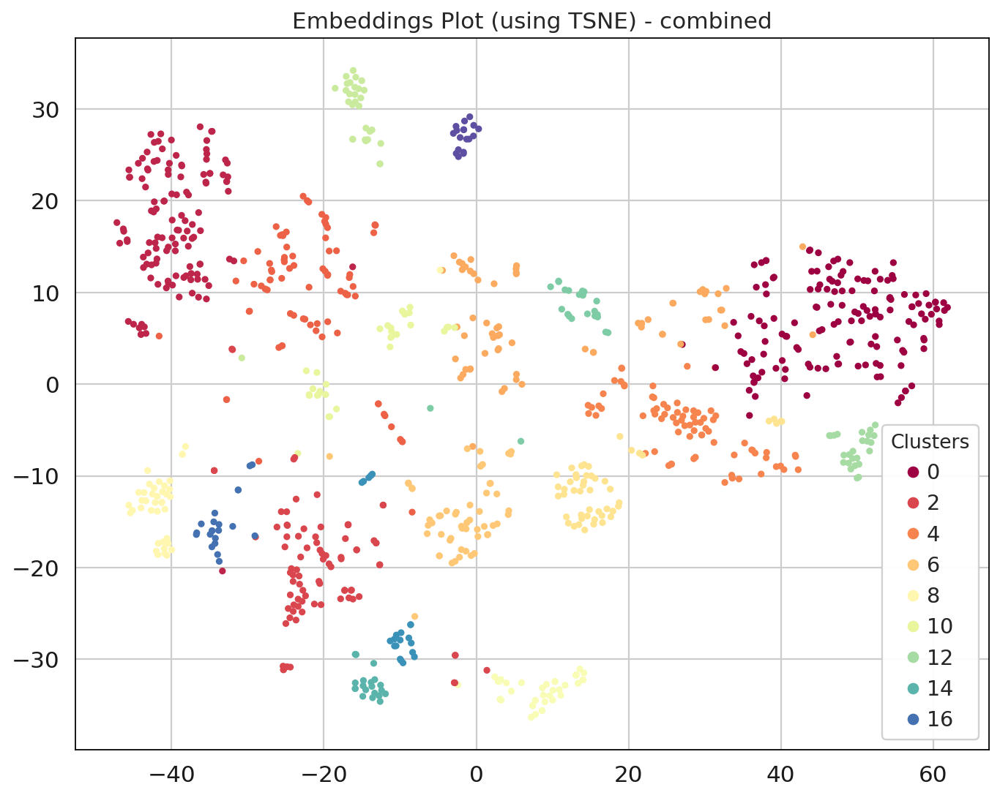

/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/transformers/generation/configuration_utils.py:453: UserWarning: `num_beams` is set to 1. However, `early_stopping` is set to `True` -- this flag is only used in beam-based generation modes. You should set `num_beams>1` or unset `early_stopping`.
  warnings.warn(
/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/transformers/generation/configuration_utils.py:453: UserWarning: `num_beams` is set to 1. However, `early_stopping` is set to `True` -- this flag is only used in beam-based generation modes. You should set `num_beams>1` or unset `early_stopping`.
  warnings.warn(
/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/transformers/generation/configuration_utils.py:453: UserWarning: `num_beams` is set to 1. However, `early_stopping` is set to `True` -- this flag is only used in beam-based generation modes. You should set `num_beams>1` or unset `early_stopping`.
  warnings.warn(
/home/jovy

    Cluster                                            Summary
0         4  antineoplastic and immunomolecular agents. ant...
1         2  antineoplastic and immunomodulating agents. ty...
2        13  NERVOUS SYSTEM. PSYCHOANALEPTICS. ANTIDEPRESSA...
3         0  a m molecule component generation drug contain...
4         5  cAMP accumulation is a non-selective beta-adre...
5        12  carbonic anhydrase inhibitors. carbonic anhydr...
6         9        NERVOUS SYSTEM. Other NERVOUS SYSTEM DRUGS.
7         1  local human for ion be control acid after divi...
8        10  beta-blockers are non-selective. pA2 is a mole...
9         8  genito urinary SYSTEM and sex hormones. hPR an...
10       16  antagonist activity at AR in human LNCAP cells...
11        3  qHTS: a qHTS-based sensitivity assay for a sex...
12       17  genito urinary system and sex hormones. antiin...
13        6  ANTINEOPLASTIC AND IMMUNOMODULATING AGENTS. PL...
14        7  tubulin inhibitors are used to inhibit tub

Processing combined: 100%|██████████| 4/4 [03:12<00:00, 48.21s/it]


Generating KNN


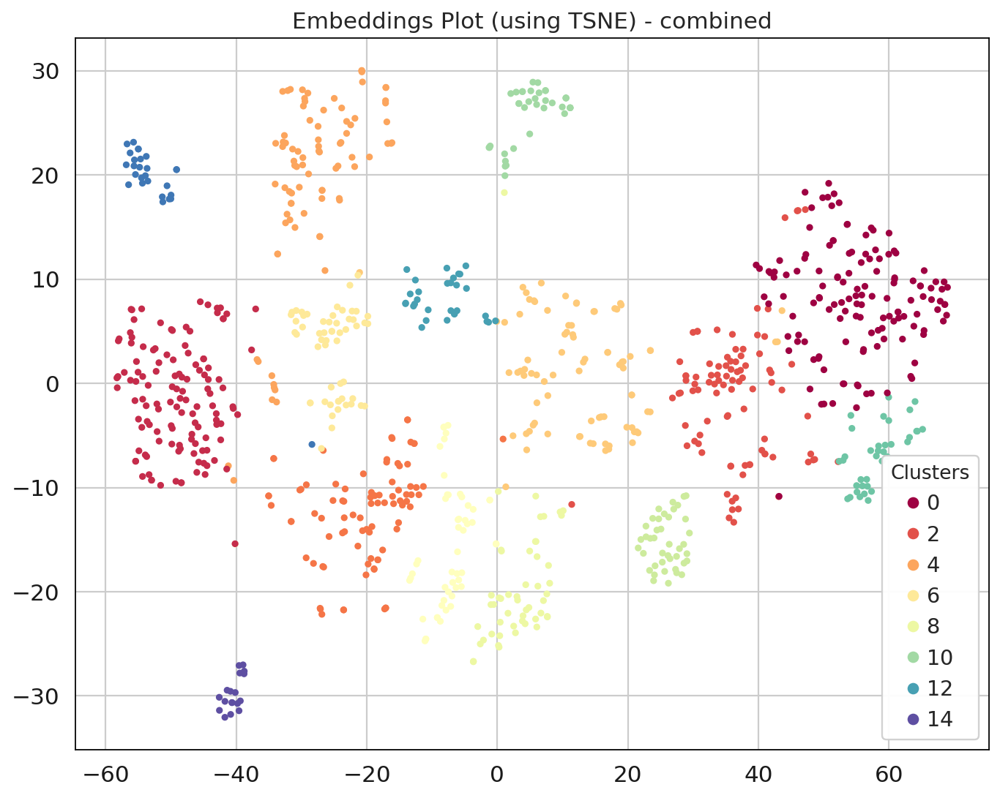

/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/transformers/generation/configuration_utils.py:453: UserWarning: `num_beams` is set to 1. However, `early_stopping` is set to `True` -- this flag is only used in beam-based generation modes. You should set `num_beams>1` or unset `early_stopping`.
  warnings.warn(
/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/transformers/generation/configuration_utils.py:453: UserWarning: `num_beams` is set to 1. However, `early_stopping` is set to `True` -- this flag is only used in beam-based generation modes. You should set `num_beams>1` or unset `early_stopping`.
  warnings.warn(
/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/transformers/generation/configuration_utils.py:453: UserWarning: `num_beams` is set to 1. However, `early_stopping` is set to `True` -- this flag is only used in beam-based generation modes. You should set `num_beams>1` or unset `early_stopping`.
  warnings.warn(
/home/jovy

    Cluster                                            Summary
0         2  ANTINEOPLASTIC AND IMMUNOMODULATING AGENTS. AN...
1         3  antineoplastic and immunomolecular agents. tyr...
2         5  NERVOUS SYSTEM. PSYCHOANALEPTICS. ANTIDEPRESSA...
3        11  Domain o ion coupled d pub selective increase ...
4        10        NERVOUS SYSTEM. Other NERVOUS SYSTEM DRUGS.
5         1  local human for ion current. local human for i...
6        12  human beta-2 adrenergic receptor expressed in ...
7         6  genito urinary SYSTEM and sex hormones. hPR ex...
8         0  CHO cells expressing histamine H1 receptor inh...
9         4  v human for ion block pub disease v human for ...
10       14  genito urinary system and sex hormones. antiin...
11        8  ANTINEOPLASTIC AND IMMUNOMODULATING AGENTS. PL...
12        9  tubulin inhibitors are used to inhibit tubulin...
13       13  ANTINEOPLASTIC AND IMMUNOMODULATING AGENTS. OT...
14        7  antineoplastic and immunomodulating agents

Processing combined: 100%|██████████| 4/4 [03:11<00:00, 47.87s/it]


Generating KNN


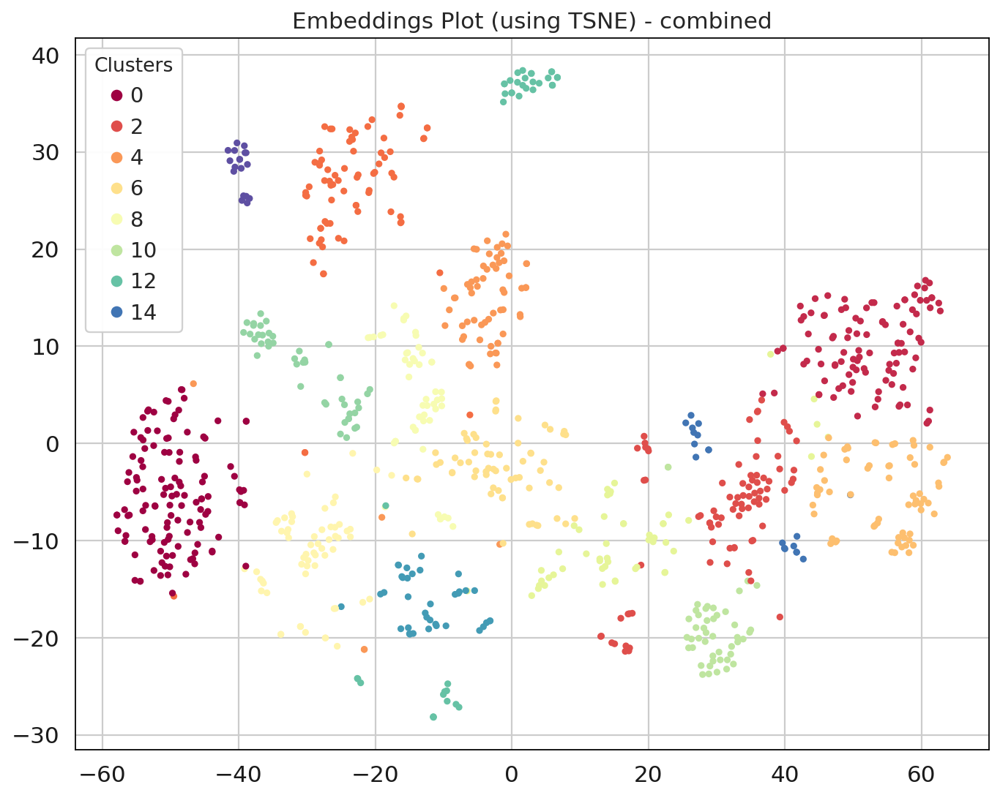

/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/transformers/generation/configuration_utils.py:453: UserWarning: `num_beams` is set to 1. However, `early_stopping` is set to `True` -- this flag is only used in beam-based generation modes. You should set `num_beams>1` or unset `early_stopping`.
  warnings.warn(
/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/transformers/generation/configuration_utils.py:453: UserWarning: `num_beams` is set to 1. However, `early_stopping` is set to `True` -- this flag is only used in beam-based generation modes. You should set `num_beams>1` or unset `early_stopping`.
  warnings.warn(
/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/transformers/generation/configuration_utils.py:453: UserWarning: `num_beams` is set to 1. However, `early_stopping` is set to `True` -- this flag is only used in beam-based generation modes. You should set `num_beams>1` or unset `early_stopping`.
  warnings.warn(
/home/jovy

In [ ]:
# Perform a test across different layer contributions to semantic relations
from transformers import T5Tokenizer, T5ForConditionalGeneration
# Load T5 model and tokenizer
t5_model_name = "t5-base"
t5_tokenizer = T5Tokenizer.from_pretrained(t5_model_name)
t5_model = T5ForConditionalGeneration.from_pretrained(t5_model_name)

sem_model_params = {
    'model_name': 'dmis-lab/biobert-v1.1',  # Custom model
    'batch_size': 256,  # Custom batch size
    'max_length': 256,  # Custom maximum token length
    'combine': True,  # Whether to combine text from multiple columns
    'pooling_strategy': 'mean'#'attention_weighted'  # Use mean/max pooling
}
descriptors = ['assays|description',
               'atc_classification|level1_description',
               'atc_classification|level2_description',
               'atc_classification|level3_description',
               'atc_classification|level4_description',
               'drug_mechanism|mechanism_of_action', 
               'drug_mechanism|action_type', 
               'db_x_GO_CLASSIFICATION|path']

df = df[descriptors]

# Define your layer combinations here, e.g., [(0, 3), (4, 7), (8, 11), (0, 11)]
layer_combinations = [(0, 4), (4, 8), (8, 11), (0, 11)]

experiment_results_df = run_experiment_with_summarization(df, descriptors, layer_combinations, sem_model_params, sample_size=0.025)

print(experiment_results_df)

In [ ]:
pd.set_option('display.max_colwidth', 50)
print(labels_df_T5)

In [ ]:
labels_df_T5

In [ ]:
# sem_model_params = {
#     'model_name': 'dmis-lab/biobert-v1.1',  # Custom model
#     'batch_size': 256,  # Custom batch size
#     'max_length': 256,  # Custom maximum token length
#     'combine': True,  # Whether to combine text from multiple columns
#     #'all_layers':False 
#     'layer_range':(4,12),
#     #'layer_index': -10,  # Use the second to last layer
#     'pooling_strategy': 'attention_weighted'#'attention_weighted'  # Use mean/max pooling
# }
# # Load the SciSpaCy model
# nlp = en_core_sci_md.load(disable=[ "parser", "ner"])
# #nlp = en_core_sci_md.load(disable=["parser", "ner"])# tagger,exclude=["lemmatizer"]
# # nlp.add_pipe("morphologizer")
# nlp.max_length = 2000000

# embeddings_dict,attention_dict = generate_embeddings(df, descriptors, **sem_model_params)
# print(embeddings_dict[list(embeddings_dict.keys())[-1]].shape)
# methods = ['TSNE']#UMAP'
# for x in methods: 
#     results, knn_graph, cluster_labels = plot_embeddings_neighborhood(embeddings_dict,method=x)
# connectivity_matrix = generate_knn_graph(embeddings_dict['combined'])

# V3 - Use Bio-Bert LLM

- Manual look at generative results seem to indicate that layers 0-4 comprise of almost wholly syntatic information which we might not want to include, layers 4-8 have a mix of syntatic and semantic information, 8-11 are more smentic-based. By combining 4-11 we hope to extract generative features whichrepresent more smenatics but still account for some syntax

- The plot shown is are clusters informed by only semantic relationships

- V3 allows us to select specific layers, and unfreeze them so that we can use them for generative purposes

## Optionally:
- Perform fine-tuning
- Freeze Syntatic layers
- unFreeze last few semantic layers
- fine-tune with new drug input data

### Named Entity Recognition (NER): Identifying drug names and other related entities (like diseases, symptoms, etc.) in text.

Using model dmis-lab/biobert-v1.1
Generating embeddings and attention for combined...
Processing text with sciSpacy -- lemmatisation


Processing combined: 100%|██████████| 10/10 [11:57<00:00, 71.74s/it]


Generating KNN


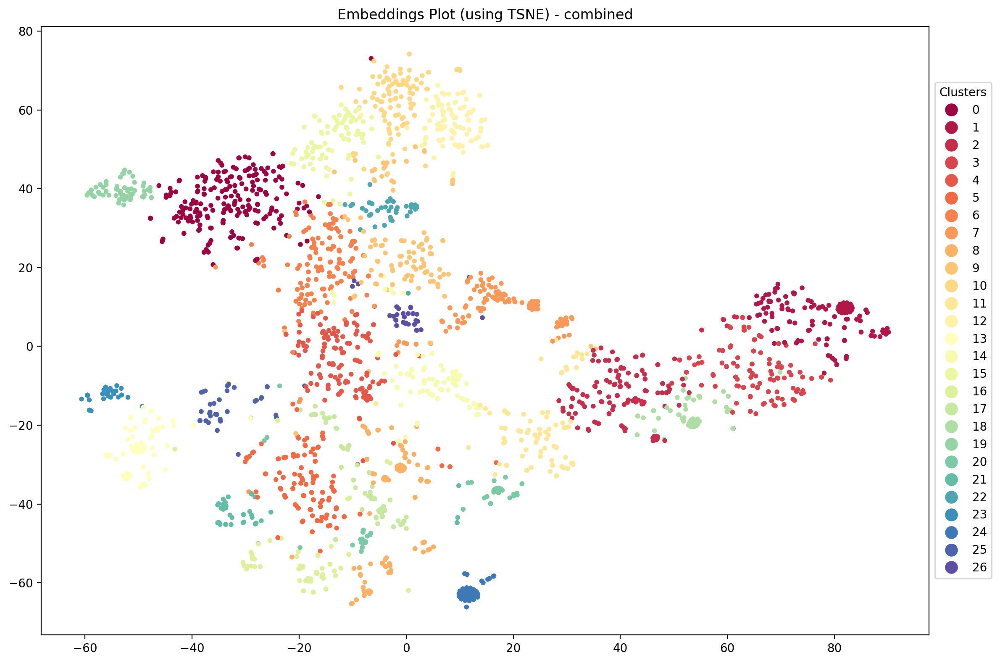

You are using the default legacy behaviour of the <class 'transformers.models.t5.tokenization_t5.T5Tokenizer'>. This is expected, and simply means that the `legacy` (previous) behavior will be used so nothing changes for you. If you want to use the new behaviour, set `legacy=False`. This should only be set if you understand what it means, and thoroughly read the reason why this was added as explained in https://github.com/huggingface/transformers/pull/24565
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/transformers/generation/configuration_utils.py:453: UserWarning: `num_beams` is set to 1. However, `early_stopping` is set to `True` -- this flag is only used in beam-based generation modes. You should set `num_beams>1` or unset `early_stopping`.
  warnings.warn(


    Cluster                                            Summary
0         4  a molecule antagonist is a small molecule anta...
1        15  mouse hp1 qhts inhibitors are a qhts inhibitor...
2         0  a ne mutation aids affinity activity compound ...
3         6  ad-adrenergic peptides are a key inhibitor of ...
4         8  sex derivative signaling central concentration...
5         7  acetylcholinesterase inhibitors are used to tr...
6        14  a ceramide glucosyltransferase inhibitor has b...
7        19  qhts assay inhibitors bloomaposs syndrome heli...
8         3  tuberculosis ve enzyme en molecular system gro...
9         9  g bladder dye mediated micro chromosome huntin...
10        1  a molecule that blocks a protein's signaling p...
11       13  antiepileptics. antiepileptics. antiepileptics...
12       25  antiepileptics. antiepileptics. carboxamide de...
13       12  escherichia coli bl 21 de3 incubated 2 hrs rad...
14       10  a saturday morning dose of ni u curve in a

In [168]:
df = filtered_df.copy()
descriptors = ['assays|description',
               'atc_classification|level1_description',
               'atc_classification|level2_description',
               'atc_classification|level3_description',
               'atc_classification|level4_description',
               'drug_mechanism|mechanism_of_action', 
               'drug_mechanism|action_type', 
               'db_x_GO_CLASSIFICATION|path']

df = preprocess_columns_vectorized(df,descriptors,drug_name_column='molecule_dictionary|chembl_id' )
# filter DF for relevant drugs
adata.uns['drug2cell'].var['chembl'] = adata.uns['drug2cell'].var.index.str.split('|').str[0]
df['molecule_dictionary|chembl_id'] = df['molecule_dictionary|chembl_id'].astype(str)
df = df[df['molecule_dictionary|chembl_id'].isin(adata.uns['drug2cell'].var['chembl'])]
df['molecule_dictionary|chembl_id'].to_csv('keep_drugs.csv')
# Define parameters for the model and processing
sem_model_params = {
    'model_name': 'dmis-lab/biobert-v1.1',  # Using BioBERT for biomedical text
    'batch_size': 256,  # Processing texts in batches of 256
    'max_length': 256,  # Truncating/padding texts to 256 tokens
    'combine': True,  # Combining texts from multiple columns before processing
    'layer_range': (4, 11),  # Pooling attention scores from layers 4 to 12
    'pooling_strategy': 'mean',  # Using mean pooling for embeddings
    'top_n': 30  # Extracting top 15 tokens based on attention
}


# Load the SciSpaCy model
nlp = en_core_sci_md.load(disable=[ "parser", "ner"])
# nlp.add_pipe("morphologizer")
nlp.max_length = 2000000
df = df[descriptors]
# Sample of your DataFrame 'df' for testing
sampled_df = df

# Assuming 'df' is your DataFrame and 'columns' is the list of text columns to process
columns = descriptors
emb_results = generate_embeddings_and_attention(sampled_df, columns, **sem_model_params)

# The results dictionary contains embeddings and top tokens
embeddings_dict = emb_results['embeddings']
top_tokens_dict = emb_results['top_tokens']

results, knn_graph, cluster_labels = plot_embeddings_neighborhood(embeddings_dict, method='TSNE', n_neighbors=30, min_dist=0.1, n_components=2, clustering_method='leiden')

import pandas as pd
from transformers import T5Tokenizer, T5ForConditionalGeneration

# Load T5 model and tokenizer
t5_model_name = "t5-base"
t5_tokenizer = T5Tokenizer.from_pretrained(t5_model_name)
t5_model = T5ForConditionalGeneration.from_pretrained(t5_model_name)

# Build sentence descriptions for a given column and its top tokens
column_name = 'combined'  # Example column
top_tokens = top_tokens_dict[column_name] 
sampled_df[column_name] = (sampled_df[descriptors].apply(lambda x: '. '.join(x.dropna().astype(str)), axis=1)).astype(str)
sampled_df[column_name] = sampled_df[column_name].str.replace('nan','')
original_texts = sampled_df[column_name]

# Aggregate top tokens by cluster using the cluster labels
cluster_top_tokens = aggregate_top_tokens_by_cluster(top_tokens, cluster_labels)

# Prepare input text for each cluster
input_texts_for_clusters = prepare_input_text_for_cluster(cluster_top_tokens, original_texts.tolist(), cluster_labels)

# Generate summaries for each cluster
cluster_summaries = {}
for cluster, input_text in input_texts_for_clusters.items():
    summary = generate_text(input_text, max_length=50)  # You can adjust max_length as needed
    cluster_summaries[cluster] = summary

# Construct DataFrame
labels_df_T5 = pd.DataFrame(list(cluster_summaries.items()), columns=['Cluster', 'Summary'])
print(labels_df_T5)

Generating KNN


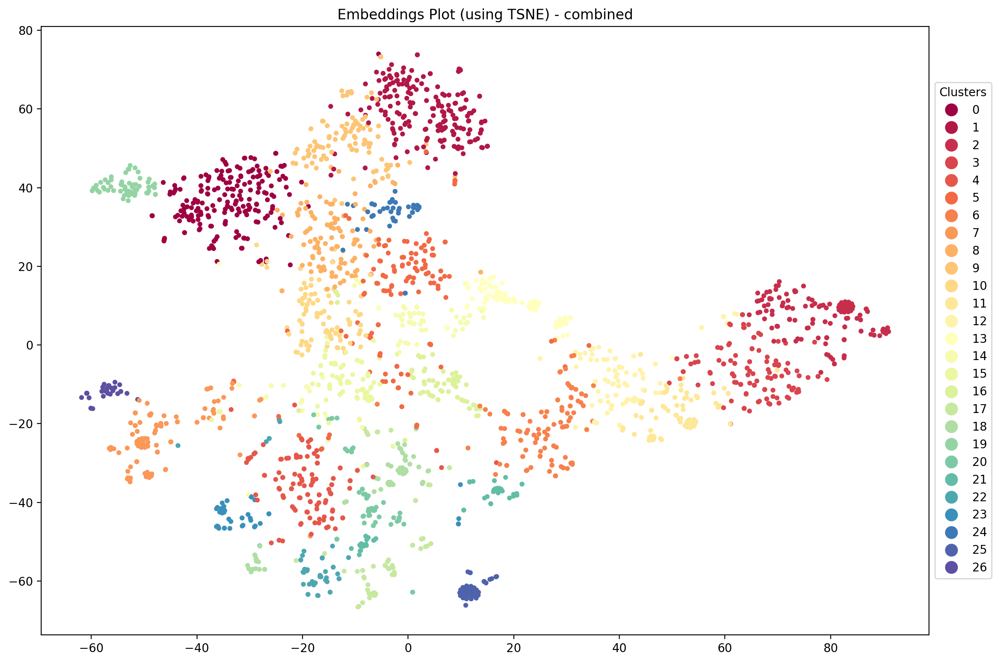

    Cluster                                            Summary
0         4  a molecule antagonist is a small molecule anta...
1        15  mouse hp1 qhts inhibitors are a qhts inhibitor...
2         0  a ne mutation aids affinity activity compound ...
3         6  ad-adrenergic peptides are a key inhibitor of ...
4         8  sex derivative signaling central concentration...
5         7  acetylcholinesterase inhibitors are used to tr...
6        14  a ceramide glucosyltransferase inhibitor has b...
7        19  qhts assay inhibitors bloomaposs syndrome heli...
8         3  tuberculosis ve enzyme en molecular system gro...
9         9  g bladder dye mediated micro chromosome huntin...
10        1  a molecule that blocks a protein's signaling p...
11       13  antiepileptics. antiepileptics. antiepileptics...
12       25  antiepileptics. antiepileptics. carboxamide de...
13       12  escherichia coli bl 21 de3 incubated 2 hrs rad...
14       10  a saturday morning dose of ni u curve in a

In [169]:
results, knn_graph, cluster_labels = plot_embeddings_neighborhood(embeddings_dict, method='TSNE', n_neighbors=30, min_dist=0.1, n_components=2, clustering_method='leiden')
labels_df_T5 = pd.DataFrame(list(cluster_summaries.items()), columns=['Cluster', 'Summary'])
print(labels_df_T5)

In [224]:
# # Build sentence descriptions for a given column and its top tokens
# column_name = 'combined'  # Example column
# top_tokens = top_tokens_dict[column_name] 
# sampled_df[column_name] = (sampled_df[descriptors].apply(lambda x: '. '.join(x.dropna().astype(str)), axis=1)).astype(str)
# sampled_df[column_name] = sampled_df[column_name].str.replace('nan','')
# original_texts = sampled_df[column_name]

# # Aggregate top tokens by cluster using the cluster labels
# cluster_top_tokens = aggregate_top_tokens_by_cluster(top_tokens, cluster_labels)

# # Prepare input text for each cluster
# input_texts_for_clusters = prepare_input_text_for_cluster(cluster_top_tokens, original_texts.tolist(), cluster_labels)

# # Generate summaries for each cluster
# cluster_summaries = {}
# for cluster, input_text in cluster_top_tokens.items():
#     summary = generate_text(input_text, max_length=50)  # You can adjust max_length as needed
#     cluster_summaries[cluster] = summary

In [205]:
# Generate summaries for each cluster
cluster_summaries = {}
for cluster, input_text in input_texts_for_clusters.items():
    summary = generate_text(input_text, max_length=50)  # You can adjust max_length as needed
    cluster_summaries[cluster] = summary

# Construct DataFrame
labels_df_T5 = pd.DataFrame(list(cluster_summaries.items()), columns=['Cluster', 'Summary'])
print(labels_df_T5)

/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/transformers/generation/configuration_utils.py:453: UserWarning: `num_beams` is set to 1. However, `early_stopping` is set to `True` -- this flag is only used in beam-based generation modes. You should set `num_beams>1` or unset `early_stopping`.
  warnings.warn(

KeyboardInterrupt



In [174]:
df

,assays|description,atc_classification|level1_description,atc_classification|level2_description,atc_classification|level3_description,atc_classification|level4_description,drug_mechanism|mechanism_of_action,drug_mechanism|action_type,db_x_GO_CLASSIFICATION|path,combined
0,pubchem_bioassay qhts assay identification sma...,nan,nan,nan,nan,nan,nan,cellular_component membrane plasma membrane bi...,pubchem_bioassay qhts assay identification sma...
1,pubchem_bioassay qhts assay inhibitors histone...,respiratory system,antihistamines systemic use,antihistamines systemic use,aminoalkyl ethers,nan,nan,molecular_function catalytic activity transfer...,pubchem_bioassay qhts assay inhibitors histone...
2,pubchem bioassay qhts inhibitors human tyrosyl...,cardiovascular system,calcium channel blockers,nonselective calcium channel blockers,phenylalkylamine derivatives,nan,nan,cellular_component nucleoplasm biological_proc...,pubchem bioassay qhts inhibitors human tyrosyl...
3,pubchem bioassay hts assay allosteric antagoni...,nervous system,antiparkinson drugs,dopaminergic agents,dopa dopa derivatives,nan dopamine d3 receptor agonist,nan agonist,biological_process metabolic process catabolic...,pubchem bioassay hts assay allosteric antagoni...
4,inhibition pgh synthase determined measuring o...,musculoskeletal system,topical products joint muscular pain antiinfla...,topical products joint muscular pain antiinfla...,antiinflammatory preparations nonsteroids topi...,nan cyclooxygenase inhibitor,nan inhibitor,cellular_component membrane plasma membrane bi...,inhibition pgh synthase determined measuring o...
...,...,...,...,...,...,...,...,...,...
2465,pubchem_bioassay qhts assay identification sma...,dermatologicals sensory organs cardiovascular ...,otologicals vasoprotectives corticosteroids de...,antiinflammatory agents corticosteroids agents...,corticosteroids corticosteroids plain corticos...,nan glucocorticoid receptor agonist,nan agonist,cellular_component cellular_component cytosol ...,pubchem_bioassay qhts assay identification sma...
2466,pubchem bioassay qhts inhibitors plk1pdb polol...,antiinfectives systemic use,antivirals systemic use,direct acting antivirals,nucleoside nucleotide reverse transcriptase in...,nan,nan,cellular_component molecular_function protein ...,pubchem bioassay qhts inhibitors plk1pdb polol...
2467,relative binding affinity compound angiotensin...,nan,nan,nan,nan,type1 angiotensin ii receptor antagonist,antagonist,biological_process circulatory system process ...,relative binding affinity compound angiotensin...
2468,displacement 3hqnb human muscarinic m1 recepto...,alimentary tract metabolism,drugs acid related disorders,drugs peptic ulcer gastrooesophageal reflux di...,drugs peptic ulcer gastrooesophageal reflux di...,nan muscarinic acetylcholine receptor m1 antag...,nan antagonist,biological_process circulatory system process ...,displacement 3hqnb human muscarinic m1 recepto...


In [175]:
df = filtered_df.copy()
descriptors = ['assays|description',
               'atc_classification|level1_description',
               'atc_classification|level2_description',
               'atc_classification|level3_description',
               'atc_classification|level4_description',
               'drug_mechanism|mechanism_of_action', 
               'drug_mechanism|action_type', 
               'db_x_GO_CLASSIFICATION|path']

df = preprocess_columns_vectorized(df,descriptors,drug_name_column='molecule_dictionary|chembl_id' )

In [176]:
# filter DF for relevant drugs
adata.uns['drug2cell'].var['chembl'] = adata.uns['drug2cell'].var.index.str.split('|').str[0]
df['molecule_dictionary|chembl_id'] = df['molecule_dictionary|chembl_id'].astype(str)
df = df[df['molecule_dictionary|chembl_id'].isin(adata.uns['drug2cell'].var['chembl'])]
df['molecule_dictionary|chembl_id'].to_csv('keep_drugs.csv')

In [177]:
keep_drugs = df['molecule_dictionary|chembl_id']

In [178]:
keep_drugs

0       CHEMBL1002
1       CHEMBL1004
2       CHEMBL1008
3       CHEMBL1009
4        CHEMBL101
           ...    
2465     CHEMBL989
2466     CHEMBL991
2467     CHEMBL995
2468    CHEMBL9967
2469     CHEMBL998
Name: molecule_dictionary|chembl_id, Length: 2467, dtype: object

In [179]:
df.shape

(2467, 9)

In [180]:
embeddings_dict['combined'].shape

(2467, 768)

In [183]:
# Assign weights & embeddings
embeddings_dic['SLLM'] = embeddings_dict
embeddings_dic['SLLM_database'] = df
weights_dic['SLLM'] = (knn_graph)

In [184]:
import pickle
# Assuming 'embeddings_dict' is your embeddings dictionary
embeddings_filename = 'sem_embeddings.pkl'

# Save the embeddings dictionary to a .pkl file
with open(embeddings_filename, 'wb') as f:
    pickle.dump(embeddings_dict, f)

In [185]:
import pickle
# Assuming 'embeddings_dict' is your embeddings dictionary
tokens_filename = 'top_tokens.pkl'

# Save the embeddings dictionary to a .pkl file
with open(tokens_filename, 'wb') as f:
    pickle.dump(top_tokens_dict, f)


In [186]:
import pickle
# Assuming 'embeddings_dict' is your embeddings dictionary
embeddings_filename = 'all_embeddings.pkl'

# Save the embeddings dictionary to a .pkl file
with open(embeddings_filename, 'wb') as f:
    pickle.dump(embeddings_dic, f)
    
import pickle
# Assuming 'embeddings_dict' is your embeddings dictionary
weights_dic_filename = 'all_weights.pkl'

# Save the embeddings dictionary to a .pkl file
with open(weights_dic_filename, 'wb') as f:
    pickle.dump(weights_dic, f)

In [187]:
embeddings_dict['combined'].shape

(2467, 768)

In [192]:
embeddings_dic['SLLM'].keys()

dict_keys(['combined'])

In [190]:
embeddings_dict.keys()

dict_keys(['combined'])

# V1 Module 5: Molecular structure casual semantics with attention

## BERT loves chemistry
### Rationale and Approach for Utilising ChemBERTa in Drug Clustering

#### Background
ChemBERTa, a variant of the BERT model adapted for chemical data, leverages the transformer architecture to capture the semantic essence of molecules encoded as SMILES strings. This adaptation enables the model to learn complex patterns within chemical structures, facilitating a deeper understanding of molecular properties and relationships. The model's ability to generate semantically rich embeddings from SMILES strings positions it as a powerful tool in cheminformatics, particularly in tasks such as drug clustering where understanding subtle differences and similarities between molecules is crucial.

#### Methodology
The approach involves preprocessing a dataset of drugs, where each row represents a unique drug and includes a column of SMILES strings encoding the molecular structure. These strings serve as input to the ChemBERTa model, which generates high-dimensional embeddings reflecting the semantic and structural features of each molecule. The process capitalizes on the model's pre-training on extensive chemical databases, ensuring that the embeddings encapsulate a broad spectrum of chemical knowledge.

#### Embedding Generation
For each SMILES string, the ChemBERTa tokenizer converts the chemical language into a format understandable by the model, maintaining the integrity of molecular structures. The model then processes these tokenized inputs, outputting embeddings that serve as a numerical representation of the molecules' semantic properties. These embeddings are aggregated, typically by averaging, to produce a singular vector that encapsulates the essence of each molecule's structure and potential function.

#### Similarity Matrix Construction
With the embeddings generated, a similarity matrix is computed, typically using cosine similarity measures. This matrix quantifies the pairwise similarities between all drugs in the dataset, providing a foundation for clustering algorithms to identify groups of drugs with similar molecular characteristics. The similarity matrix serves as a kernel, with its values indicating the degree of similarity between drug pairs, thereby guiding the clustering process.

#### Application in Drug Clustering
The utility of ChemBERTa in this context lies in its ability to discern intricate molecular similarities that might be overlooked by traditional clustering methods. By grounding the clustering process in semantically meaningful embeddings, the approach facilitates the identification of clusters based on deep molecular insights. This methodology is particularly beneficial in drug discovery and repurposing, where understanding nuanced molecular relationships can unveil new therapeutic potentials.

#### Conclusion
In summary, leveraging ChemBERTa for generating molecular embeddings introduces a novel dimension to drug clustering, enriching the analysis with deep semantic understanding of molecular structures. This approach exemplifies the integration of advanced NLP techniques in cheminformatics, paving the way for more informed and nuanced analyses in drug discovery and development processes.

### References
- The original BERT model and its applications in NLP: Devlin et al., 2018.
- ChemBERTa and its adaptation for chemical data: Chithrananda et al., "ChemBERTa: Large-Scale Self-Supervised Pretraining for Molecular Property Prediction," 2020.
- Applications of molecular embeddings in cheminformatics: [Digital Discovery (RSC Publishing) DOI:10.1039/D3DD00119A](https://pubs.rsc.org/en/content/articlelanding/2022/dd/d3dd00119a).

In [193]:
# pip install transformers
# pip install rdkit-pypi
from transformers import AutoTokenizer, AutoModel
import torch
import numpy as np
from rdkit import Chem
from rdkit.Chem import AllChem

In [194]:
import pandas as pd
from transformers import AutoTokenizer, AutoModel  # Changed from AutoModelForMaskedLM to AutoModel
import torch
import numpy as np

def load_chemberta_model_and_tokenizer(model_name="seyonec/ChemBERTa-zinc-base-v1"):
    """
    Load the ChemBERTa model and its tokenizer.
    """
    tokenizer = AutoTokenizer.from_pretrained(model_name)
    model = AutoModel.from_pretrained(model_name)  # Changed from AutoModelForMaskedLM to AutoModel
    return tokenizer, model

from tqdm.auto import tqdm  # Import tqdm for progress bars

def generate_chemberta_embeddings(df, column, tokenizer, model):
    """
    Generate embeddings for SMILES strings in a DataFrame column using ChemBERTa.

    Parameters:
    - df: DataFrame containing the SMILES strings.
    - column: The column name in the DataFrame containing SMILES strings.
    - tokenizer: Tokenizer for ChemBERTa.
    - model: Pre-trained ChemBERTa model.

    Returns:
    - embeddings: NumPy array of embeddings.
    """
    embeddings = []
    for smiles in tqdm(df[column], desc="Generating embeddings"):  # Add a tqdm progress bar
        # Tokenize the SMILES string and prepare input tensors
        inputs = tokenizer(smiles, return_tensors="pt", padding=True, truncation=True, max_length=512)

        # Generate model output
        with torch.no_grad():
            outputs = model(**inputs)

        # Extract embeddings, using the last hidden states
        last_hidden_states = outputs.last_hidden_state
        
        # Aggregate the embeddings, for example, by taking the mean
        smile_embedding = torch.mean(last_hidden_states, dim=1).squeeze().numpy()
        embeddings.append(smile_embedding)
    
    return np.array(embeddings)



# V2 

In [195]:
import pandas as pd
from transformers import AutoTokenizer, AutoModel
import torch
import numpy as np
from tqdm.auto import tqdm

models_dict = {
    "seyonec/ChemBERTa-zinc-base-v1": "ChemBERTa model trained on the ZINC database.",
    "seyonec/ChemBERTa-zinc250k-v2": "A larger ChemBERTa model for potentially capturing more complex chemical relationships.",
    "seyonec/PubChem10M_SMILES_BPE_450k": "ChemBERTa model trained on a diverse set of molecules from PubChem.",
    "BenevolentAI/MolBERT": "MolBERT model for learning representations of molecular structures.",
    "Dlux/SMILES-Transformer": "SMILES Transformer model for capturing the syntax and semantics of SMILES notations."
}

def load_model_and_tokenizer(model_name):
    """
    Load the ChemBERTa model and its tokenizer.
    """
    tokenizer = AutoTokenizer.from_pretrained(model_name)
    model = AutoModel.from_pretrained(model_name)
    return tokenizer, model

def generate_embeddings(df, column, tokenizer, model, batch_size=32):
    """
    Generate embeddings for SMILES strings in a DataFrame column using ChemBERTa.

    Parameters:
    - df: DataFrame containing the SMILES strings.
    - column: The column name in the DataFrame containing SMILES strings.
    - tokenizer: Tokenizer for ChemBERTa.
    - model: Pre-trained ChemBERTa model.

    Returns:
    - embeddings: NumPy array of embeddings.
    """
    embeddings = []
    for i in tqdm(range(0, len(df), batch_size), desc="Generating embeddings"):
        batch = df[column].iloc[i:i + batch_size].tolist()
        inputs = tokenizer(batch, return_tensors="pt", padding=True, truncation=True, max_length=512)
        with torch.no_grad():
            outputs = model(**inputs)
        batch_embeddings = torch.mean(outputs.last_hidden_state, dim=1).squeeze().cpu().numpy()
        embeddings.append(batch_embeddings)
    return np.vstack(embeddings)

<bound method NDFrame.head of      molecule_dictionary|chembl_id  \
0                       CHEMBL1002   
1                       CHEMBL1004   
2                       CHEMBL1008   
3                       CHEMBL1009   
4                        CHEMBL101   
...                            ...   
2462                     CHEMBL989   
2463                     CHEMBL991   
2464                     CHEMBL995   
2465                    CHEMBL9967   
2466                     CHEMBL998   

                         db_x_smiles|canonical_smiles  
0                                ccccncchoc1cccoccoc1  
1                            cncccoccc1ccccc1c1ccccn1  
2                   ccccocccncc1ccccc1c1ccccc1n1cccc1  
3                                   nchcc1cccococ1coo  
4                       ccccc1conc2ccccc2nc2ccccc2c1o  
...                                               ...  
2462  cc1coch2cch3ch4cchfc5ccoccc5cc4fchocc3cc2cocoo1  
2463                          cc1cnch2ccchcoo2conhc1o  
2464     

Generating embeddings: 100%|██████████| 2467/2467 [27:06<00:00,  1.52it/s] 


Generating KNN


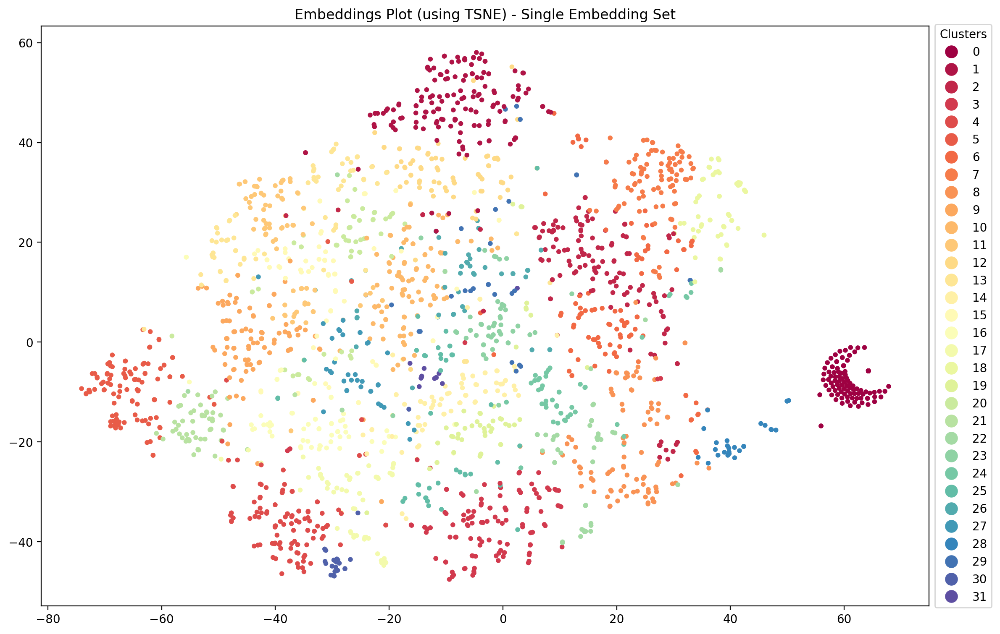

In [196]:
# filter DF for relevant drugs
df = filtered_df.copy()


adata.uns['drug2cell'].var['chembl'] = adata.uns['drug2cell'].var.index.str.split('|').str[0]
df['molecule_dictionary|chembl_id'] = df['molecule_dictionary|chembl_id'].astype(str)
df = df[df['molecule_dictionary|chembl_id'].isin(adata.uns['drug2cell'].var['chembl'])]

descriptors = ['db_x_smiles|canonical_smiles']

df = preprocess_columns_vectorized(df,descriptors,drug_name_column='molecule_dictionary|chembl_id' )
print(df.head)
# Assuming 'df' is your DataFrame and 'smiles_column' is the column with SMILES strings
tokenizer, model = load_model_and_tokenizer('seyonec/ChemBERTa-zinc-base-v1')
embeddings = generate_chemberta_embeddings(df, 'db_x_smiles|canonical_smiles', tokenizer, model)

# Now 'embeddings' contains the ChemBERTa embeddings for the SMILES strings in your DataFrame column

results, knn_graph, cluster_labels = plot_embeddings_neighborhood(embeddings, method='TSNE', n_neighbors=15, min_dist=0.1, n_components=2, clustering_method='leiden')

In [197]:
embeddings.shape

(2467, 768)

In [198]:
len(cluster_labels)

2467

In [199]:
# Assign weights & embeddings
embeddings_dic['CBERT'] = embeddings
weights_dic['CBERT'] = knn_graph

In [200]:
import pickle
# Assuming 'embeddings_dict' is your embeddings dictionary
embeddings_filename = 'all_embeddings.pkl'

# Save the embeddings dictionary to a .pkl file
with open(embeddings_filename, 'wb') as f:
    pickle.dump(embeddings_dic, f)
    
import pickle
# Assuming 'embeddings_dict' is your embeddings dictionary
weights_dic_filename = 'all_weights.pkl'

# Save the embeddings dictionary to a .pkl file
with open(weights_dic_filename, 'wb') as f:
    pickle.dump(weights_dic, f)

# D2C Integration modules

# Module 2: Drug_state_usage_profiles
- Learn some representation of drug-gene prediction profiles acrtoss cells. 
### Modes:
    - MOFA
    - GCCA
    - NMF


### Rationale for Creating Joint Embeddings


1. **Enhanced Interpretability**: By mapping data from different sources into a shared embedding space, it becomes easier to understand how various aspects of the data relate to one another, facilitating clearer interpretations of how drugs influence cellular mechanisms.

2. **Improved Prediction Accuracy**: Integrating embeddings from different methodologies can leverage complementary information, potentially leading to more accurate predictions of drug efficacy and side effects.

3. **Identification of Novel Relationships**: Joint embeddings can reveal new relationships between drugs and cellular responses that are not apparent when analyzing datasets in isolation.

4. **Robustness to Data Sparsity and Noise**: Combining multiple data sources can help mitigate issues related to data sparsity and noise in individual datasets, as the integration process can emphasize shared signal over noise.

### How MOFA Achieves Integration

MOFA (Multi-Omics Factor Analysis) is a statistical framework designed to integrate and decompose multiple datasets into a set of latent factors that capture the underlying sources of variability. The process by which MOFA+ achieves this can be broken down into several steps:

1. **Input Data**: MOFA+ accepts multiple input data matrices, each corresponding to a different type of data or feature set. In your case, these matrices might represent embeddings from language models and drug interaction tests.

2. **Factorization**: MOFA+ employs a group factor analysis approach to decompose each dataset into a set of latent factors and feature loadings:
$$
\mathbf{X}_k = \mathbf{Z} \mathbf{W}_k^T + \mathbf{E}_k
$$

Where:
- $( \mathbf{X}_k )$ represents the data matrix for the $( k )$-th data type.
- $( \mathbf{Z} )$ is the matrix of latent factors common across all data types.
- $( \mathbf{W}_k )$ is the loading matrix specific to the $( k )$-th data type, indicating how much each feature contributes to each factor.
- $( \mathbf{E}_k )$ is the residual noise matrix for the $( k )$-th data type.

This formulation allows for the extraction and integration of the most significant modes of variation across different types of data, yielding a joint embedding space that reflects shared and unique aspects of each dataset.
3. **Variational Inference**: MOFA+ uses a Bayesian framework with variational inference to estimate the factors and loadings. This approach allows the model to handle different types of data (continuous, binary, count, etc.) and to incorporate prior knowledge.

4. **Regularization**: The model includes options for sparsity-inducing priors on the loadings, which encourages each factor to use only a subset of the features from each data type, simplifying interpretation and enhancing model robustness.

5. **Output**: The output of MOFA+ is a set of factors that describe the main modes of variation across the datasets. These factors constitute the joint embedding space where relationships across data types can be explored.

### Implementation in the Context of Drug Discovery

In the context of drug discovery, MOFA+ can integrate drug response data, genetic data, and embeddings derived from text data about drug mechanisms. This integrated approach provides a comprehensive view that can enhance the understanding of drug effects at the cellular level, potentially leading to discoveries related to drug mechanisms, interactions, and effects on disease pathways.

The joint embedding space created by MOFA+ allows for clustering drugs based on their mechanisms and predicted effects, supporting the identification of novel drug candidates and therapeutic opportunities. The enhanced interpretability and robustness of the model also contribute to more accurate predictions and insights into complex biological systems.

By leveraging the strengths of specialized tools at each stage—from feature extraction using advanced NLP models to integration and analysis using MOFA+—your pipeline creates a powerful platform for advancing drug discovery and understanding complex biomedical relationships.

### Summary

The integration process via MOFA+ allows for a robust and interpretable model that can combine diverse data types into a coherent framework, enhancing drug discovery and research by providing a deeper understanding of drug mechanisms. The formulaic representation of MOFA+ captures the essence of how data from different sources are synthesized to uncover latent structures, making it a powerful tool in multi-omics and drug prediction studies.

## V1 MOFA

In [ ]:
data_views = [[datasets[key]] for key in datasets.keys()]
ent = entry_point()
D = list(feature_dims.values()) # Number of features per view
M = len(D)      # Number of views
K = 50         # Number of factors
N = [2467,2467]   # Number of samples per group
G = 1   
ent.set_data_options(
    scale_views = False
)
ent.set_data_matrix(data_views, likelihoods = ["gaussian","gaussian"])

ent.set_model_options(
    factors = 50, 
    spikeslab_weights = True, 
    ard_weights = True
)
ent.set_train_options(
    convergence_mode = "fast", 
    dropR2 = -1, 
    gpu_mode = True, 
    seed = 1
)
ent.build()

ent.run()

# Save the output
ent.save(outfile='mofa_model_output.h5', save_data=True, save_parameters=True)

import mofax as mx

# Path to your MOFA model output file
hdf5_file = 'mofa_model_output4.h5'

# Load the model
mofa_model = mx.mofa_model(hdf5_file)

# Extract the factors/embeddings
factors = mofa_model.get_factors()
factors.shape

In [ ]:
import numpy as np
from mofapy2.run.entry_point import entry_point
from sklearn.cross_decomposition import CCA
import nimfa

def run_mofa(datasets):
    """
    Run MOFA to integrate multiple sets of embs
    Args:
    datasets (dict): dictionary where keys are dataset identifiers and values are numpy arrays of PCs.

    Returns:
    np.array: Integrated latent variables.
    """
    # Initialize the MOFA model
    mofa_model = entry_point()
    # Set dimensionalities
    num_groups = 1  # Assuming all data belongs to one group
    num_views = len(datasets)  # Number of views, each dataset is a view
    # We assume that all data matrices are transposed correctly (samples x features)
    num_samples = datasets[next(iter(datasets))].shape[0]  # Taking the number of samples from the first dataset
    feature_dims = {key: val.shape[1] for key, val in datasets.items()}  # Number of features per dataset
    D = list(feature_dims.values()) # Number of features per view
    M = len(D)      # Number of views
    K = 50         # Number of factors
    N = [2467,2467]   # Number of samples per group
    G = 1   
    
    mofa_model.dimensionalities = {
        'G': G,  # Number of groups
        'M': M,   # Number of views
        'N': N,  # Number of samples
        'D': D  # List of number of features per view
    }
    # Set data
    data_views = [[datasets[key]] for key in datasets.keys()]
    # Setting data options
    mofa_model.likelihoods = ['gaussian'] * len(datasets)  # assuming Gaussian likelihood for each view
    mofa_model.set_data_options(scale_groups=False, scale_views=False)
    mofa_model.set_model_options(factors=50, ard_factors=True, spikeslab_weights=True)
    mofa_model.set_data_matrix(data_views, likelihoods = ["gaussian","gaussian"])
    mofa_model.set_train_options(iter=1000, convergence_mode="slow", startELBO=1, freqELBO=1, dropR2=-1, gpu_mode=False, verbose=True)



    
    # Build and run the model
    mofa_model.build()
    mofa_model.run()

    # Extract the learned factors (latent variables)
    factors = mofa_model.get_expectations()["Z"]["mean"]
    
    return factors




def run_gcca(datasets):
    """
    Run GCCA to integrate multiple sets of embs.
    Args:
    datasets (dict): dictionary where keys are dataset identifiers and values are numpy arrays of PCs.

    Returns:
    np.array: Integrated latent variables.
    """
    # Extracting the minimum shape to align dimensions
    min_cols = min(data.shape[1] for data in datasets.values())

    # Truncate each dataset to the minimum number of columns
    truncated_data = [data[:, :min_cols] for data in datasets.values()]

    # Initialize the GCCA model
    gcca = CCA(n_components=min_cols)
    Xs = gcca.fit_transform(*truncated_data)
    
    return Xs

def run_nmf(datasets):
    """
    Run Joint NMF to integrate multiple sets of embs.
    Args:
    datasets (dict): dictionary where keys are dataset identifiers and values are numpy arrays of PCs.

    Returns:
    np.array: Basis matrices (W) from NMF, concatenated.
    """
    # Parameters
    rank = 10  # Number of components, choose based on your application

    # Running NMF for each dataset
    Ws = []
    for key, data in datasets.items():
        model = nimfa.Nmf(data, rank=rank, max_iter=200, update='euclidean', objective='fro')
        nmf_result = model()
        Ws.append(nmf_result.basis())

    # Concatenate basis matrices horizontally
    concatenated_W = np.hstack(Ws)

    return concatenated_W

def integrate_pcs(datasets, method='mofa'):
    """
    Integrate embs from multiple datasets using specified method.
    Args:
    datasets (dict): dictionary where keys are dataset identifiers and values are numpy arrays of PCs.
    method (str): 'mofa', 'gcca', or 'nmf' for the integration method.

    Returns:
    np.array: Integrated output depending on the chosen method.
    """
    if method == 'mofa':
        return run_mofa(datasets)
    elif method == 'gcca':
        return run_gcca(datasets)
    elif method == 'nmf':
        return run_nmf(datasets)
    else:
        raise ValueError("Unsupported method specified.")

# Example usage:
# datasets = {
#     "run1": np.random.rand(100, 10),
#     "run2": np.random.rand(100, 8),
#     "run3": np.random.rand(100, 7)
# }
# integrated_output = integrate_pcs(datasets, method='mofa')

## V1 MOFA

In [466]:
integrated_output = integrate_pcs(datasets, method='mofa')


        #########################################################
        ###           __  __  ____  ______                    ### 
        ###          |  \/  |/ __ \|  ____/\    _             ### 
        ###          | \  / | |  | | |__ /  \ _| |_           ### 
        ###          | |\/| | |  | |  __/ /\ \_   _|          ###
        ###          | |  | | |__| | | / ____ \|_|            ###
        ###          |_|  |_|\____/|_|/_/    \_\              ###
        ###                                                   ### 
        ######################################################### 
       
 
        
View names not provided, using default naming convention:
- view1, view2, ..., viewM

Features names not provided, using default naming convention:
- feature1_view1, featureD_viewM

Groups names not provided, using default naming convention:
- group1, group2, ..., groupG

Samples names not provided, using default naming convention:
- sample1_group1, sample2_group1, sample1_group

In [ ]:
integrated_output

# Compute joint embedding graph and cluster

In [45]:
adata = sc.read('/nfs/team205/ig7/projects/SCC_nano_string/drug2state/D2C_KH_SCC_PS_EZ_HL.h5ad')
#adata.uns['drug2cell'].T
adata_tt = adata.T #flip the data to access pca by drugs instead of by cell               

In [315]:
adata_tt.obs['chembl'] = adata_tt.obs.index.str.split('|').str[0]
adata_tt = adata_tt[adata_tt.obs['chembl'].isin(keep_drugs)]

## Add MOFA latent factors

In [469]:
integrated_output.shape

(2467, 50)

In [470]:
adata_tt.obsm['X_LLM_MOFA'] = integrated_output

In [471]:
sc.pp.neighbors(adata_tt, n_neighbors=15, method='umap', metric='euclidean',use_rep = 'X_LLM_MOFA' ,key_added=None, copy=False)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [472]:
adata_tt

AnnData object with n_obs × n_vars = 2467 × 499758
    obs: 'genes', 'all_genes'
    var: 'sample_id', 'mad_prd', 'Status', 'Site', 'Tissue', 'Enrichment', 'Location', 'Sex', 'Age', 'stage', 'full_clustering', 'level3_celltype', 'tum.norm', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'patient', 'level1_celltype', 'level2_celltype', 'batch_id', 'auto_prd', 'batch', 'n_genes', 'level4_celltype'
    uns: 'rank_genes_groups', 'drug2cell', 'pca', 'neighbors'
    obsm: 'X_pca', 'X_LLM_MOFA'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [473]:
pd.DataFrame(adata_tt.obs.index.str.split('|').str[0]).to_csv('keep_drugs_A2_V7.csv')

In [474]:
weights_dic

{'GSO': array([[1.10109033e-03, 4.05068495e-04, 4.05068495e-04, ...,
         4.05068495e-04, 4.05068495e-04, 4.05068495e-04],
        [3.88052630e-04, 1.05483641e-03, 3.88052630e-04, ...,
         3.88052630e-04, 1.05483641e-03, 3.88052630e-04],
        [3.45483145e-04, 3.45483145e-04, 5.12742450e-02, ...,
         3.45483145e-04, 3.45483145e-04, 3.45483145e-04],
        ...,
        [3.75823151e-04, 3.75823151e-04, 3.75823151e-04, ...,
         2.77697834e-03, 3.75823151e-04, 3.75823151e-04],
        [3.88052630e-04, 1.05483641e-03, 3.88052630e-04, ...,
         3.88052630e-04, 1.05483641e-03, 3.88052630e-04],
        [4.44274427e-05, 4.44274427e-05, 4.44274427e-05, ...,
         4.44274427e-05, 4.44274427e-05, 1.32436340e-01]]),
 'DSU': <2467x2467 sparse matrix of type '<class 'numpy.float32'>'
 	with 46532 stored elements in Compressed Sparse Row format>,
 'SLLM': <2467x2467 sparse matrix of type '<class 'numpy.float64'>'
 	with 74010 stored elements in Compressed Sparse Row format

In [320]:
# import torch
# import numpy as np
# import scipy.sparse as sp
# from torch_geometric.data import Data
# from torch_geometric.nn import GCNConv
# import torch.nn.functional as F
# from torch_geometric.utils import negative_sampling, train_test_split_edges, to_undirected

# def matrix_to_graph(similarity_matrix):
#     """
#     Converts a similarity matrix to a graph object, ensuring the edge_index tensor is correctly formatted.
#     """
#     if isinstance(similarity_matrix, np.ndarray):
#         src, dst = np.where(similarity_matrix != 0)
#         edge_attr = torch.tensor(similarity_matrix[src, dst], dtype=torch.float)
#     elif sp.issparse(similarity_matrix):
#         similarity_matrix = similarity_matrix.tocoo()
#         src, dst = similarity_matrix.row, similarity_matrix.col
#         edge_attr = torch.tensor(similarity_matrix.data, dtype=torch.float)
#     else:
#         raise TypeError("Unsupported similarity matrix type.")

#     edge_index = torch.tensor([src, dst], dtype=torch.long)
#     num_nodes = max(src.max(), dst.max()) + 1
#     x = torch.eye(num_nodes)
    
#     return Data(x=x, edge_index=edge_index, edge_attr=edge_attr)


# class GCNLinkPrediction(torch.nn.Module):
#     """
#     GCN model with link prediction capability.
#     """
#     def __init__(self, num_features, hidden_dim, output_dim):
#         super(GCNLinkPrediction, self).__init__()
#         self.conv1 = GCNConv(num_features, hidden_dim)
#         self.conv2 = GCNConv(hidden_dim, output_dim)

#     def forward(self, data):
#         x, edge_index = data.x, data.edge_index
#         x = F.relu(self.conv1(x, edge_index))
#         x = self.conv2(x, edge_index)
#         return x

# def train_and_predict(model, data, optimizer, epochs=100):
#     """
#     Trains the model and performs link prediction.
#     """
#     for epoch in range(epochs):
#         model.train()
#         optimizer.zero_grad()
#         z = model(data)
#         pos_edge_index = data.pos_edge_label_index
#         neg_edge_index = negative_sampling(edge_index=data.edge_index, num_nodes=data.num_nodes,
#                                            num_neg_samples=pos_edge_index.size(1))
#         pos_pred = (z[pos_edge_index[0]] * z[pos_edge_index[1]]).sum(dim=1)
#         neg_pred = (z[neg_edge_index[0]] * z[neg_edge_index[1]]).sum(dim=1)
#         loss = F.binary_cross_entropy_with_logits(torch.cat([pos_pred, neg_pred]), 
#                                                   torch.cat([torch.ones(pos_pred.size(0)), torch.zeros(neg_pred.size(0))]))
#         loss.backward()
#         optimizer.step()

# # Convert similarity matrices to graph objects and prepare them for link prediction
# graphs = []
# for key in weights_dic:
#     graph = matrix_to_graph(weights_dic[key])
#     graph.edge_index = to_undirected(graph.edge_index)  # Make sure edges are undirected
#     graph = train_test_split_edges(graph)
#     graphs.append(graph)

# # Initialize model and optimizer
# model = GCNLinkPrediction(num_features=graphs[0].num_nodes, hidden_dim=128, output_dim=64)
# optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

# # Train model and generate embeddings
# embeddings = []
# for graph in graphs:
#     train_and_predict(model, graph, optimizer)
#     with torch.no_grad():
#         embeddings.append(model(graph))


In [467]:
#results, knn_graph, cluster_labels = plot_embeddings_neighborhood(dsu_c, method='TSNE', n_neighbors=15, min_dist=0.1, n_components=2, clustering_method='leiden')

In [475]:
# Convert the dictionary values to a list of arrays
# arrays = list(int_weights_dic.values())

# # Stack arrays vertically and calculate the mean across the first axis
# int_matrix = np.mean(np.array(arrays), axis=0)
# np.fill_diagonal(int_matrix, 1)
# # Function to filter top n neighbors for each row/column
# def filter_top_n_neighbors(matrix, n):
#     # Initialize the output matrix with zeros
#     filtered_matrix = np.zeros_like(matrix)
    
#     # Iterate over each row
#     for i in range(matrix.shape[0]):
#         # Get indices of top n values in the row
#         top_n_indices = np.argsort(matrix[i])[-n:]
        
#         # Set those top n values in the output matrix (for both row and column to ensure symmetry)
#         for idx in top_n_indices:
#             filtered_matrix[i, idx] = matrix[i, idx]
#             filtered_matrix[idx, i] = matrix[idx, i]
    
#     return filtered_matrix

# # Filter the mean matrix for the top 2 neighbors
# filtered_matrix = filter_top_n_neighbors(int_matrix, 10)
# fil_mat = pd.DataFrame(filtered_matrix,index=adata_tt.obs.index,columns = adata_tt.obs.index)
# fil_mat.head(5)

In [476]:
plt.rcdefaults()

running Leiden clustering
    finished: found 46 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)
running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:11)


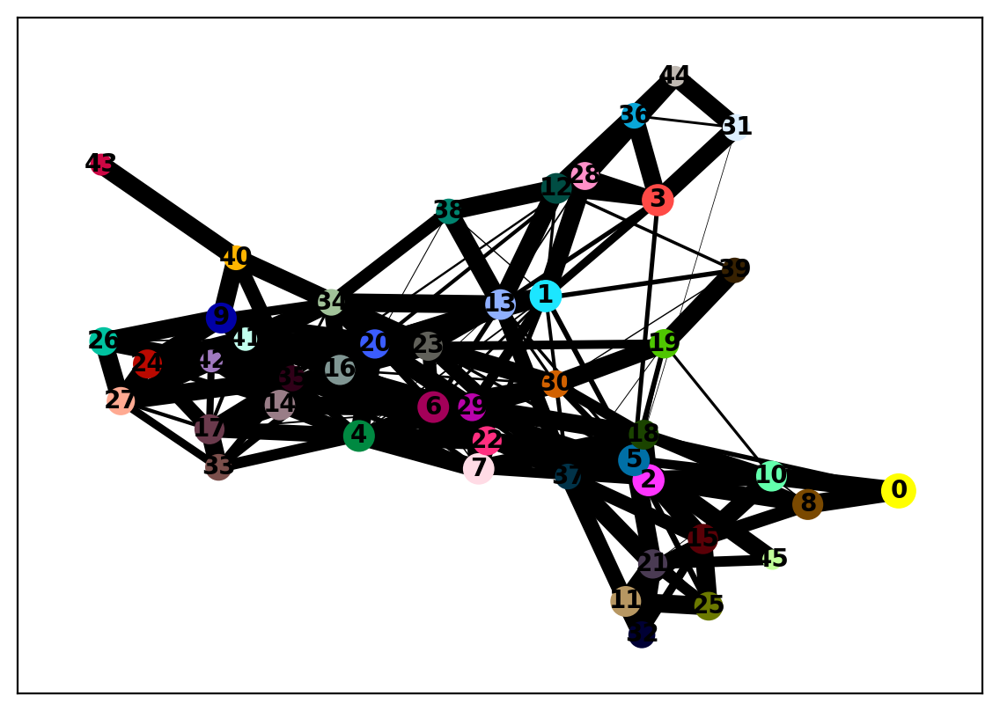

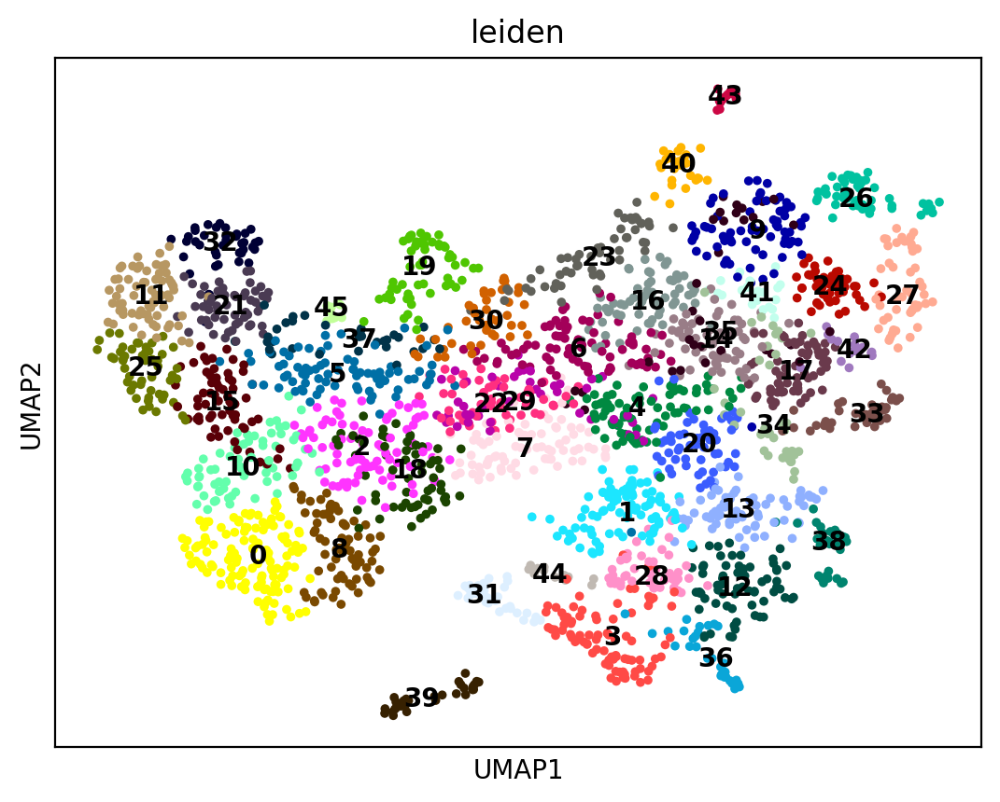

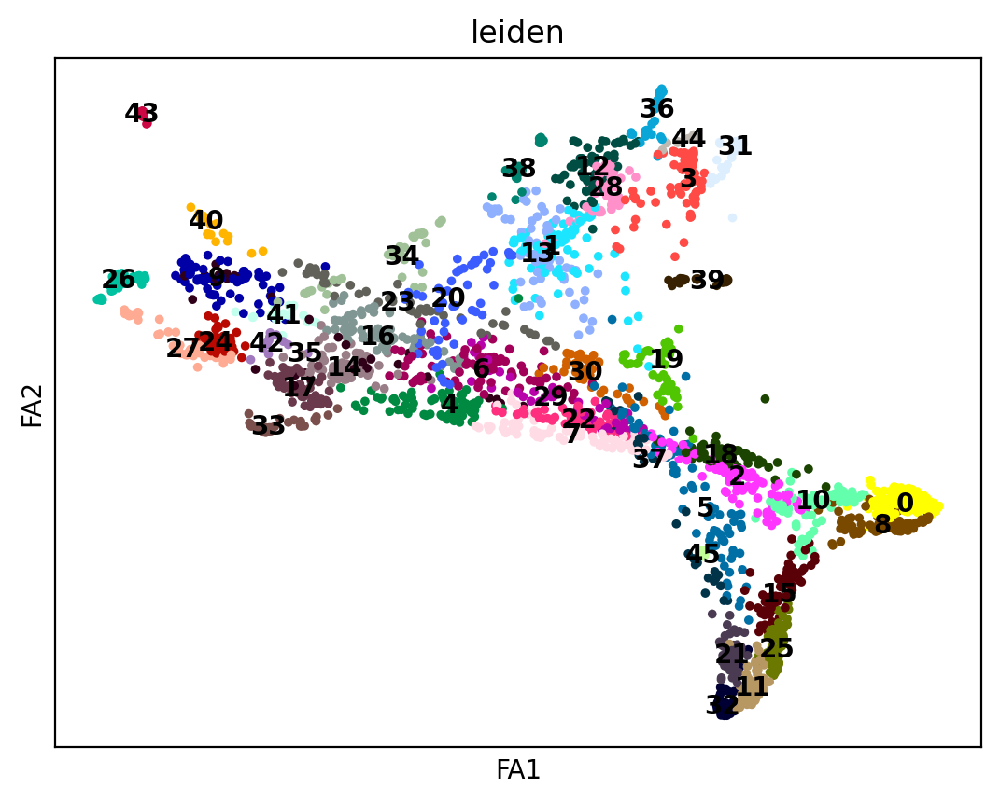

In [479]:
from scipy.sparse import csr_matrix
#adata_tt.obsp['connectivities'] = csr_matrix(filtered_matrix)
sc.tl.leiden(adata_tt,resolution = 3)
sc.tl.umap(adata_tt,min_dist=0.5, spread=0.5)
#sc.tl.diffmap(adata_tt, n_comps=50,neighbors_key='neighbors', random_state=0, copy=False)
sc.tl.paga(adata_tt, groups="leiden")
# bayes uncertainty: - in next iteration, create a GMM with num of comps == leiden clusters to assign cluster probability uncertainty to each node
sc.pl.paga(adata_tt,threshold=0.03, show=False)
sc.tl.draw_graph(adata_tt, layout='fa', init_pos="paga", root=None, random_state=0, n_jobs=None, adjacency=None, key_added_ext=None, neighbors_key='neighbors', obsp=None, copy=False)
#sc.tl.draw_graph(adata_tt, layout='drl', init_pos="paga", root=None, random_state=0, n_jobs=None, adjacency=None, key_added_ext=None, neighbors_key='neighbors', obsp=None, copy=False)

sc.pl.umap(adata_tt,color = 'leiden',legend_loc='on data')
#sc.pl.diffmap(adata_tt,color = 'leiden')
sc.pl.draw_graph(adata_tt,color = 'leiden', layout='fa',legend_loc='on data')
# sc.pl.draw_graph(adata_tt,color = 'leiden', layout='drl')

In [480]:
adata_tt.obs['leiden']

CHEMBL1200797|TECHNETIUM TC 99M SUCCIMER               7
CHEMBL1615779|IOBENGUANE I 131                         4
CHEMBL3989924|LUTETIUM DOTATATE LU-177                15
CHEMBL2108709|COLLAGENASE CLOSTRIDIUM HISTOLYTICUM     0
CHEMBL256997|ATALUREN                                 15
                                                      ..
CHEMBL4297064|MILNACIPRAN HYDROCHLORIDE                5
CHEMBL2062257|BRIMONIDINE TARTRATE                    16
CHEMBL1200479|DICYCLOMINE HYDROCHLORIDE                1
CHEMBL2110368|BETHANIDINE SULFATE                     21
CHEMBL1590946|CEFSULODIN SODIUM                        8
Name: leiden, Length: 2467, dtype: category
Categories (46, object): ['0', '1', '2', '3', ..., '42', '43', '44', '45']

# Extract semantic summaries for clusters

In [481]:
sampled_df = df
cluster_labels = np.array(adata_tt.obs['leiden'])

In [ ]:
# Load T5 model and tokenizer
t5_model_name = "t5-base"
t5_tokenizer = T5Tokenizer.from_pretrained(t5_model_name)
t5_model = T5ForConditionalGeneration.from_pretrained(t5_model_name)

# Build sentence descriptions for a given column and its top tokens
column_name = 'combined'  # Example column
top_tokens = top_tokens_dict[column_name] 
sampled_df[column_name] = (sampled_df[descriptors].apply(lambda x: '. '.join(x.dropna().astype(str)), axis=1)).astype(str)
sampled_df[column_name] = sampled_df[column_name].str.replace('nan','')
original_texts = sampled_df[column_name]

# Aggregate top tokens by cluster using the cluster labels
cluster_top_tokens = aggregate_top_tokens_by_cluster(top_tokens, cluster_labels)

# Prepare input text for each cluster
input_texts_for_clusters = prepare_input_text_for_cluster(cluster_top_tokens, original_texts.tolist(), cluster_labels)

# Generate summaries for each cluster
cluster_summaries = {}
for cluster, input_text in input_texts_for_clusters.items():
    summary = generate_text(input_text, max_length=50)  # You can adjust max_length as needed
    cluster_summaries[cluster] = summary

# Construct DataFrame
labels_df_T5 = pd.DataFrame(list(cluster_summaries.items()), columns=['Cluster', 'Summary'])
print(labels_df_T5)


In [490]:
df = filtered_df.copy()
filtered_df.columns

# filter DF for relevant drugs
adata_tt.obs['chembl'] = adata_tt.obs.index.str.split('|').str[0]
df['molecule_dictionary|chembl_id'] = df['molecule_dictionary|chembl_id'].astype(str)
df = df[df['molecule_dictionary|chembl_id'].isin(adata_tt.obs['chembl'])]

descriptors = [
               'atc_classification|level1_description',
               'atc_classification|level2_description',
               'atc_classification|level3_description',
               'atc_classification|level4_description','drug_mechanism|mechanism_of_action','drug_mechanism|tid','drug_mechanism|action_type','db_x_GO_CLASSIFICATION|path']

database_df = preprocess_columns_vectorized(df,descriptors,drug_name_column='molecule_dictionary|chembl_id' )
cluster_df = adata_tt.obs.copy()
cluster_df['chembl'] = cluster_df.index.str.split('|').str[0]

In [521]:
adata_tt.obs.loc[adata_tt.obs['leiden'].isin(['27','39','0'])].groupby('leiden').head(10)

,genes,all_genes,leiden,chembl,Level_5_semantics,Level_10_semantics,Level_15_semantics,Eczema_score,SCC_score,Healthy_score,Psoriasis_score
CHEMBL2108709|COLLAGENASE CLOSTRIDIUM HISTOLYTICUM,"COL24A1,COL11A1,COL3A1,COL5A2,COL4A4,COL4A3,CO...","COL6A5,COL4A3,COL5A3,COL24A1,COL1A1,COL6A1,COL...",0,CHEMBL2108709,nervous system psychol,nervous system psycholeptics hypn,nervous system psycholeptics hypnotics sedative,-0.059020,0.411168,-0.049051,-0.105082
CHEMBL4297240|ONASEMNOGENE ABEPARVOVEC,"SMN2,SMN1","SMN2,SMN1",0,CHEMBL4297240,nervous system psychol,nervous system psycholeptics hypn,nervous system psycholeptics hypnotics sedative,-0.059020,0.411168,-0.049051,-0.105082
CHEMBL1201130|BETAINE HYDROCHLORIDE,"BHMT2,BHMT,EHMT2","BHMT2,EHMT2,BHMT",0,CHEMBL1201130,nervous system psychol,nervous system psycholeptics hypn,nervous system psycholeptics hypnotics sedative,-0.059020,0.411168,-0.049051,-0.105082
CHEMBL1200412|NANDROLONE PHENPROPIONATE,AR,AR,0,CHEMBL1200412,nervous system psychol,nervous system psycholeptics hypn,nervous system psycholeptics hypnotics sedative,-0.059020,0.411168,-0.049051,-0.105082
CHEMBL1200436|OXANDROLONE,AR,AR,0,CHEMBL1200436,nervous system psychol,nervous system psycholeptics hypn,nervous system psycholeptics hypnotics sedative,-0.059020,0.411168,-0.049051,-0.105082
CHEMBL790|CHLORHEXIDINE,"TARDBP,USP1,RORC,PAX8,IDH1,HTT,EHMT2,HKDC1,RAD...","TARDBP,IDH1,RORC,TDP1,ATXN2,GBA1,CYP2D6,HKDC1,...",0,CHEMBL790,nervous system psychol,nervous system psycholeptics hypn,nervous system psycholeptics hypnotics sedative,-0.059020,0.411168,-0.049051,-0.105082
CHEMBL1201618|GLUCAGON HYDROCHLORIDE,GCGR,GCGR,0,CHEMBL1201618,nervous system psychol,nervous system psycholeptics hypn,nervous system psycholeptics hypnotics sedative,-0.059020,0.411168,-0.049051,-0.105082
CHEMBL788|IDOXURIDINE,TDP1,TDP1,0,CHEMBL788,nervous system psychol,nervous system psycholeptics hypn,nervous system psycholeptics hypnotics sedative,-0.059020,0.411168,-0.049051,-0.105082
CHEMBL1201557|INTERFERON ALFACON-1,"IFNAR2,IFNAR1","IFNAR1,IFNAR2",0,CHEMBL1201557,nervous system psychol,nervous system psycholeptics hypn,nervous system psycholeptics hypnotics sedative,-0.059020,0.411168,-0.049051,-0.105082
CHEMBL1201568|PEGFILGRASTIM,CSF3R,CSF3R,0,CHEMBL1201568,nervous system psychol,nervous system psycholeptics hypn,nervous system psycholeptics hypnotics sedative,-0.059020,0.411168,-0.049051,-0.105082


## Multi-level smenatic summary generation
- Pick the level which provides the appropriate level of summarisation

In [494]:
import pandas as pd
from transformers import T5Tokenizer, T5ForConditionalGeneration

# Assuming 'cluster_df' and 'database_df' are already defined and preprocessed

# Load T5 model and tokenizer
t5_model_name = "t5-small"
t5_tokenizer = T5Tokenizer.from_pretrained(t5_model_name)
t5_model = T5ForConditionalGeneration.from_pretrained(t5_model_name)

def generate_text(input_text, max_length=50):
    input_text = "summarize: " + input_text
    inputs = t5_tokenizer.encode(input_text, return_tensors="pt", max_length=512, truncation=True)
    summary_ids = t5_model.generate(inputs, max_length=max_length, num_return_sequences=1, early_stopping=True)
    summary = t5_tokenizer.decode(summary_ids[0], skip_special_tokens=True)
    return summary

def generate_semantic_labels(cluster_text, levels=[5, 10, 15]):
    semantic_labels = []
    for level in levels:
        summary = generate_text(cluster_text, max_length=level)
        semantic_labels.append(summary)
    return semantic_labels

# Iterate over clusters and assign semantic labels
cluster_summaries = []
for cluster_id in cluster_df['leiden'].unique():
    cluster_drugs = cluster_df.loc[cluster_df['leiden'] == cluster_id, 'chembl']
    cluster_data = database_df.loc[database_df['molecule_dictionary|chembl_id'].isin(cluster_drugs)]
    concatenated_text = ' '.join(cluster_data['atc_classification|level1_description'].fillna('').replace('nan', '') +
                                 ' ' + cluster_data['atc_classification|level2_description'].fillna('').replace('nan', '') +
                                 ' ' + cluster_data['atc_classification|level3_description'].fillna('').replace('nan', '') +
                                 ' ' + cluster_data['atc_classification|level4_description'].fillna('').replace('nan', ''))
    concatenated_text = ' '.join([word for word in concatenated_text.split() if word.lower() != 'nan'])

    if concatenated_text.strip():
        semantic_labels = generate_semantic_labels(concatenated_text, levels=[5, 10, 15])
        cluster_summaries.append([cluster_id] + semantic_labels)
    else:
        cluster_summaries.append([cluster_id] + ['No Description'] * len(levels))

labels_df_T5 = pd.DataFrame(cluster_summaries, columns=['Cluster', 'Level_5', 'Level_10', 'Level_15'])
print(labels_df_T5)

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


   Cluster                                Level_5  \
0        7                               antiepil   
1        4            respiratory system, sensory   
2       15                    dermatological use,   
3        0                 nervous system psychol   
4        2               respiratory system drugs   
5       18  cardiovascular system cardiac therapy   
6        8                nervous system psychoan   
7       23                         genital system   
8       22            cardiovascular system diure   
9       21                                 genito   
10      12            alimentary tract metabolism   
11      37                 antifungals dermatolog   
12      19                 antiinflammatory antir   
13       3            antiinflammatory agents non   
14       9                         antineoplastic   
15      16                             antihemorr   
16      25            cardiovascular system diure   
17      11                         antineoplas

In [501]:
labels_df_T5
for level in ['Level_5','Level_10','Level_15']:
    mapper = dict(zip(labels_df_T5['Cluster'],labels_df_T5[level]))
    adata_tt.obs[level+'_semantics'] = adata_tt.obs['leiden'].map(mapper)

In [901]:
adata_tt.obs

,genes,all_genes,leiden,chembl,Level_5_semantics,Level_10_semantics,Level_15_semantics,Eczema_score,Healthy_score,Psoriasis_score,SCC_score,cluster_sem,CD8_Exh_score,CD8_Exh_effect_scores
CHEMBL1200797|TECHNETIUM TC 99M SUCCIMER,A2M,A2M,7,CHEMBL1200797,antiepil,antiepileptics antiep,antiepileptics antiepileptics antie,-0.006291,-0.009578,-0.021668,0.142903,7_antiepileptics antiep,-0.173122,-0.022222
CHEMBL1615779|IOBENGUANE I 131,SLC6A2,SLC6A2,4,CHEMBL1615779,"respiratory system, sensory","respiratory system, sensory organs antihist","respiratory system, sensory organs antihistami...",-0.009491,-0.013871,-0.034357,0.204706,"4_respiratory system, sensory organs antihist",-0.004791,-0.095180
CHEMBL3989924|LUTETIUM DOTATATE LU-177,"SSTR1,SSTR5,SSTR2,SSTR4,SSTR3","SSTR5,SSTR4,SSTR1,SSTR2,SSTR3",15,CHEMBL3989924,dermatological antineoplastic,dermatological antineoplastic immunomodulating...,dermatological antineoplastic immunomodulating...,-0.129165,0.075122,-0.159849,0.320980,15_dermatological antineoplastic immunomodulat...,-0.005923,-0.337452
CHEMBL2108709|COLLAGENASE CLOSTRIDIUM HISTOLYTICUM,"COL24A1,COL11A1,COL3A1,COL5A2,COL4A4,COL4A3,CO...","COL6A5,COL4A3,COL5A3,COL24A1,COL1A1,COL6A1,COL...",0,CHEMBL2108709,nervous system psychol,nervous system psycholeptics hypn,nervous system psycholeptics hypnotics sedative,-0.011684,-0.033111,-0.058667,0.387580,0_nervous system psycholeptics hypn,-0.316755,-0.184162
CHEMBL256997|ATALUREN,"RPL22,RPL11,RPS8,RPL5,RPS27,RPS7,RPS27A,RPL31,...","RPS15A,RPS16,RPS4Y1,RPS9,RPL11,RPL19,FAU,RPL38...",15,CHEMBL256997,dermatological antineoplastic,dermatological antineoplastic immunomodulating...,dermatological antineoplastic immunomodulating...,-0.129165,0.075122,-0.159849,0.320980,15_dermatological antineoplastic immunomodulat...,-13.371687,-0.337452
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CHEMBL4297064|MILNACIPRAN HYDROCHLORIDE,"SLC6A2,SLC6A4","SLC6A4,SLC6A2",5,CHEMBL4297064,antineoplastic,antineoplastic immunomodulating agents an,antineoplastic immunomodulating agents antineo...,-0.018197,0.000933,-0.028182,0.118214,5_antineoplastic immunomodulating agents an,0.002725,-0.040508
CHEMBL2062257|BRIMONIDINE TARTRATE,"ADRA2B,ADRA2C,ADRA2A","ADRA2B,ADRA2C,ADRA2A",16,CHEMBL2062257,antihemorr,antihemorrhagics anti,antihemorrhagics antifibrino,-0.020132,-0.027964,-0.018217,0.276285,16_antihemorrhagics anti,-0.005662,-0.167127
CHEMBL1200479|DICYCLOMINE HYDROCHLORIDE,"CHRM3,CHRM1","CHRM1,CHRM3",1,CHEMBL1200479,musculo,musculoskeletal system muscle relaxants,musculoskeletal system muscle relaxants centra...,-0.014096,-0.019008,-0.038741,0.263243,1_musculoskeletal system muscle relaxants,-0.001089,-0.128218
CHEMBL2110368|BETHANIDINE SULFATE,SLC6A2,SLC6A2,21,CHEMBL2110368,genito,genito urinary system s,genito urinary system sex hormones modulators,-0.029944,-0.011372,-0.031298,0.233024,21_genito urinary system s,-0.004791,-0.087471


In [900]:
adata_tt.obs['cluster_sem'] =  adata_tt.obs['leiden'].astype(str)+ '_' + adata_tt.obs['Level_10_semantics'].astype(str)

In [4]:
#adata_tt = sc.read('A3_D2S_output_with_sem_sum.h5ad')

In [903]:
adata_tt.write('A3_D2S_output_with_sem_sum.h5ad')

# Let's find drugs clusters which have particular effects on populations
- Let's identify clusters which are enriched in each condition
- Let's extract top drugs for each mechanistic cluster
- Let's design the cluster mechanistic identification to be sensitve to populations controlled between healthy and SCC

In [5]:
# Score subset of just SCC for celltypes
# identify clusters which have high specificity for each stratifying var -e.g subset to just KC vs TSK pairs and score for clusters
# get mean cluster score for each stratifying condition

In [6]:
adata_tt

AnnData object with n_obs × n_vars = 2467 × 499758
    obs: 'genes', 'all_genes', 'leiden', 'chembl', 'Level_5_semantics', 'Level_10_semantics', 'Level_15_semantics', 'Eczema_score', 'Healthy_score', 'Psoriasis_score', 'SCC_score', 'cluster_sem', 'CD8_Exh_score', 'CD8_Exh_effect_scores'
    var: 'sample_id', 'mad_prd', 'Status', 'Site', 'Tissue', 'Enrichment', 'Location', 'Sex', 'Age', 'stage', 'full_clustering', 'level3_celltype', 'tum.norm', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'patient', 'level1_celltype', 'level2_celltype', 'batch_id', 'auto_prd', 'batch', 'n_genes', 'level4_celltype'
    uns: 'draw_graph', 'leiden', 'leiden_colors', 'leiden_sizes', 'neighbors', 'paga', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_LLM_MOFA', 'X_diffmap', 'X_draw_graph_fa', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [7]:
adata_tt.var

,sample_id,mad_prd,Status,Site,Tissue,Enrichment,Location,Sex,Age,stage,...,nCount_RNA,nFeature_RNA,patient,level1_celltype,level2_celltype,batch_id,auto_prd,batch,n_genes,level4_celltype
AAACCTGAGCTACCGC-1-SKN8090524-0,SKN8090524,False,Eczema,non_lesion,Epidermis,Live_single_spike,Lower_back,Female,62.0,adult,...,nan,nan,nan,nan,nan,nan,nan,0,715,non_lesion_Differentiated_KC
AAACCTGCACCTCGGA-1-SKN8090524-0,SKN8090524,False,Eczema,non_lesion,Epidermis,Live_single_spike,Lower_back,Female,62.0,adult,...,nan,nan,nan,nan,nan,nan,nan,0,743,non_lesion_Differentiated_KC
AAACCTGGTCAGAAGC-1-SKN8090524-0,SKN8090524,False,Eczema,non_lesion,Epidermis,Live_single_spike,Lower_back,Female,62.0,adult,...,nan,nan,nan,nan,nan,nan,nan,0,1131,non_lesion_Differentiated_KC
AAACCTGGTCGAACAG-1-SKN8090524-0,SKN8090524,False,Eczema,non_lesion,Epidermis,Live_single_spike,Lower_back,Female,62.0,adult,...,nan,nan,nan,nan,nan,nan,nan,0,1265,non_lesion_Differentiated_KC
AAACCTGTCTCCGGTT-1-SKN8090524-0,SKN8090524,False,Eczema,non_lesion,Epidermis,Live_single_spike,Lower_back,Female,62.0,adult,...,nan,nan,nan,nan,nan,nan,nan,0,955,non_lesion_Differentiated_KC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P10_Normal_TTTGTCAAGAGTCTGG-1,nan,False,SCC,nan,nan,nan,nan,nan,nan,nan,...,5585.0,1659.0,P10,Epithelial,Normal_KC_Diff,P10_Normal,False,1,1566,Normal_KC_Diff
P10_Normal_TTTGTCAAGTCGTTTG-1,nan,False,SCC,nan,nan,nan,nan,nan,nan,nan,...,14207.0,3541.0,P10,LC,LC,P10_Normal,False,1,3354,Normal_LC
P10_Normal_TTTGTCACAGTGGGAT-1,nan,False,SCC,nan,nan,nan,nan,nan,nan,nan,...,10068.0,2540.0,P10,LC,LC,P10_Normal,False,1,2410,Normal_LC
P10_Normal_TTTGTCATCCAGGGCT-1,nan,False,SCC,nan,nan,nan,nan,nan,nan,nan,...,5223.0,1849.0,P10,LC,LC,P10_Normal,False,1,1760,Normal_LC


In [514]:
# Step 1: Group genes based on a variable in .var, e.g., 'group'
group_means = adata_tt.to_df().groupby(adata_tt.var['level4_celltype']).mean()

# Step 2: Convert the DataFrame back to AnnData
new_adata = sc.AnnData(X=group_means)

# Step 3: Update .var and .obs as needed
new_adata.var['groups'] = group_means.index
new_adata.obs = adata.obs.copy()

In [ ]:
ll = list(adata_tt.var[adata_tt.var['level3_celltype'].isin(['TSK'])].index)

In [ ]:
adata_tt.var

In [379]:
adata_tt.var['Status']

AAACCTGAGCTACCGC-1-SKN8090524-0    Eczema
AAACCTGCACCTCGGA-1-SKN8090524-0    Eczema
AAACCTGGTCAGAAGC-1-SKN8090524-0    Eczema
AAACCTGGTCGAACAG-1-SKN8090524-0    Eczema
AAACCTGTCTCCGGTT-1-SKN8090524-0    Eczema
                                    ...  
P10_Normal_TTTGTCAAGAGTCTGG-1         SCC
P10_Normal_TTTGTCAAGTCGTTTG-1         SCC
P10_Normal_TTTGTCACAGTGGGAT-1         SCC
P10_Normal_TTTGTCATCCAGGGCT-1         SCC
P10_Normal_TTTGTCATCGAGGTAG-1         SCC
Name: Status, Length: 499758, dtype: category
Categories (4, object): ['Eczema', 'Healthy', 'Psoriasis', 'SCC']

# Let's design a generalised scoring schema for each status
- This generalised and the scores may be non-specific
- We can take the mean cluster scores for each status Z-mean and organise this into a heatmap
- Such a scoring schema enables us to figure out overarching mechanisms at play between status groups

In [8]:
# remove healthy control from scc
rm = list(adata_tt.var.loc[adata_tt.var['batch_id'].str.contains('Normal')].index)
adata_tt_s = adata_tt[~adata_tt.obs.index.isin(rm)]

computing score 'Eczema_score'
    finished: added
    'Eczema_score', score of gene set (adata.obs).
    1531 total control genes are used. (0:00:20)


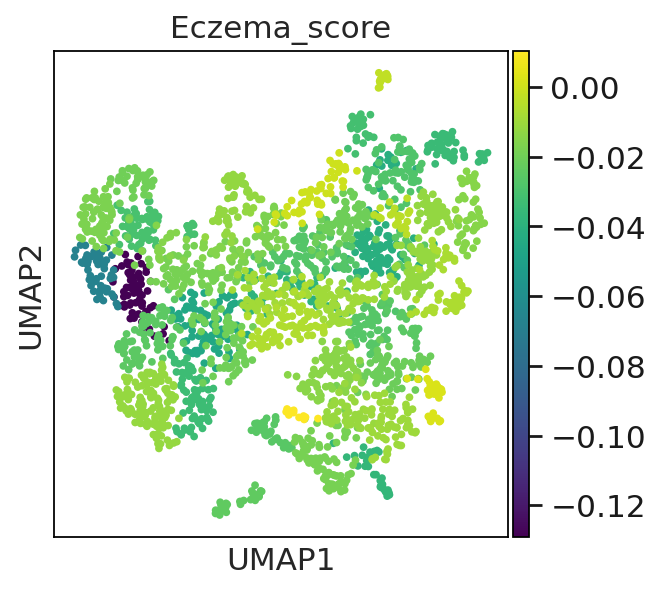

computing score 'SCC_score'
    finished: added
    'SCC_score', score of gene set (adata.obs).
    1919 total control genes are used. (0:00:13)


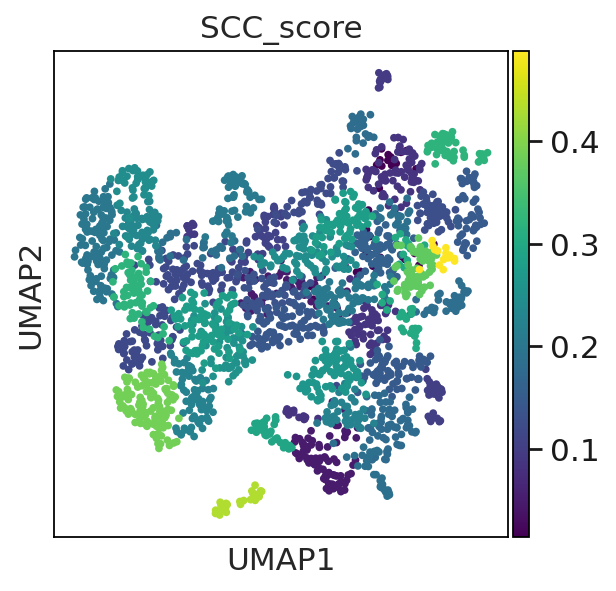

computing score 'Psoriasis_score'
    finished: added
    'Psoriasis_score', score of gene set (adata.obs).
    1422 total control genes are used. (0:00:21)


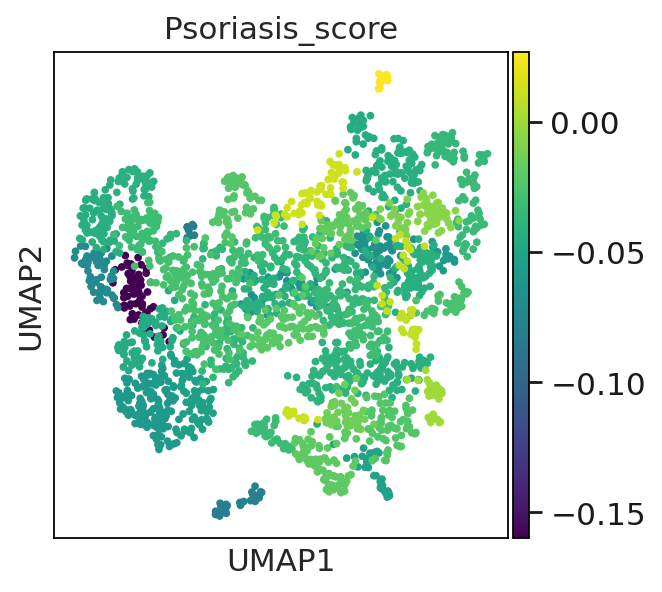

In [10]:
status = ['Eczema','SCC','Psoriasis']
stat_var = []
for i in status:
    ll = list(adata_tt_s.var[adata_tt_s.var['Status'].isin([i])].index)
    # vs healthy control
    keep = list(adata_tt_s.var.loc[adata_tt_s.var['Status'].isin(['Healthy']+[i])].index)
    score = sc.tl.score_genes(adata_tt_s[:,keep], ll, ctrl_size=100, gene_pool=None, n_bins=25, score_name=(i+'_score'), random_state=0, copy=True, use_raw=None)
    adata_tt_s.obs[i+'_score'] = score.obs[i+'_score']
    cluster_scores= adata_tt_s.obs.groupby('leiden')[i+'_score'].mean()
    adata_tt_s.obs[i+'_score'] = (adata_tt_s.obs['leiden'].map(cluster_scores)).astype(float)
    stat_var.append(i+'_score')
    sc.pl.umap(adata_tt_s,color = i+'_score')

## Let's design the heatmap schema and compute cluster status scores

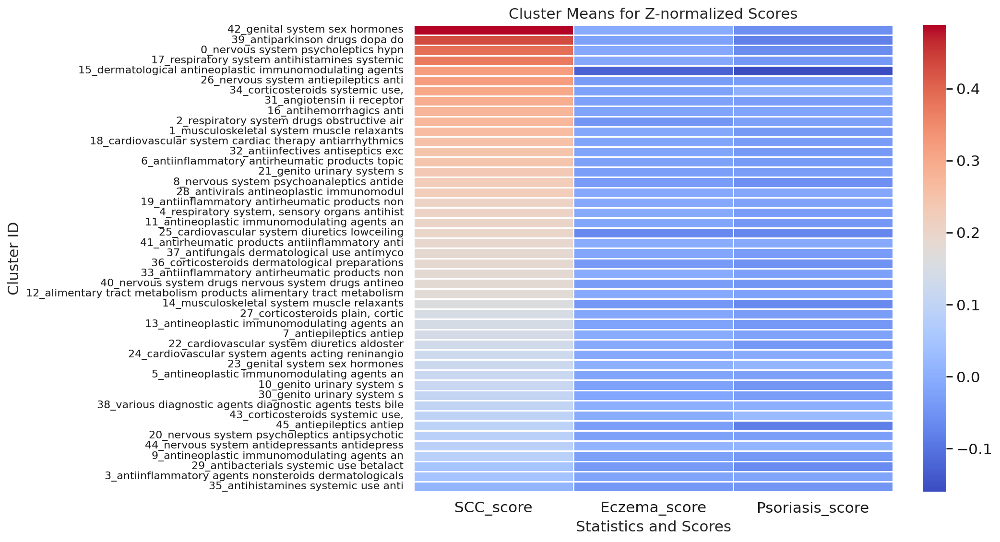

In [11]:
adata_tt_s.obs['cluster_sem'] =  adata_tt_s.obs['leiden'].astype(str)+ '_' + adata_tt_s.obs['Level_10_semantics'].astype(str)
htmp_df = adata_tt_s.obs[stat_var+['cluster_sem']]
cluster_stats = htmp_df.groupby('cluster_sem').mean()
cluster_stats = cluster_stats.sort_values(by='SCC_score', axis=0, ascending=False)
cluster_stats = cluster_stats[[ 'SCC_score','Eczema_score','Psoriasis_score']]
import seaborn as sns
import matplotlib.pyplot as plt

# Set up the matplotlib figure
plt.figure(figsize=(10, 8))

# Draw a heatmap with the numeric cluster_statsvalues in each cell
sns.heatmap(cluster_stats, annot=False, fmt=".2f", linewidths=.5, cmap='coolwarm', yticklabels=True)

# Adding title and labels for clarity
plt.title('Cluster Means for Z-normalized Scores')
plt.xlabel('Statistics and Scores')
plt.ylabel('Cluster ID')
plt.yticks(rotation=0, fontsize='10')  # Adjust rotation and font size as needed


# Show the plot
plt.show()

# Top clusters for SCC

In [12]:
print(cluster_stats.sort_values(by='SCC_score', axis=0, ascending=False)['SCC_score'].head(5))
topclus = list(cluster_stats.sort_values(by='SCC_score', axis=0, ascending=False)['SCC_score'].head(5).index)

cluster_sem
42_genital system sex hormones                              0.488244
39_antiparkinson drugs dopa do                              0.432488
0_nervous system psycholeptics hypn                         0.387580
17_respiratory system antihistamines systemic               0.372275
15_dermatological antineoplastic immunomodulating agents    0.320980
Name: SCC_score, dtype: float64


/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


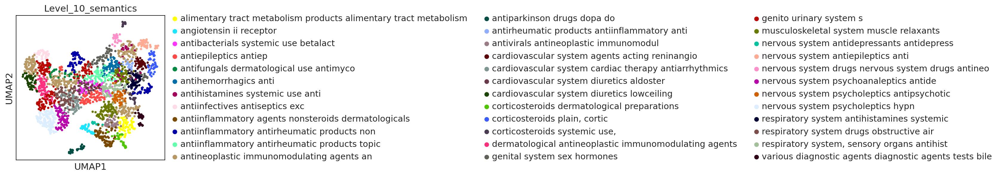

In [13]:
sc.pl.umap(adata_tt_s,color = 'Level_10_semantics')

# Contrastive approaah: Let's now isolate this scoring schema to only the cell states of interest

computing score 'CD8_Exh_score'
    finished: added
    'CD8_Exh_score', score of gene set (adata.obs).
    2296 total control genes are used. (0:00:12)


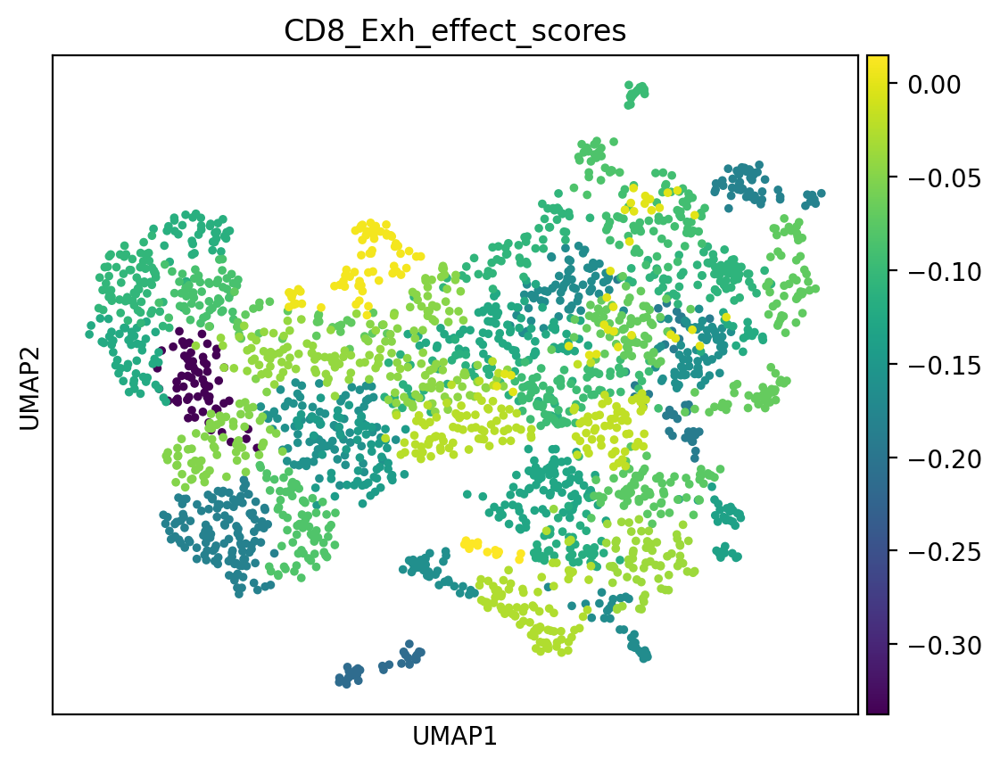

In [622]:

i = 'CD8_Exh'

ll = list(adata_tt_s.var[adata_tt_s.var['level3_celltype'].isin(['CD8_Exh'])].index)

keep = list(adata_tt_s.var.loc[adata_tt_s.var['Status'].isin(['Healthy']+['SCC'])].index)
score = sc.tl.score_genes(adata_tt_s[:,keep], ll, ctrl_size=100, gene_pool=None, n_bins=25, score_name=(i+'_score'), random_state=0, copy=True, use_raw=None)
adata_tt_s.obs[i+'_score'] = score.obs[i+'_score']

#sc.tl.score_genes(adata_tt_s, ll, ctrl_size=50, gene_pool=None, n_bins=25, score_name=(i+'_score'), random_state=0, copy=False, use_raw=None)
cluster_scores= adata_tt_s.obs.groupby('leiden')[i+'_score'].mean()


adata_tt_s.obs['CD8_Exh_effect_scores'] = (adata_tt_s.obs['leiden'].map(cluster_scores))
adata_tt_s.obs['CD8_Exh_effect_scores'] = adata_tt_s.obs['CD8_Exh_effect_scores'].astype(float)
sc.pl.umap(adata_tt_s,color ='CD8_Exh_effect_scores')

# Identify clusters which are enriched for each cellstate
- get scores per cellstate
- Get top drugs per cluster for each cellstate

In [14]:
adata_tt_s.obs['cluster_sem'] =  adata_tt_s.obs['leiden'].astype(str)+ '_' + adata_tt_s.obs['Level_10_semantics'].astype(str)

In [15]:
adata = adata_tt.T

# split marker dict with clustering information
- align top markers with clustering information
- assign high-level semantic assignments and re-organise


- Here, we group the drugs into mechnaistic clusters, then we filter clusters by logfc and pvalue

In [16]:
adata.obs['level4_celltype'] = adata.obs['tum.norm'].astype(str)+'_' + adata.obs['level3_celltype'].astype(str).str.replace('Tumor_','').str.replace('Normal_','')
spot_var = 'level4_celltype'
keep_var = ['SCC']
# cell_state_var = 'level4_celltype'
pairs = {
'CD8_Exh_CD8_EMRA':['Tumor_CD8_Exh','Normal_CD8_EMRA'],
'CD8_Exh_CD8_EM':['Tumor_CD8_Exh','Normal_CD8_EM'],
'CD8_Exh_CD8_Naive':['Tumor_CD8_Exh','Normal_CD8_Naive'],
'TSK_basal':['Tumor_TSK','Normal_KC_Basal'],
'TSK_Diff':['Tumor_TSK','Normal_KC_Diff'],
}

# remove healthy from sl
adata_sl = adata[(adata.obs['Status'].isin(keep_var))]
# assign a minimal drug count per mechanism
min_count = 3
return_clus = 3

result_dic = {}
marker_dict = {}
marker_df_concatenated = pd.DataFrame()
for key_p in pairs.keys():
    print(key_p)
    sc.tl.rank_genes_groups(adata_sl, method="wilcoxon", groupby=spot_var,groups = pairs[key_p],key_added = key_p)
    result_dic[key_p] = adata_sl.uns[key_p]
    groups = result_dic[key_p]['names'].dtype.names
    DE = pd.DataFrame(
    {group + '_' + key[:1]: result_dic[key_p][key][group]
    for group in groups for key in ['names', 'pvals','logfoldchanges']}).head(500)
    degs = DE[:]
    if 'concat' in locals() or 'concat' in globals():
        del(concat)
    n = degs.loc[:, degs.columns.str.endswith("_n")]
    n = pd.melt(n)
    p = degs.loc[:, degs.columns.str.endswith("_p")]
    p = pd.melt(p)
    l = degs.loc[:, degs.columns.str.endswith("_l")]
    l = pd.melt(l)
    n = n.replace(regex=r'_n', value='')
    n = n.rename(columns={"variable": "cluster", "value": "gene"})
    p = (p.drop(["variable"],axis = 1)).rename(columns={ "value": "p_val"})
    l = (l.drop(["variable"],axis = 1)).rename(columns={ "value": "logfc"})
    concat = pd.concat([n,p,l],axis=1)
    #remove mito genes from data
    concat = concat[~concat["gene"].str.startswith("MT-")]
    concat = concat[~concat["gene"].str.startswith("RP11-")]
    concat["cluster"] = concat["cluster"].astype(str)

    # Filtering the DataFrame to only include entries with indices in the list
    marker_df_i = concat.groupby('cluster').apply(lambda grp: grp.nsmallest(50, 'p_val')).reset_index(drop=True)
    fil_df = adata_tt_s.obs[adata_tt_s.obs.index.isin(marker_df_i['gene'])]
    # First, ensure that the index of fil_df is the column you want to join on ('gene')
    fil_df['gene'] = fil_df.index
    # Use the map function to create a new column in marker_df_i based on 'gene' column mapping
    marker_df_i['cluster_sem'] = marker_df_i['gene'].map(fil_df.set_index('gene')['cluster_sem'])
    # remove normal
    marker_df_i = marker_df_i[~marker_df_i['cluster'].str.contains('Normal')]

    # Calculate the mean and count of p_val for each cluster_sem group for sorting and filtering purposes
    cluster_stats = marker_df_i.groupby('cluster_sem').agg({
        'p_val': ['mean', 'count']  # Calculate mean of p_vals and count of entries per cluster_sem
    }).rename(columns={'mean': 'group_p_val', 'count': 'count'})

    # Flatten the column names after aggregation
    cluster_stats.columns = ['_'.join(col).strip() for col in cluster_stats.columns.values]

    # Filter groups to keep only those with >= min_count entries
    valid_clusters = cluster_stats[cluster_stats['p_val_count'] >= min_count].index

    # Filter the original DataFrame to include only rows from valid cluster_sems
    filtered_marker_df_i = marker_df_i[marker_df_i['cluster_sem'].isin(valid_clusters)]

    # Join these stats back to the DataFrame to get the group_p_val in each row
    filtered_marker_df_i = filtered_marker_df_i.join(cluster_stats['p_val_group_p_val'], on='cluster_sem')

    # Sort the DataFrame first by group_p_val of cluster_sem, then by p_val within each cluster_sem

    sorted_marker_df = filtered_marker_df_i.sort_values(by=['p_val_group_p_val', 'p_val'])
    top_pval_clusters = list(cluster_stats[cluster_stats.index.isin(sorted_marker_df['cluster_sem'])].nsmallest(return_clus, 'p_val_group_p_val').index)
    sorted_marker_df = sorted_marker_df[sorted_marker_df['cluster_sem'].isin(list(top_pval_clusters))]
    sorted_marker_df['clus_mechanism'] = sorted_marker_df['cluster'].astype(str)+"_"+sorted_marker_df['cluster_sem'].astype(str)

    # Group by 'cluster' and collect 'gene' as list, now correctly sorted within and across cluster_sem
    grouped = sorted_marker_df.groupby('clus_mechanism')['gene'].apply(list).to_dict()

    # Optionally, convert cluster numbers to string if necessary
    markers = {str(k): v for k, v in grouped.items()}

    
    #markers.pop(list(markers.keys())[1])
    marker_dict.update(markers)
    marker_df_concatenated = pd.concat([marker_df_concatenated, sorted_marker_df], ignore_index=True)

CD8_Exh_CD8_EMRA
ranking genes


/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/contextlib.py:142: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


    finished: added to `.uns['CD8_Exh_CD8_EMRA']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:14)
CD8_Exh_CD8_EM
ranking genes


/tmp/ipykernel_886/1136512166.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fil_df['gene'] = fil_df.index


    finished: added to `.uns['CD8_Exh_CD8_EM']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:11)
CD8_Exh_CD8_Naive
ranking genes


/tmp/ipykernel_886/1136512166.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fil_df['gene'] = fil_df.index


    finished: added to `.uns['CD8_Exh_CD8_Naive']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:11)
TSK_basal
ranking genes


/tmp/ipykernel_886/1136512166.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fil_df['gene'] = fil_df.index


    finished: added to `.uns['TSK_basal']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:11)
TSK_Diff
ranking genes


/tmp/ipykernel_886/1136512166.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fil_df['gene'] = fil_df.index


    finished: added to `.uns['TSK_Diff']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:11)


/tmp/ipykernel_886/1136512166.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fil_df['gene'] = fil_df.index


In [17]:
marker_df_concatenated.to_csv('D2S_contrastive_mode_diffeential_drug_mechanistic_outs.csv')

{'Tumor_CD8_Exh_11_antineoplastic immunomodulating agents an': ['CHEMBL3137343|PEMBROLIZUMAB', 'CHEMBL4297723|CEMIPLIMAB', 'CHEMBL1096885|VALRUBICIN'], 'Tumor_CD8_Exh_12_alimentary tract metabolism products alimentary tract metabolism': ['CHEMBL3989977|EMAPALUMAB', 'CHEMBL1201438|ALDESLEUKIN', 'CHEMBL4298124|DOSTARLIMAB'], 'Tumor_CD8_Exh_15_dermatological antineoplastic immunomodulating agents': ['CHEMBL1201571|ALEFACEPT', 'CHEMBL3990044|RELATLIMAB', 'CHEMBL1201605|DACLIZUMAB'], 'Tumor_TSK_11_antineoplastic immunomodulating agents an': ['CHEMBL771|CYCLOSERINE', 'CHEMBL1002|LEVOSALBUTAMOL', 'CHEMBL1256958|EPINEPHRINE BITARTRATE'], 'Tumor_TSK_25_cardiovascular system diuretics lowceiling': ['CHEMBL267936|MECAMYLAMINE', 'CHEMBL325041|BORTEZOMIB', 'CHEMBL451887|CARFILZOMIB', 'CHEMBL1614|DESLANOSIDE'], 'Tumor_TSK_36_corticosteroids dermatological preparations': ['CHEMBL1096|AMLEXANOX', 'CHEMBL1401|NITAZOXANIDE', 'CHEMBL343448|ROMIDEPSIN']}


/tmp/ipykernel_886/1501129502.py:15: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  plt_data.obs[spot_var] = plt_data.obs[spot_var].astype('category').cat.reorder_categories(['Tumor_CD8_Exh','Tumor_TSK'])
/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


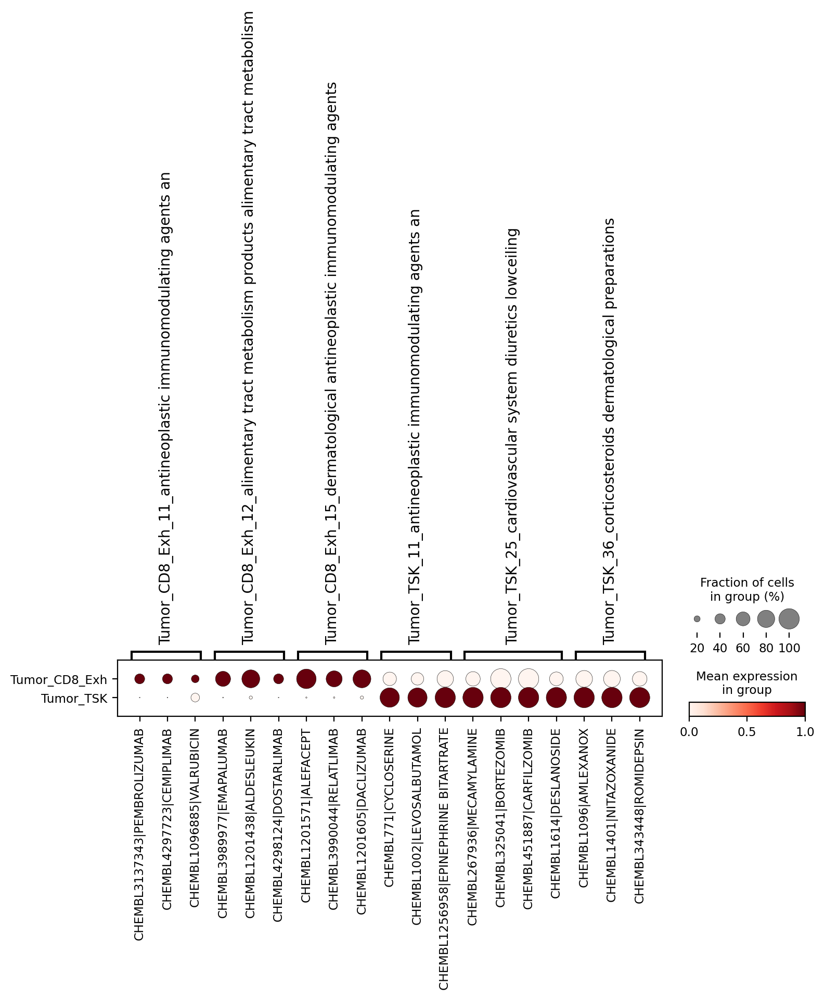

In [27]:
plt.rcdefaults()
seen_items = set()
filtered_markers = {}

for key, items in marker_dict.items():
    filtered_markers[key] = []
    for item in items:
        if item not in seen_items:
            seen_items.add(item)
            filtered_markers[key].append(item)
filtered_markers = {k: v for k, v in filtered_markers.items() if v}

print(filtered_markers)
plt_data = adata_sl[adata_sl.obs[spot_var].isin(['Tumor_CD8_Exh','Tumor_TSK'])]
plt_data.obs[spot_var] = plt_data.obs[spot_var].astype('category').cat.reorder_categories(['Tumor_CD8_Exh','Tumor_TSK'])
(sc.pl.dotplot(adata_sl[adata_sl.obs[spot_var].isin(['Tumor_CD8_Exh','Tumor_TSK'])], var_names = filtered_markers, groupby=spot_var,dendrogram=False,standard_scale='var', color_map='Reds', show = True)) # title=i

In [24]:
adata_tt.obs.loc[adata_tt.obs.index.isin(list(marker_df_concatenated['gene'])),'genes']

CHEMBL771|CYCLOSERINE                                                     EHMT2,HIF1A,BLM
CHEMBL1201438|ALDESLEUKIN                                               IL2RG,IL2RA,IL2RB
CHEMBL1401|NITAZOXANIDE                      NFE2L2,SMN2,SMN1,AHR,NPSR1,VDR,PKM,TP53,NPC1
CHEMBL1096|AMLEXANOX                           PDE4B,PDE4D,RAB9A,PKM,GAA,NPC1,PDE4A,PDE4C
CHEMBL3989977|EMAPALUMAB                                                             IFNG
CHEMBL1201605|DACLIZUMAB                                                IL2RG,IL2RA,IL2RB
CHEMBL1201571|ALEFACEPT                                                               CD2
CHEMBL1614|DESLANOSIDE                  ATP1A1,ATP1A2,ATP1A4,ATP1B1,ATP1B3,FXYD2,TDP1,...
CHEMBL325041|BORTEZOMIB                 PSMB2,PSMA5,PSMD4,PSMB4,EPAS1,PSMD14,PSMD1,PSM...
CHEMBL343448|ROMIDEPSIN                 HDAC1,HDAC4,HDAC11,HDAC3,HDAC2,HDAC9,HDAC6,HDA...
CHEMBL4297723|CEMIPLIMAB                                                            PDCD1
CHEMBL3137

In [25]:
list(marker_df_concatenated['gene'])

['CHEMBL1201571|ALEFACEPT',
 'CHEMBL3990044|RELATLIMAB',
 'CHEMBL1201605|DACLIZUMAB',
 'CHEMBL3989977|EMAPALUMAB',
 'CHEMBL1201438|ALDESLEUKIN',
 'CHEMBL4298124|DOSTARLIMAB',
 'CHEMBL3137343|PEMBROLIZUMAB',
 'CHEMBL4297723|CEMIPLIMAB',
 'CHEMBL1096885|VALRUBICIN',
 'CHEMBL1201571|ALEFACEPT',
 'CHEMBL3990044|RELATLIMAB',
 'CHEMBL1201605|DACLIZUMAB',
 'CHEMBL3989977|EMAPALUMAB',
 'CHEMBL1201438|ALDESLEUKIN',
 'CHEMBL4298124|DOSTARLIMAB',
 'CHEMBL3137343|PEMBROLIZUMAB',
 'CHEMBL4297723|CEMIPLIMAB',
 'CHEMBL1096885|VALRUBICIN',
 'CHEMBL1201571|ALEFACEPT',
 'CHEMBL3990044|RELATLIMAB',
 'CHEMBL1201605|DACLIZUMAB',
 'CHEMBL3989977|EMAPALUMAB',
 'CHEMBL1201438|ALDESLEUKIN',
 'CHEMBL4298124|DOSTARLIMAB',
 'CHEMBL3137343|PEMBROLIZUMAB',
 'CHEMBL4297723|CEMIPLIMAB',
 'CHEMBL1096885|VALRUBICIN',
 'CHEMBL1096|AMLEXANOX',
 'CHEMBL1401|NITAZOXANIDE',
 'CHEMBL343448|ROMIDEPSIN',
 'CHEMBL771|CYCLOSERINE',
 'CHEMBL1002|LEVOSALBUTAMOL',
 'CHEMBL1256958|EPINEPHRINE BITARTRATE',
 'CHEMBL267936|MECAMYLAMINE

# Plot cluster mechanistic targets

- take all mechanistic targets and plot the embedding space for each cellstate as well as the clusters of interest
- Next, plot the predicted drug gene targets as a spotplot seperately

In [78]:
adata_x_i.obs

,sample_id,mad_prd,Status,Site,Tissue,Enrichment,Location,Sex,Age,stage,...,tum.norm,orig.ident,nCount_RNA,nFeature_RNA,patient,level1_celltype,level2_celltype,batch_id,auto_prd,batch
P1_Tumor_AAACCTGAGTCAAGCG-1,nan,False,SCC,nan,nan,nan,nan,nan,nan,nan,...,Tumor,0.0,40856.0,5206.0,P1,Epithelial,Tumor_KC_Diff,P1_Tumor,False,1
P1_Tumor_AAACCTGCAAATTGCC-1,nan,False,SCC,nan,nan,nan,nan,nan,nan,nan,...,Tumor,0.0,15511.0,3468.0,P1,Epithelial,Keratinocyte,P1_Tumor,False,1
P1_Tumor_AAACCTGGTAGGAGTC-1,nan,False,SCC,nan,nan,nan,nan,nan,nan,nan,...,Tumor,0.0,24652.0,4154.0,P1,Epithelial,Tumor_KC_Basal,P1_Tumor,False,1
P1_Tumor_AAACGGGAGATGTAAC-1,nan,False,SCC,nan,nan,nan,nan,nan,nan,nan,...,Tumor,0.0,27554.0,4334.0,P1,Epithelial,Tumor_KC_Basal,P1_Tumor,False,1
P1_Tumor_AAACGGGAGCTGCAAG-1,nan,False,SCC,nan,nan,nan,nan,nan,nan,nan,...,Tumor,0.0,24980.0,4822.0,P1,Epithelial,Tumor_KC_Cyc,P1_Tumor,False,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P10_Normal_TTTGTCAAGAGTCTGG-1,nan,False,SCC,nan,nan,nan,nan,nan,nan,nan,...,Normal,1.0,5585.0,1659.0,P10,Epithelial,Normal_KC_Diff,P10_Normal,False,1
P10_Normal_TTTGTCAAGTCGTTTG-1,nan,False,SCC,nan,nan,nan,nan,nan,nan,nan,...,Normal,1.0,14207.0,3541.0,P10,LC,LC,P10_Normal,False,1
P10_Normal_TTTGTCACAGTGGGAT-1,nan,False,SCC,nan,nan,nan,nan,nan,nan,nan,...,Normal,1.0,10068.0,2540.0,P10,LC,LC,P10_Normal,False,1
P10_Normal_TTTGTCATCCAGGGCT-1,nan,False,SCC,nan,nan,nan,nan,nan,nan,nan,...,Normal,1.0,5223.0,1849.0,P10,LC,LC,P10_Normal,False,1


In [89]:
flat_dict['Tumor_CD8_Exh_11_antineoplastic immunomodulating agents an']

['TDP1, TOP2A, PDCD1']

computing density on 'umap'
--> added
    'umap_density_cluster_sem', densities (adata.obs)
    'umap_density_cluster_sem_params', parameter (adata.uns)
Tumor_CD8_Exh


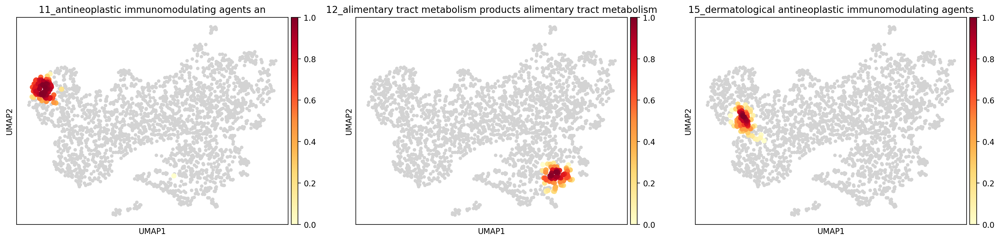

Tumor_TSK


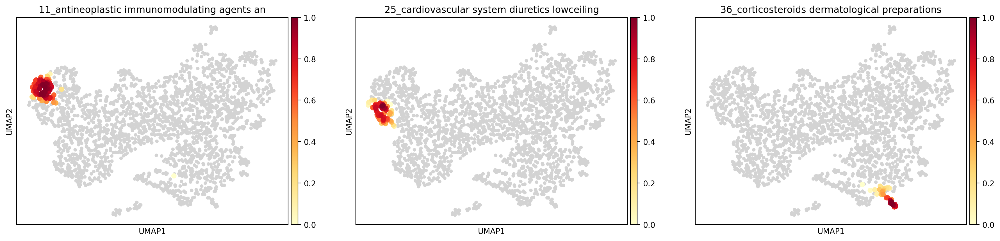

In [44]:
sc.tl.embedding_density(adata_tt, basis='umap', groupby='cluster_sem')
for group in marker_df_concatenated['cluster'].unique():
    print(group)
    grp = list(marker_df_concatenated.loc[marker_df_concatenated['cluster'].isin([group]),'cluster_sem'].astype('category').cat.categories)
    sc.pl.embedding_density(adata_tt, basis='umap', key=None, groupby='cluster_sem', group=grp, color_map='YlOrRd', bg_dotsize=80, fg_dotsize=180, vmax=1, vmin=0, vcenter=None, norm=None, ncols=4, hspace=0.25)


In [93]:
# for each target mechanism
adata_x = sc.read('/nfs/team205/ig7/projects/SCC_nano_string/drug2state/KH_SCC_PS_EZ_HL.h5ad',backed='r')
adata_x_i = adata_x[adata_x.obs['Status'].isin(['SCC'])]
adata_x_i = adata_x_i.to_memory()
sc.pp.normalize_total(adata_x_i, target_sum=1e4)
sc.pp.log1p(adata_x_i)

normalizing counts per cell
    finished (0:00:00)


{'Tumor_CD8_Exh_11_antineoplastic immunomodulating agents an': ['TDP1', 'TOP2A', 'PDCD1'], 'Tumor_CD8_Exh_12_alimentary tract metabolism products alimentary tract metabolism': ['IL2RG', 'IL2RA', 'IL2RB', 'IFNG'], 'Tumor_CD8_Exh_15_dermatological antineoplastic immunomodulating agents': ['LAG3', 'CD2'], 'Tumor_TSK_11_antineoplastic immunomodulating agents an': ['ADRB2', 'EHMT2', 'ADRA2C', 'HSD17B10', 'HIF1A', 'ADRB3', 'ADRA1B', 'BLM', 'TSHR', 'ADRA2B', 'ADRA1A', 'ADRA2A', 'ADRB1', 'ADRA1D', 'BAZ2B', 'KDM4E'], 'Tumor_TSK_25_cardiovascular system diuretics lowceiling': ['PSMA3', 'PSMB6', 'PKM', 'PSMA6', 'PSMD1', 'PSMA1', 'ATP1A1', 'PSMB11', 'ATP1A4', 'ATP1A2', 'PSMD6', 'PSMD2', 'PSMA2', 'PSMD13', 'PSMD11', 'PSMB7', 'PSMB9', 'FXYD2', 'PSMB4', 'PSMC6', 'PSMD7', 'PSMA7', 'PSMD4', 'PSMC1', 'ADRM1', 'ATP1A3', 'ATP1B1', 'ATP1B2', 'PSMB1', 'PSMC5', 'PSMA4', 'PSMD3', 'PSMA8', 'PSMB2', 'PSMB8', 'PSMC2', 'PSMD14', 'PSMB3', 'PSMB10', 'ATP1B3', 'CHRNA7', 'PSMD12', 'PSMB5', 'PSMA5', 'PSMD8', 'PSMC4', 

/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


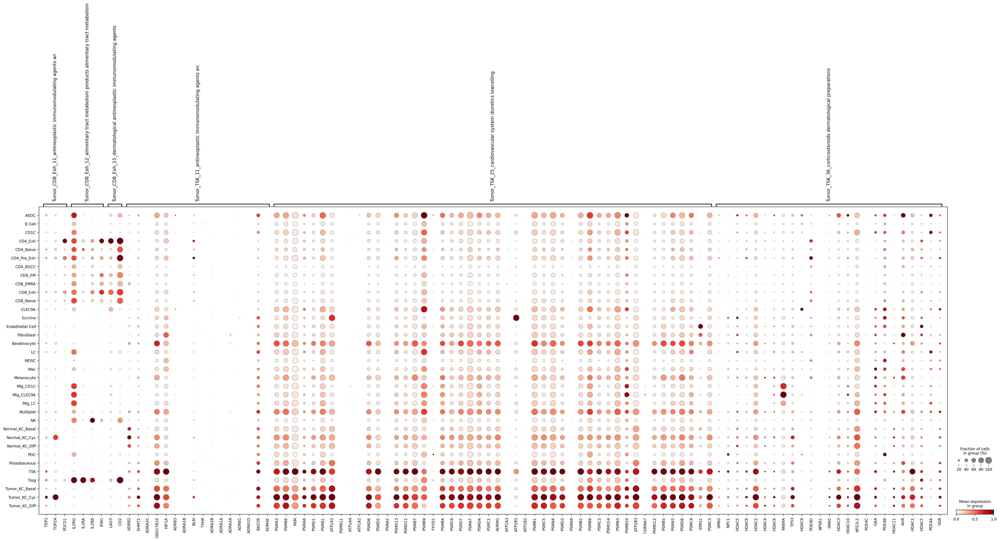

In [130]:
marker_df_concatenated_dict = marker_df_concatenated.groupby('clus_mechanism')['gene'].apply(list).to_dict()

drug_to_genes_dict = {}
for cluster, drugs in marker_df_concatenated_dict.items():
    # For each drug in the cluster, retrieve genes if the drug is in the index of adata_tt.obs
    drug_to_genes_dict[cluster] = {drug: adata_tt.obs.loc[drug, 'genes'] if drug in adata_tt.obs.index else None for drug in drugs}

# Initialize flat_dict outside the loop to avoid overwriting it in each iteration
flat_dict = {}

# Flatten the dictionary to store all genes per cluster-mechanism as separate strings in a list
for cluster, drugs in drug_to_genes_dict.items():
    gene_set = set()  # Use a set to avoid duplicate gene entries
    for drug_genes in drugs.values():
        if drug_genes:  # Ensure drug_genes is not None
            gene_set.update(drug_genes.split(','))  # Split string and update the set
    flat_dict[cluster] = list(gene_set)  # Store genes as a list of separate strings
    
# Iterate through each cluster in the original flat_dict
first_instance_dict = {}
seen_genes = set()
for cluster, genes in flat_dict.items():
    # Filter genes that haven't been added yet
    unique_genes = [gene for gene in genes if gene not in seen_genes]
    # Update the seen_genes with the new unique genes for this cluster
    seen_genes.update(unique_genes)
    # Only add to first_instance_dict if there are any unique genes left
    if unique_genes:
        first_instance_dict[cluster] = unique_genes
print(first_instance_dict)
(sc.pl.dotplot(adata_x_i, var_names = first_instance_dict, groupby='level3_celltype',dendrogram=False,standard_scale='var', color_map='Reds', show = True,save = 'all_targetted_genes_TSK_CD8')) # title=i

# for cluster, genes in flat_dict.items():
#     # Only proceed if there are genes to plot
#     if genes:
#         sc.pl.dotplot(adata_x_i, var_names=genes, groupby='level3_celltype',
#                       dendrogram=False, standard_scale='var', color_map='Reds',
#                       title=f"Dotplot for {cluster}", show=True)
#     else:
#         print(f"No genes to plot for cluster: {cluster}")

# Plot the hull representation of mechanisms

In [ ]:
sc.tl.embedding_density(adata_tt, basis='umap', groupby='cluster_sem')
for group in marker_df_concatenated['cluster'].unique():
    print(group)
    grp = list(marker_df_concatenated.loc[marker_df_concatenated['cluster'].isin([group]),'cluster_sem'].astype('category').cat.categories)
    sc.pl.embedding_density(adata_tt, basis='umap', key=None, groupby='cluster_sem', group=grp, color_map='YlOrRd', bg_dotsize=80, fg_dotsize=180, vmax=1, vmin=0, vcenter=None, norm=None, ncols=4, hspace=0.25)

In [99]:
for group in marker_df_concatenated['cluster'].unique():
    print(group)
    grp = list(marker_df_concatenated.loc[marker_df_concatenated['cluster'].isin([group]),'cluster_sem'].astype('category').cat.categories)
grp

Tumor_CD8_Exh
Tumor_TSK


['11_antineoplastic immunomodulating agents an',
 '25_cardiovascular system diuretics lowceiling',
 '36_corticosteroids dermatological preparations']

/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


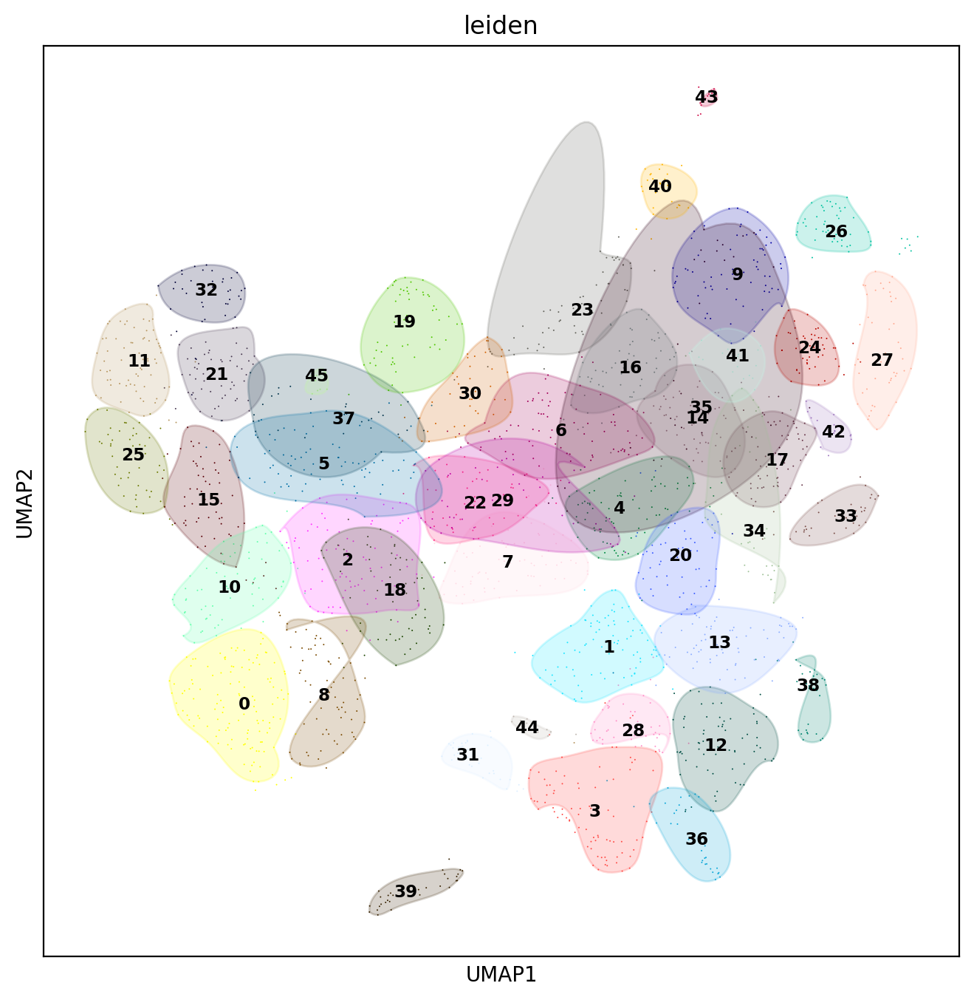

In [113]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial import ConvexHull, distance
from scipy import interpolate
from sklearn.cluster import KMeans
from sklearn.neighbors import NearestNeighbors
import scanpy as sc

def plot_clusters(data, var, embedding='X_umap', n_neighbors=3, interp_points=100):
    # Filter data by tissue

    fig, ax = plt.subplots(figsize=(8, 8))
     # Extracting colors for each leiden cluster
    leiden_colors = data.uns[f'{var}_colors']
    unique_clusters = data.obs[var].unique().astype(int)
    col_pal = {str(cluster): leiden_colors[cluster] for cluster in unique_clusters}


    # Plot UMAP with the colors
    sc.pl.umap(data, color=var, legend_loc='on data', size=2, legend_fontsize='small', ax=ax, show=False, palette=col_pal)

    umap_coord = pd.DataFrame(data.obsm[embedding], columns=['dim_1', 'dim_2'])
    umap_coord['cluster'] = data.obs[var].values

    for i in umap_coord.cluster.unique():
        points = umap_coord[umap_coord.cluster == i][['dim_1', 'dim_2']].values

        # KMeans to find the centroid
        kmeans = KMeans(n_clusters=1).fit(points)
        centroid_distance = pd.DataFrame(distance.cdist(points, kmeans.cluster_centers_, 'euclidean'))
        points = points[centroid_distance[0] <= centroid_distance[0].mean() + 1.96 * centroid_distance[0].std()]

        # KNN to filter outliers
        neigh = NearestNeighbors(n_neighbors=n_neighbors, n_jobs=-1)
        neigh.fit(points)
        dist, _ = neigh.kneighbors(points)
        distances = pd.DataFrame([dist[i][n_neighbors - 1] for i in range(len(dist))])
        points = points[distances[0] <= distances[0].mean() + 1.96 * distances[0].std()]

        # Convex hull
        if len(points) > 3:  # ConvexHull needs at least 3 points
            hull = ConvexHull(points)
            x_hull = np.append(points[hull.vertices, 0], points[hull.vertices, 0][0])
            y_hull = np.append(points[hull.vertices, 1], points[hull.vertices, 1][0])

            # Interpolation for smoother shape
            dist_along = np.concatenate(([0], np.sqrt(np.diff(x_hull)**2 + np.diff(y_hull)**2).cumsum()))
            spline, _ = interpolate.splprep([x_hull, y_hull], u=dist_along, s=0)
            interp_d = np.linspace(dist_along[0], dist_along[-1], interp_points)
            interp_x, interp_y = interpolate.splev(interp_d, spline)

            # Plotting
            ax.fill(interp_x, interp_y, '--', c=col_pal[i], alpha=0.2)

    plt.show()

# Example usage
plot_clusters(data=adata_tt, var='leiden', embedding='X_umap')

/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


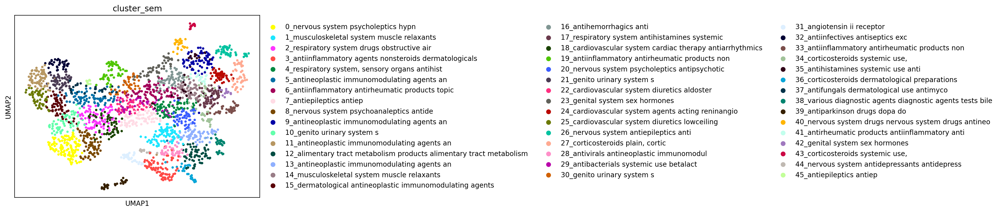

In [129]:
sc.pl.umap(adata_tt,color = 'cluster_sem')

# plot hull for each target set of mechanisms

Plotting for group: Tumor_CD8_Exh


/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/contextlib.py:142: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)
/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


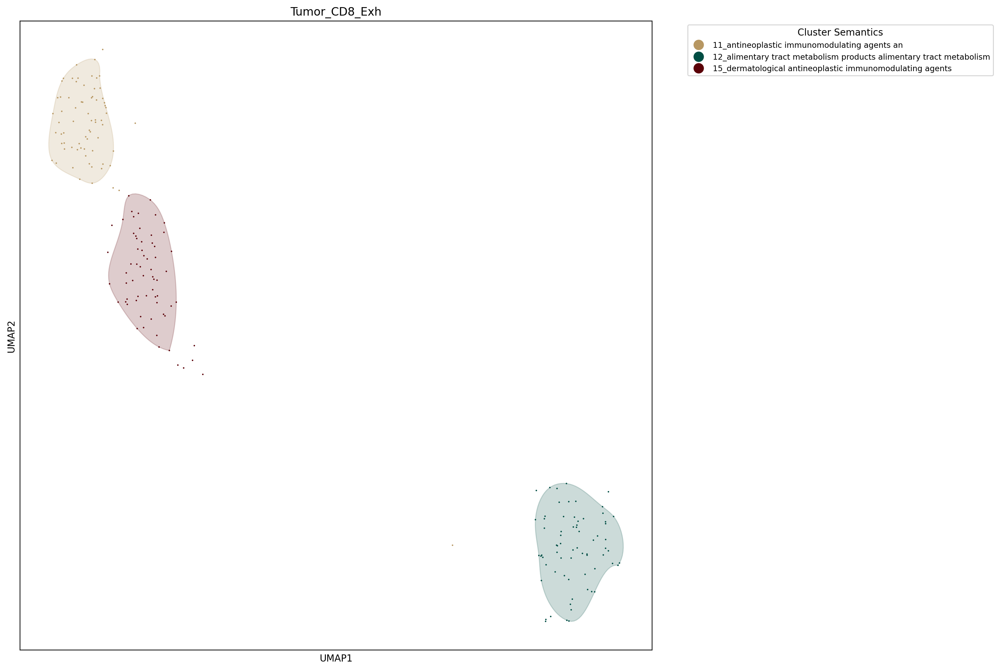

Plotting for group: Tumor_TSK


/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/contextlib.py:142: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)
/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


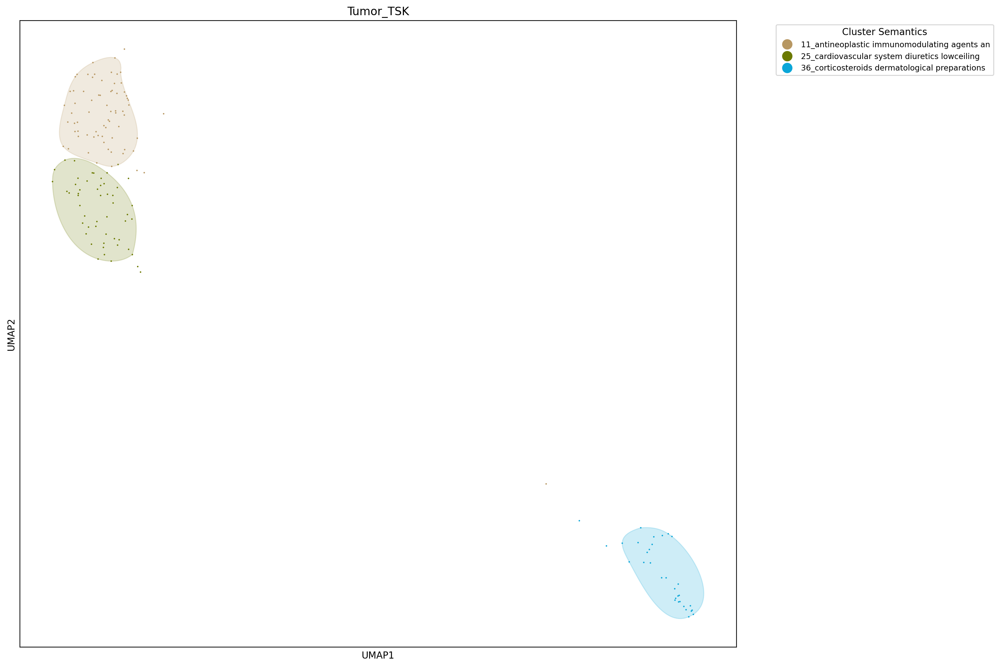

In [116]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial import ConvexHull, distance
from scipy import interpolate
from sklearn.cluster import KMeans
from sklearn.neighbors import NearestNeighbors
import scanpy as sc

def plot_clusters(data, var, group, title, embedding='X_umap', n_neighbors=3, interp_points=100):
    # Filtering data for the specific group's cluster_sem
    group_data = data[data.obs['cluster_sem'].isin(group)]
    
    if group_data.n_obs > 0:
        fig, ax = plt.subplots(figsize=(15, 10))  # Adjusted for side legend
        
        # Extracting colors for each cluster present in the subset
        unique_clusters = group_data.obs[var].unique().astype(str)
        leiden_colors = data.uns[f'{var}_colors']  # Original complete color mapping
        
        # Build a color palette only for the clusters present in the subset
        col_pal = {cluster: leiden_colors[int(cluster)] for cluster in unique_clusters if cluster.isdigit()}

        # Plot UMAP with the colors
        sc.pl.umap(group_data, color=var, legend_loc='on_data', size=10, legend_fontsize='small', ax=ax, show=False, palette=col_pal, title=title)

        umap_coord = pd.DataFrame(group_data.obsm[embedding], columns=['dim_1', 'dim_2'])
        umap_coord['cluster'] = group_data.obs[var].values
        umap_coord['cluster_sem'] = group_data.obs['cluster_sem'].values

        # Collect handles and labels for the legend from cluster_sem
        handles, labels = [], []
        for label, df in umap_coord.groupby('cluster_sem'):
            cluster_id = df['cluster'].astype(str).iloc[0]
            color = col_pal[cluster_id]
            handles.append(plt.Line2D([0], [0], marker='o', color=color, linestyle='', markersize=10, label=label))
            labels.append(label)

        for i in umap_coord['cluster'].unique():
            points = umap_coord[umap_coord['cluster'] == i][['dim_1', 'dim_2']].values

            # KMeans to find the centroid and filter points using distance
            kmeans = KMeans(n_clusters=1).fit(points)
            centroid_distance = pd.DataFrame(distance.cdist(points, kmeans.cluster_centers_, 'euclidean'))
            points = points[centroid_distance[0] <= centroid_distance[0].mean() + 1.96 * centroid_distance[0].std()]

            # KNN to filter outliers
            neigh = NearestNeighbors(n_neighbors=n_neighbors)
            neigh.fit(points)
            dist, _ = neigh.kneighbors(points)
            distances = pd.DataFrame([dist[i][n_neighbors - 1] for i in range(len(dist))])
            points = points[distances[0] <= distances[0].mean() + 1.96 * distances[0].std()]

            # Convex hull computation and interpolation for smoother shape
            if len(points) > 3:
                hull = ConvexHull(points)
                x_hull = np.append(points[hull.vertices, 0], points[hull.vertices, 0][0])
                y_hull = np.append(points[hull.vertices, 1], points[hull.vertices, 1][0])
                dist_along = np.concatenate(([0], np.sqrt(np.diff(x_hull)**2 + np.diff(y_hull)**2).cumsum()))
                spline, _ = interpolate.splprep([x_hull, y_hull], u=dist_along, s=0)
                interp_d = np.linspace(dist_along[0], dist_along[-1], interp_points)
                interp_x, interp_y = interpolate.splev(interp_d, spline)
                ax.fill(interp_x, interp_y, '--', c=col_pal[i], alpha=0.2)

        # Add legend to the plot
        ax.legend(handles=handles, title='Cluster Semantics', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
        plt.tight_layout()
        plt.show()
    else:
        print(f"No data to plot for group: {group}")

# Loop through each group in marker_df_concatenated
for group in marker_df_concatenated['cluster'].unique():
    print(f"Plotting for group: {group}")
    grp = list(marker_df_concatenated.loc[marker_df_concatenated['cluster'].isin([group]), 'cluster_sem'].astype('category').cat.categories)
    plot_clusters(data=adata_tt, var='leiden', group=grp, title=group, embedding='X_umap')
